<h1><span style='font-family: "Trebuchet MS", Helvetica, sans-serif;'>Automatic Ticket Classification - EDA
</span></h1>

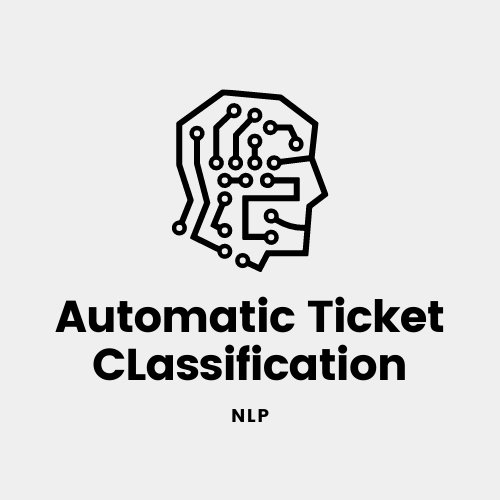

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# imports

import os
import math
import xlrd
import hjson
import random
import warnings
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from wordcloud import WordCloud, STOPWORDS
from ftfy import fix_text
from sklearn.preprocessing import LabelEncoder
import tensorflow
from utils.utils import load_hjson
config = load_hjson(Path('./config/config.hjson'))

tqdm.pandas()
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

C:\Users\surya\anaconda3\envs\full\lib\site-packages\tqdm\std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [4]:
# check encoding
with open('./data/input_data.xlsx', 'r') as fp:
    print(fp)

<_io.TextIOWrapper name='./data/input_data.xlsx' mode='r' encoding='cp1252'>


In [5]:
wb = xlrd.open_workbook('./data/input_data.xlsx', encoding_override='cp1252')
dataset = pd.read_excel(wb)
dataset.sample(7)

,Short description,Description,Caller,Assignment group
6770,bitte einen arbeitszeitplan erstellen fÃ¼r die...,bitte einen arbeitszeitplan erstellen fÃ¼r die...,ltxzfcgm sxvigclz,GRP_52
4976,"please check the ale in detail, we have ongoin...",please have a close look on the ale interface ...,pesylifc wnyierbu,GRP_20
3273,account unlock - erp SID_34,unlocked account using password_management_too...,wgpimkle kijhcwur,GRP_0
167,user needs training to use engineering tool to...,user needs training to use engineering tool to...,rkzqjbwc juizkwpl,GRP_0
1838,unable to access erp,unable to access erp \n\nuser contacted for an...,edqylkio ykomciav,GRP_2
1340,job Job_563 failed in job_scheduler at: 10/15/...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
7970,abended job in job_scheduler: Job_1320,received from: monitoring_tool@company.com\r\n...,ZkBogxib QsEJzdZO,GRP_9


In [6]:
dataset.shape  # very small dataset with only 8500 rows

(8500, 4)

In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [8]:
# rename column names for convenience
dataset = dataset.rename(columns={
    "Short description": "short_description",
    "Description": "description",
    "Caller": "caller",
    "Assignment group": "group"
    })

In [10]:
np.unique(dataset.group), len(np.unique(dataset.group))  # 74 different functional groups

(array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
        'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
        'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
        'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
        'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
        'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
        'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
        'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
        'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
        'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
        'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
        'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
       dtype=object),
 74)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Check for Incomplete Information</span></strong></li>
</ul></h3>

In [11]:
dataset.isna().sum()  # Few missing values

short_description    8
description          1
caller               0
group                0
dtype: int64

In [12]:
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [13]:
dataset.loc[dataset['description'].isna()]

,short_description,description,caller,group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [14]:
dataset.iloc[4395]

short_description    i am locked out of skype
description                               NaN
caller                      viyglzfo ajtfzpkb
group                                   GRP_0
Name: 4395, dtype: object

In [15]:
# imputing the short description by value in description and vice-versa
# However, If both columns were missing, we would have to drop the row
dataset.loc[dataset['description'].isna(), 'description']  = dataset.loc[dataset['description'].isna()].short_description

In [16]:
dataset.loc[dataset['short_description'].isna()]

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


In [17]:
dataset.loc[dataset['short_description'].isna(), 'short_description']  = dataset.loc[dataset['short_description'].isna()].description

In [18]:
dataset.isna().sum()  # all missing values imputed

short_description    0
description          0
caller               0
group                0
dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Target Class Distribution</span></strong></li>
</ul></h3>

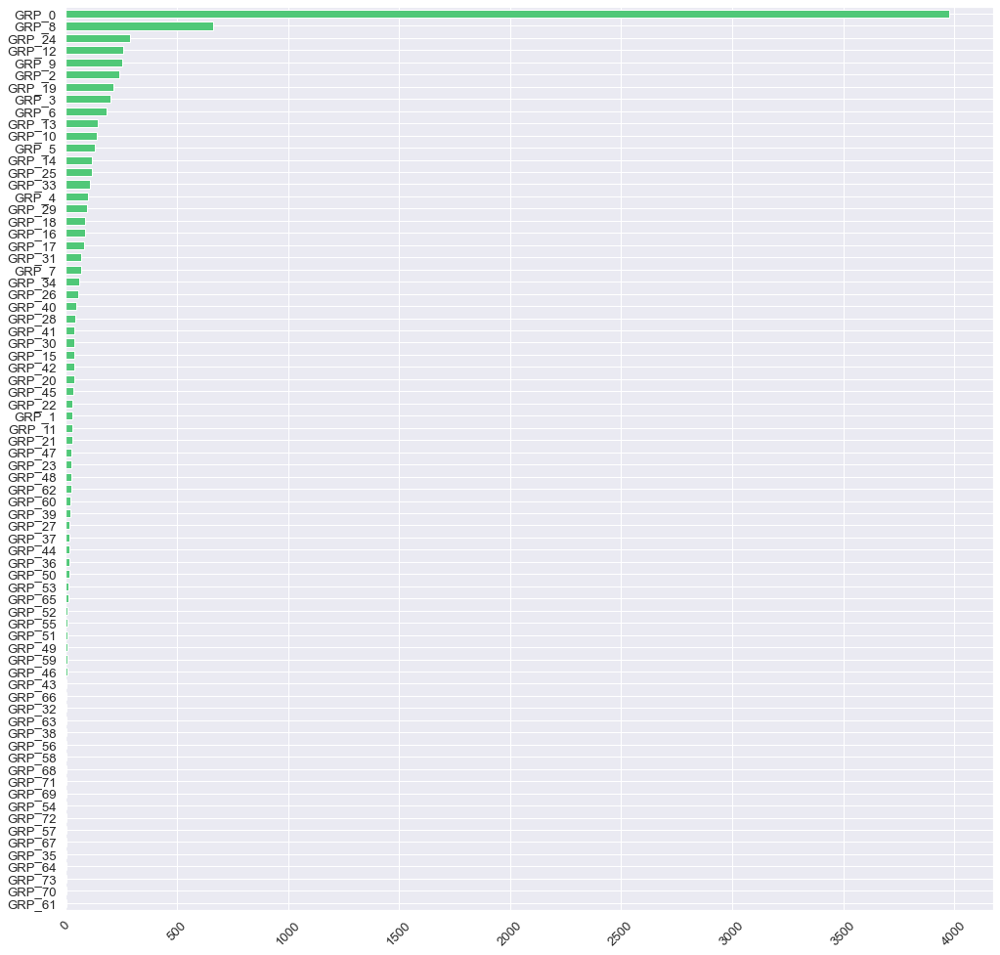

In [19]:
sns.set(font_scale=1.2)  # scale up font size
dataset.group.value_counts().sort_values(ascending=True).plot(kind='barh', width=0.65, figsize=(17, 17), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [20]:
dataset.group.value_counts().sort_values(ascending=False).tail(30)  # few classes with only single-digit datapoints

GRP_44    15
GRP_36    15
GRP_50    14
GRP_53    11
GRP_65    11
GRP_52     9
GRP_55     8
GRP_51     8
GRP_49     6
GRP_59     6
GRP_46     6
GRP_43     5
GRP_66     4
GRP_32     4
GRP_63     3
GRP_38     3
GRP_56     3
GRP_58     3
GRP_68     3
GRP_71     2
GRP_69     2
GRP_54     2
GRP_72     2
GRP_57     2
GRP_67     1
GRP_35     1
GRP_64     1
GRP_73     1
GRP_70     1
GRP_61     1
Name: group, dtype: int64

In [21]:
dataset[dataset.group == 'GRP_70']  # small groups have to merged into a separate "Others" category
dataset[dataset.group == 'GRP_70'].description.tolist()[0]

'an e-mail from  it training has email hints and tips #1.  under "create signature" it has a link "company formatheywting standard" that i am forbidden to see.\n615'

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>The target class distribution is heavily imbalanced as most calls are assinged to Group 0 and exluding this as well, we find an imabalanced dataset for the rest of the groups.
 </span></ul></h5>

In [22]:
temp = dataset.copy(deep=True)
temp.loc[temp["group"] != 'GRP_0', 'group'] = 'Other'
temp.loc[temp["group"] == 'GRP_0', "group"] = 'Group 0'

In [23]:
temp.group.value_counts()

Other      4524
Group 0    3976
Name: group, dtype: int64

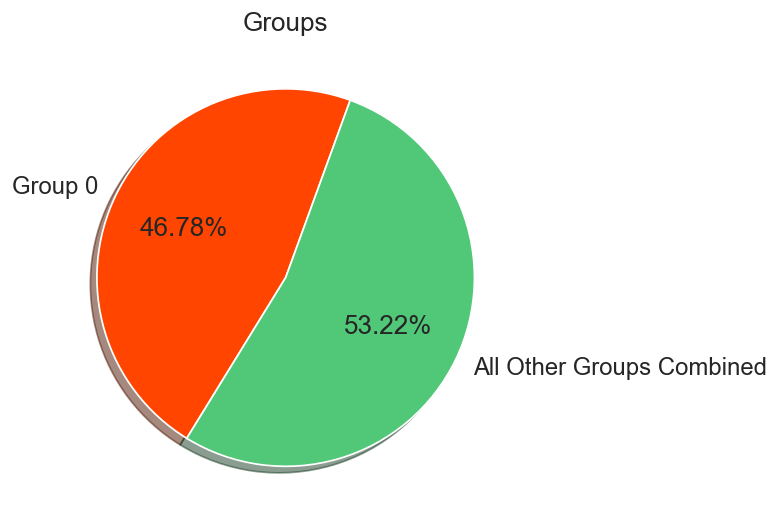

In [24]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
group_0 = len(temp[temp['group'] == 'Group 0'])
others = len(temp[temp['group'] == 'Other'])

plt.pie(x=[group_0, others],
        explode=(0, 0),
        labels=['Group 0', 'All Other Groups Combined'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Groups')
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Choosing a Metric to benchmark model performance</span></strong></li>
</ul></h3>

* This is a multi-class classification problem, where the machine learning model will try to predict if each row is one of the 74 possibilities.
* The majority class is GRP_0, which occurs in 46.78% of the observations.

* The most common metrics for a multi-class classification problem are AUC, F1-score and accuracy.
* Accuracy is not suitable for an imbalanced classification problem. (Note that a model that always predicts GRP_0, will get an accuracy of 46.78%)
* We would choose F1-score if the majority class is more important than the smaller classes.
* We would choose AUC if we also care about the smaller classes.

#### As we want to be able to classify the tickets into all functional groups and functional groups are given equal importance, we choose AUC as the final metric to score model performance.

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outlier Analysis</span></strong></li>
</ul></h3>

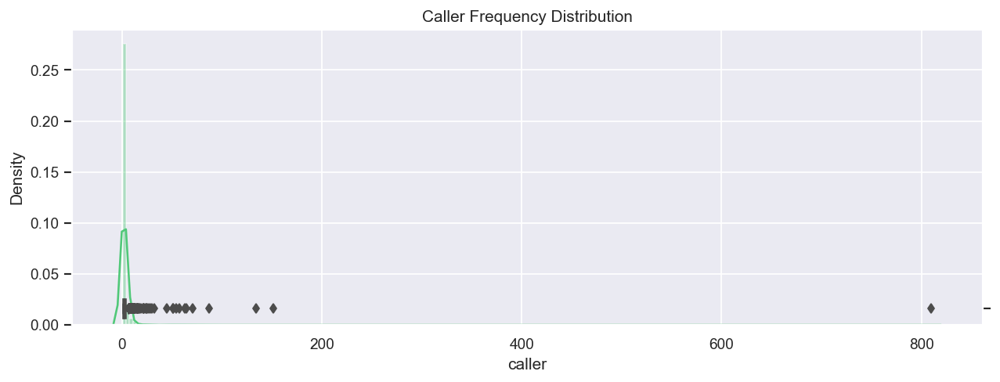

In [25]:
# plotting caller frequency counts
sns.set()
plt.figure(figsize=(12, 4), dpi=125)
ax = sns.distplot(dataset.caller.value_counts(), bins=250, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.caller.value_counts(), color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Caller Frequency Distribution')
plt.show()

In [26]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp'].group.value_counts()  # most frequent caller

GRP_8     362
GRP_9     153
GRP_5      96
GRP_6      89
GRP_10     60
GRP_60     16
GRP_12      8
GRP_45      7
GRP_1       6
GRP_13      4
GRP_18      3
GRP_47      2
GRP_57      1
GRP_44      1
GRP_29      1
GRP_14      1
Name: group, dtype: int64

In [27]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp']  # job failure alerts

,short_description,description,caller,group
47,job Job_1424 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
50,job mm_zscr0099_dly_merktc3 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
59,job mm_zscr0099_dly_merktc2 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
60,job Job_3181 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
67,job Job_1338 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
...,...,...,...,...
7053,job Job_1387 failed in job_scheduler at: 08/18...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
7059,job Job_2063b failed in job_scheduler at: 08/1...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
7074,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
7076,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8


In [28]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
    except Exception:  # assign 0 length to missing rows if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:31<00:00, 266.93it/s]


In [29]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
5038,"unable to connect to dv28, dv06, and dv40","unable to connect to dv28, dv06, and dv40",iwtvrhnz rxiumhfk,GRP_0,41,8,41,8
2439,do i have to worry about this?,\r\n\r\nreceived from: hbmwlprq.ilfvyodx@gmail...,hbmwlprq ilfvyodx,GRP_0,123,9,30,7
4304,interface: gigabitethernet1/0/47 Â· mtb gf wir...,interface: gigabitethernet1/0/47 Â· mtb gf wir...,rkupnshb gsmzfojw,GRP_4,122,11,122,11
1825,outlook not working correctly,outlook not working correctly & freezing,hvstqfwc buvsrnze,GRP_0,41,6,29,4
31,reset users,hi\n\nplease reset users password\n\nclient id...,qcehailo wqynckxg,GRP_0,64,11,12,2
1697,user needs help to create delivery.,\r\n\r\nreceived from: gjtyswkb.dpvaymxr@gmail...,gjtyswkb dpvaymxr,GRP_0,92,12,35,6
3150,alrthyu s lowe. my ee# is 6045304.it needs to ...,"from: scthyott lortwe \nsent: monday, septembe...",sbvlxuwm yanbikrx,GRP_9,886,128,135,23


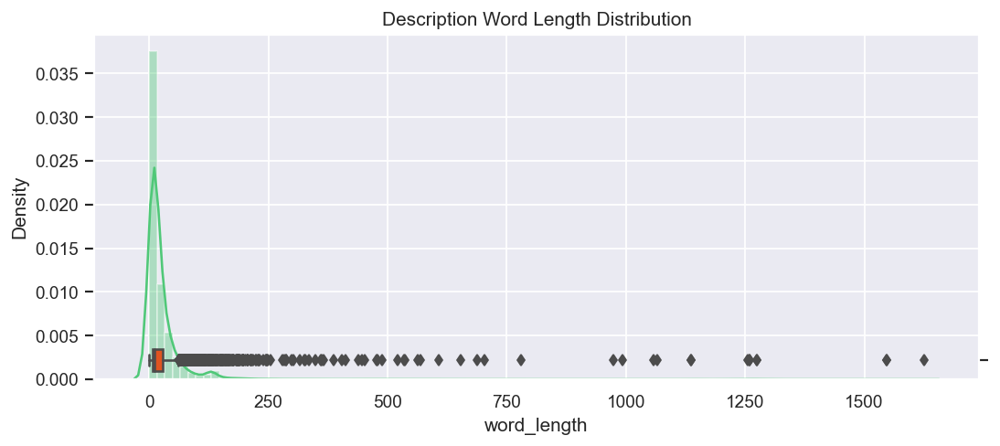

In [30]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.word_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.word_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Description Word Length Distribution')
plt.show()

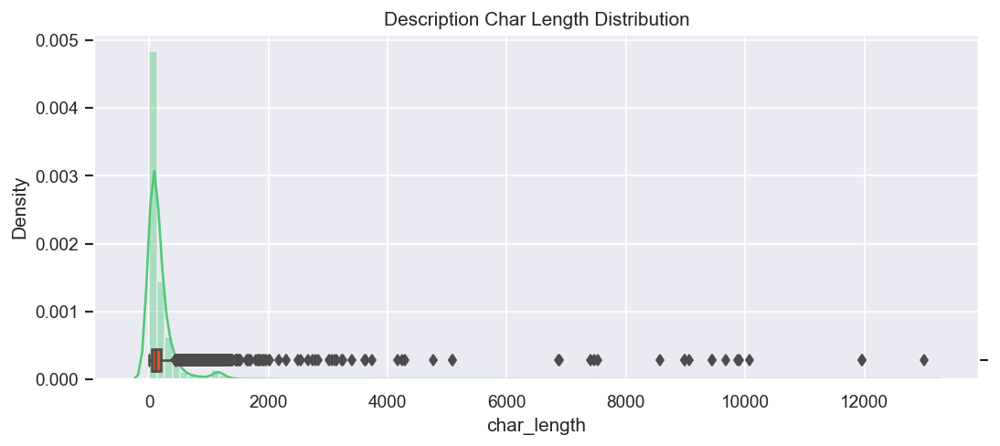

In [31]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.char_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.char_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Description Char Length Distribution')
plt.show()

In [32]:
dataset[dataset.word_length == 0]  # empty description => imputing with the corresponding short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
6371,authorization add/delete members,\r\n\r\n,hpmwliog kqtnfvrl,GRP_0,5,0,33,3
7397,browser issue :,\r\n,fgejnhux fnkymoht,GRP_0,2,0,16,3


In [33]:
dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:01<00:00, 4821.31it/s]


In [34]:
dataset[dataset.word_length == 0]  # cleaned

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [35]:
dataset[dataset.char_length < 4]  # description 'the' holds no information => imputed with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1049,reset passwords for soldfnbq uhnbsvqd using pa...,the,soldfnbq uhnbsvqd,GRP_17,3,1,84,9
1054,reset passwords for fygrwuna gomcekzi using pa...,the,fygrwuna gomcekzi,GRP_17,3,1,84,9
1144,reset passwords for wvdxnkhf jirecvta using pa...,the,wvdxnkhf jirecvta,GRP_17,3,1,84,9
1184,reset passwords for pxvjczdt kizsjfpq using pa...,the,pxvjczdt kizsjfpq,GRP_17,3,1,84,9
1292,reset passwords for cubdsrml znewqgop using pa...,the,cubdsrml znewqgop,GRP_17,3,1,84,9
1476,reset passwords for bnoupaki cpeioxdz using pa...,the,bnoupaki cpeioxdz,GRP_17,3,1,84,9
1558,reset passwords for usa feathers using passwor...,the,lmqysdec ljvbnpqw,GRP_17,3,1,79,9
1693,reset passwords for eglavnhx uprodleq using pa...,the,eglavnhx uprodleq,GRP_17,3,1,84,9
1834,reset passwords for hybiaxlk lawptzir using pa...,the,hybiaxlk lawptzir,GRP_17,3,1,84,9
1850,reset passwords for fylrosuk kedgmiul using pa...,the,fylrosuk kedgmiul,GRP_17,3,1,84,9


In [36]:
dataset[dataset.description == 's']  # holds no actual information with just one letter, has to be dropped

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1860,s,s,gzjtweph mnslwfqv,GRP_0,1,1,1,1


In [37]:
# drop row with description: 's'
dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:01<00:00, 4780.09it/s]


In [38]:
# description 'the' holds no information => imputed with corresponding short_description
dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:01<00:00, 5458.59it/s]


In [39]:
# Single Word descriptions
dataset[dataset.word_length == 1].shape

(41, 8)

In [40]:
# dataset[dataset.word_length == 1].to_csv('./data/Single_Word_Descriptions.csv')
dataset[dataset.word_length == 1].sample(20)  # these have to be cleaned up and imputed later on

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
2267,urgent help required- outlook to crm mfg_toolt...,contact,gonflcmq wmptisvz,GRP_0,8,1,56,8
1704,è´¦æˆ·è¢«é”å®š,ç”¨æˆ·è´¦æˆ·é”å®šï¼Œè¯·æ±‚è§£é”,yvscpgax wdfxytzu,GRP_48,33,1,15,1
1178,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,cyjlqdwm kywiuosn,GRP_30,21,1,21,1
1081,ç”¨å‹è½¯ä»¶é—®é¢˜,"æ‰“å¼€å·²å…³é—­çš„é”€å”®è®¢å•æ—¶ï¼Œæ˜¾ç¤º""ä¸...",bwstnmjh yqumwrsk,GRP_48,101,1,18,1
3315,ç”µè„‘ç³»ç»Ÿå¯åŠ¨è“å±ã€‚,ç”µè„‘ç³»ç»Ÿå¯åŠ¨è“å±ã€‚æ°´ä¸å°å¿ƒæ´’åˆ°ç...,hdungfsc znuhyjkx,GRP_31,60,1,27,1
1955,æœ‰ä¸€ä¸ªé“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€,æœ‰ä¸€é“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€ï¼Œæç¤ºç‰ˆæœ¬ä½Ž,qsfcxzel quwykhno,GRP_30,45,1,30,1
5149,å¼€ä¸äº†æœº,å¼€ä¸äº†æœºï¼Œæ˜¾ç¤ºç³»ç»Ÿåäº†ã€‚,kclhqspo xvugztyc,GRP_30,36,1,12,1
7302,skypeä¼šè®®æ—¶ä¸åŽ»,skypeä¼šè®®ä»Žé‚®ç®±é‡Œçš„é“¾æŽ¥è¿›ä¸åŽ»ã€‚,rekpvblc ufysatml,GRP_30,44,1,20,1
5491,"é›»è…¦å‡ºç¾è—å±,ç„¡æ³•é–‹æ©Ÿ","é€£vpnæ™‚,ç„¡æ³•é€£ä¸Šå¾Œ,é‡è©¦å¾Œ,çªç„¶å‡ºç...",zhpwcdea cboefuis,GRP_31,67,1,31,1
7317,ç”µè„‘æ•…éšœ,è´¨æŽ§éƒ¨æ‹‰åŠ›è¯•éªŒæœºæŽ§åˆ¶ç”µè„‘çš„æ“ä½œç...,kwpzbxvf cvuhoizx,GRP_48,93,1,12,1


In [41]:
dataset[dataset.word_length == 2].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
4414,mii update,mii update,dpuifqeo eglwsfkn,GRP_0,10,2,10,2
2466,outlook error,outlook error,pgrqbizd tolwefig,GRP_0,14,2,14,2
6286,bios update,bios update,jvshydix rzpmnylt,GRP_0,11,2,11,2
3879,erp ticket,erp ticket,nemzycxb xpsgkahw,GRP_0,10,2,11,2
3419,office reinstall,office reinstall,ejvkzobl yijgokrn,GRP_0,16,2,16,2
4951,german call,german call,rbozivdq gmlhrtvp,GRP_0,11,2,11,2
4400,password reset,password reset,hetoyabq rcmliyot,GRP_0,14,2,14,2
3740,upsæ•…éšœ,åˆ¶ç²‰è½¦é—´3æ¥¼psfäº¤æ¢æœºå¤„upsæ•…éšœï¼Œè®¾...,agyvbnwz mxsonkdc,GRP_48,67,2,9,1
5973,outlook freezes.,outlook freezes.,rwhavckz drvxyihj,GRP_0,16,2,16,2
6176,ie settings,ie settings,ijplstng juybetlo,GRP_0,11,2,11,2


In [42]:
dataset[dataset.short_word_length == 0]  # all have short descriptions

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [43]:
dataset[dataset.short_char_length < 3]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3529,PR,create a purchase requisition with purchasing ...,ejvkzobl yijgokrn,GRP_29,201,31,2,1


In [44]:
dataset[dataset.char_length < 4]  

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1


In [45]:
dataset[dataset.word_length > 800]  # security incident logs

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17
3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17
4087,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_39,11968,1547,63,11
4089,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_2,11968,1547,63,11
5092,security incidents - ( #in33578632) : suspicio...,source ip: 29.26.13.3095\r\nsource hostname: H...,gzhapcld fdigznbk,GRP_3,9063,1066,92,11
5433,security incidents - ( #in33765965 ) : possibl...,source ip :10.40.6.221\nsystem name :rqxl85172...,gzhapcld fdigznbk,GRP_2,8575,1057,83,13
7345,security incidents - ( sw #in33501789 ) : broa...,we are seeing activity indicating the host at ...,ugyothfz ugrmkdhx,GRP_2,13001,1625,102,14
7647,security incidents - ( #in33578632) : suspicio...,source ip :\r\nsystem name :\r\nuser name:\r\...,gzhapcld fdigznbk,GRP_2,8991,993,92,11
7982,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\nsystem name : HostNa...,ugyothfz ugrmkdhx,GRP_2,9881,1137,118,17
7984,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\r\nsystem name : Host...,ugyothfz ugrmkdhx,GRP_12,10077,1137,118,17


In [46]:
dataset[dataset.word_length > 200][dataset.word_length < 800]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
238,erp pi and msd crm connectivity issue- serirtc...,hi all\n\nwe have a connectivity issue between...,kgytujhe bonhwzrx,GRP_14,2007,349,67,10
239,printer problem / issue information,please complete all required questions below. ...,dzjxrkae grqczsmx,GRP_3,1294,216,35,5
981,employment status - new non-employee ycgkinov ...,*page down to ensure that all required data fi...,lfikjasz tjbqcmvl,GRP_2,1324,206,75,11
1175,bitte das iphone-6 001 freischalten fÃ¼r mail-...,\n\nreceived from: rtnyumbg.yzemkhbq@gmail.com...,rtnyumbg yzemkhbq,GRP_0,1828,218,54,7
1179,media server disconnect lpapr952(south_amerirt...,received below email from inin tried to ping t...,jloygrwh acvztedi,GRP_8,1839,287,66,5
1577,the printer is defaulting to the usa printer f...,"from: kryuisti turleythy \nsent: wednesday, oc...",hybiaxlk lawptzir,GRP_18,2172,325,114,21
1696,mm:pur_req_ko assign for user: yeyhtung kimthy...,mm:pur_req_ko assign for user: yeyhtung kimthy...,kmnsvzuq euyvihzc,GRP_29,1379,201,72,9
1812,sales orders are not updating with correct del...,this is in reference to so# 35086652\r\n\r\nth...,amunklhx bvrachko,GRP_6,1330,248,58,9
1855,printer problem / issue information -- zebra l...,please complete all required questions below. ...,okfmbqur efzukjsa,GRP_0,1263,207,59,9
2082,printing language sa38 (reporting rfumsv00),please complete all required questions below. ...,ojhiaubp lovgirtm,GRP_33,1335,207,43,5


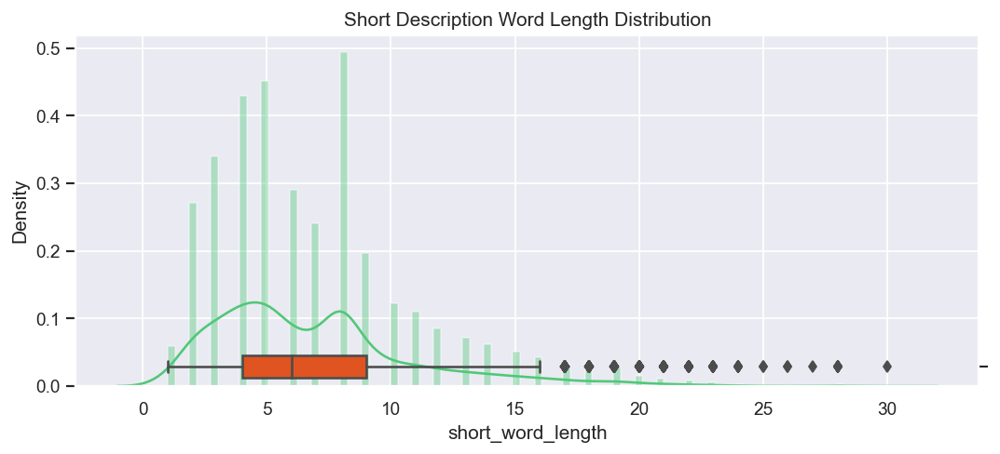

In [47]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_word_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.short_word_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Word Length Distribution')
plt.show()

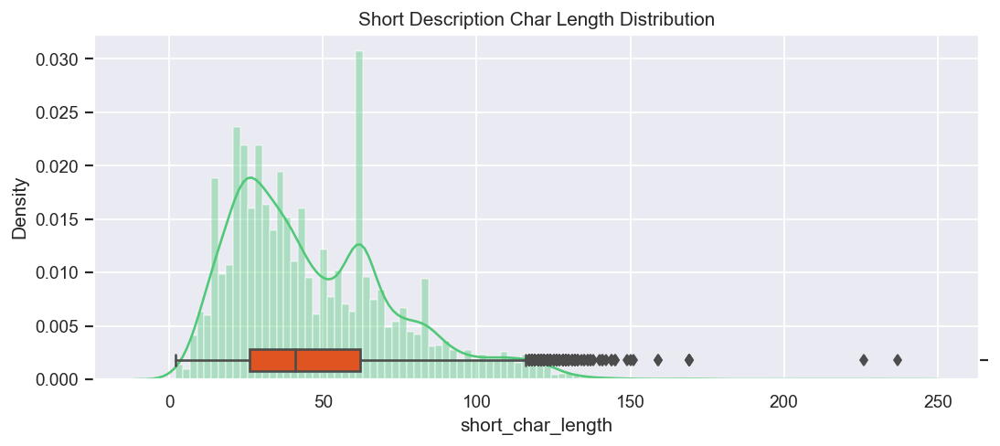

In [48]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_char_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.short_char_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Char Length Distribution')
plt.show()

In [49]:
dataset.describe()

,char_length,word_length,short_char_length,short_word_length
count,8499.000000,8499.000000,8499.000000,8499.000000
mean,204.595246,27.331804,47.386751,6.951759
std,519.530803,65.026307,27.323700,4.158631
min,3.000000,1.000000,2.000000,1.000000
25%,42.000000,6.000000,26.000000,4.000000
50%,106.000000,11.000000,41.000000,6.000000
75%,201.000000,28.000000,62.000000,9.000000
max,13001.000000,1625.000000,237.000000,30.000000


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Most descriptions have between 6 and 28 words long with median at 41 (106 characters) and mean at 27.2 with relatively few outliers ranging till 1625 words!<br>
    <li>Most Short descriptions have between 4 and 9 words long with median at 6 (41 characters) and mean at 6.92 with relatively few outliers ranging till 28 words.<br>
 </span></ul></h5>

In [50]:
def clean_nonsensible_outliers():
    # impute the zero length description with corresponding short description
    dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
     # drop row with description: 's'
    dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
    # description 'the' holds no information => imputed with corresponding short_description
    dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']

# clean_nonsensible_outliers()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Fix Text Encoding</span></strong></li>
</ul></h3>

In [51]:
dataset[dataset.word_length == 1].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1
8266,erpæ— æ³•è¿›è¡Œé‡‡è´­ï¼ˆè½¬ç»™è´ºæ­£å¹³ï¼‰,"è¿›è¡Œé‡‡è´­æ—¶æ˜¾ç¤º""æ‰¾ä¸åˆ°å‘˜å·¥111115483...",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2
1081,ç”¨å‹è½¯ä»¶é—®é¢˜,"æ‰“å¼€å·²å…³é—­çš„é”€å”®è®¢å•æ—¶ï¼Œæ˜¾ç¤º""ä¸...",bwstnmjh yqumwrsk,GRP_48,101,1,18,1
3738,ç”µè¯æ•…éšœ,é“¸æ£’è½¦é—´ç”µè¯æ•…éšœï¼Œ39523850,sbkhjigv pbvlfcse,GRP_48,35,1,12,1
3120,ç”µè„‘ç¡¬ç›˜æ•…éšœï¼Œè¯·æ±‚ç»´ä¿®ã€‚,ç”µè„‘ç¡¬ç›˜æ•…éšœï¼Œè¯·æ±‚ç»´ä¿®ã€‚,ruhbyzpv vlksnjti,GRP_30,36,1,36,1
6534,æ¶‚å±‚ã€ç®¡ä¸è½¦é—´ç”µè¯æ•…éšœ,æ¶‚å±‚ã€ç®¡ä¸è½¦é—´ç”µè¯æ•…éšœï¼Œ40634943ã€...,vrmpysoz qkiucpdx,GRP_48,55,1,33,1
5761,ä¸»æœºä¸èƒ½å¼€å¯,ä¸»æœºä¸èƒ½å¼€å¯ï¼Œç”µæºç¯æ­£å¸¸ï¼Œä¸»æœºé...,cpdilmjx jwsqpiac,GRP_48,71,1,18,1
1452,è€ƒå‹¤ç³»ç»Ÿè¿›ä¸åŽ»è¯·å¤„ç†è°¢è°¢ï¼,è€ƒå‹¤ç³»ç»Ÿè¿›ä¸åŽ»è¯·å¤„ç†è°¢è°¢ï¼,spgdcvhb ocagnpmj,GRP_30,39,1,39,1
1704,è´¦æˆ·è¢«é”å®š,ç”¨æˆ·è´¦æˆ·é”å®šï¼Œè¯·æ±‚è§£é”,yvscpgax wdfxytzu,GRP_48,33,1,15,1
4569,i am not able to connect to my regular printer...,x5380,koiapqbg teyldpkw,GRP_0,6,1,84,16


In [52]:
def fix_text_encoding(row):
    row['description'] = fix_text(row.description)
    row['short_description'] = fix_text(row.short_description)
    return row

dataset = dataset.progress_apply(fix_text_encoding, axis=1)
dataset[dataset.word_length == 1].sample(20)  # translated to proper unicode text in chineese

100%|████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:05<00:00, 1479.63it/s]


,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
5491,"電腦出現藍屏,無法開機","連vpn時,無法連上後,重試後,突然出現藍屏,無法開機",zhpwcdea cboefuis,GRP_31,67,1,31,1
3315,电脑系统启动蓝屏。,电脑系统启动蓝屏。水不小心洒到电脑里面。,hdungfsc znuhyjkx,GRP_31,60,1,27,1
5833,new cpp id can not request initiative. see im...,cphlme01\n,pfzxecbo ptygkvzl,GRP_21,10,1,58,10
5762,打开office 2013显示是未经授权产品,"打开outlook、ppt显示是未经授权产品,望解决。",hbvwqine eakqyovu,GRP_48,59,1,44,2
5311,"系统故障,启动蓝屏.","系统故障,启动蓝屏.",lhkqbmna ekhtivsd,GRP_31,29,1,28,1
5149,开不了机,"开不了机,显示系统坏了。",kclhqspo xvugztyc,GRP_30,36,1,12,1
8266,erp无法进行采购(转给贺正平),"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员""",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2
6534,涂层、管丝车间电话故障,"涂层、管丝车间电话故障,40634943、39523835",vrmpysoz qkiucpdx,GRP_48,55,1,33,1
415,reset passwords for prgewfly ndtfvple using pa...,complete,prgewfly ndtfvple,GRP_17,8,1,84,9
5891,"vpn不能使用,请转给小贺","vpn不能使用,请转给小贺",ehfvwltg eakjbtoi,GRP_0,33,1,33,1


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Keyword Extraction</span></strong></li>
</ul></h3>

In [168]:
print(test)

circuit outage: vogelfontein, south africa mpls circuit is down at 8:14 am et on 08/08


In [169]:
# !pip -q install yake
import yake

language = "en"
max_ngram_size = 5
duplication_threshold = 0.9
numOfKeywords = 1

custom_kw_extractor = yake.KeywordExtractor(lan=language,
                                            n=max_ngram_size,
                                            dedupLim=duplication_threshold,
                                            top=numOfKeywords,
                                            features=None)

In [170]:
k = custom_kw_extractor.extract_keywords(test)
k[0][0]

'south africa mpls circuit'

In [54]:
def get_keywords(row):
    '''Keyword extraction on Keywords and Short Keywords'''
    description_keywords = custom_kw_extractor.extract_keywords(row.description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['description_keywords'] = description_keywords
    description_keywords = custom_kw_extractor.extract_keywords(row.short_description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['short_description_keywords'] = description_keywords
    return row

dataset = dataset.progress_apply(get_keywords, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████| 8499/8499 [01:21<00:00, 104.85it/s]


In [55]:
# TODO: clean caller ids, ..  from descriptions before keyword extraction?
dataset.sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords
3749,unable to log in to erp,unable to log in to erp,uerghtyi erzatqpy,GRP_0,23,6,24,6,unable to log,unable to log
1057,verbindung zwischen drucker em98 und pc eemw81...,verbindung zwischen drucker em98 und pc eemw81...,nemzycxb xpsgkahw,GRP_0,81,11,81,11,kann nicht hergestellt werden,kann nicht hergestellt werden
7289,connection to 'admin2-datacenter-switch04' ;sw...,connection to 'admin2-datacenter-switch04' (pi...,uvrbhlnt bjrmalzi,GRP_53,346,30,120,13,ping,connection
5871,HostName_1010: erpstartsrv.exe service is down.,HostName_1010: erpstartsrv.exe service is down.,rkupnshb gsmzfojw,GRP_14,47,5,47,5,HostName,HostName
5855,outlook not loading,outlook not loading,cighytol yjurztgd,GRP_0,20,3,20,3,outlook not loading,outlook not loading
3247,getting error while accessing it support revie...,pl refer attachment,ginjmaxk zumkvfeb,GRP_19,20,3,82,13,refer attachment,accessing it support review forms
3423,"xerox in our office will not turn on, no power...","xerox in our office will not turn on, no power...",xzcwlqrv fjrdhiqt,GRP_3,86,17,86,17,office will not turn,office will not turn
6935,114 occurrences of your firewall company-europ...,dsw in32075851\n\n=========================\ni...,afkstcev utbnkyop,GRP_12,1233,185,133,11,dropping traffic sourcing from HostName,dropping traffic sourcing from HostName
3413,k100sfs.company.company.com is reporting a : ...,observing below alert in monitoring_tool since...,jloygrwh acvztedi,GRP_14,189,27,94,11,observing below alert in monitoring,HostName
127,update on inplant_874269,update on inplant_874269,rbozivdq gmlhrtvp,GRP_0,24,3,24,3,update on inplant,update on inplant


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Word Frequency Distributions & WordClouds</span></strong></li>
</ul></h3>

In [56]:
# top 50 most frequent words in text
top_N = 50

words = (dataset.description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [57]:
rslt[:50].transpose()

Word,to,the,in,is,from:,and,received,i,on,for,...,can,we,as,access,when,site,am,account,ticket,error
Frequency,6296,6254,3172,2670,2499,2384,2354,2244,1977,1946,...,684,669,665,664,656,654,645,627,605,577


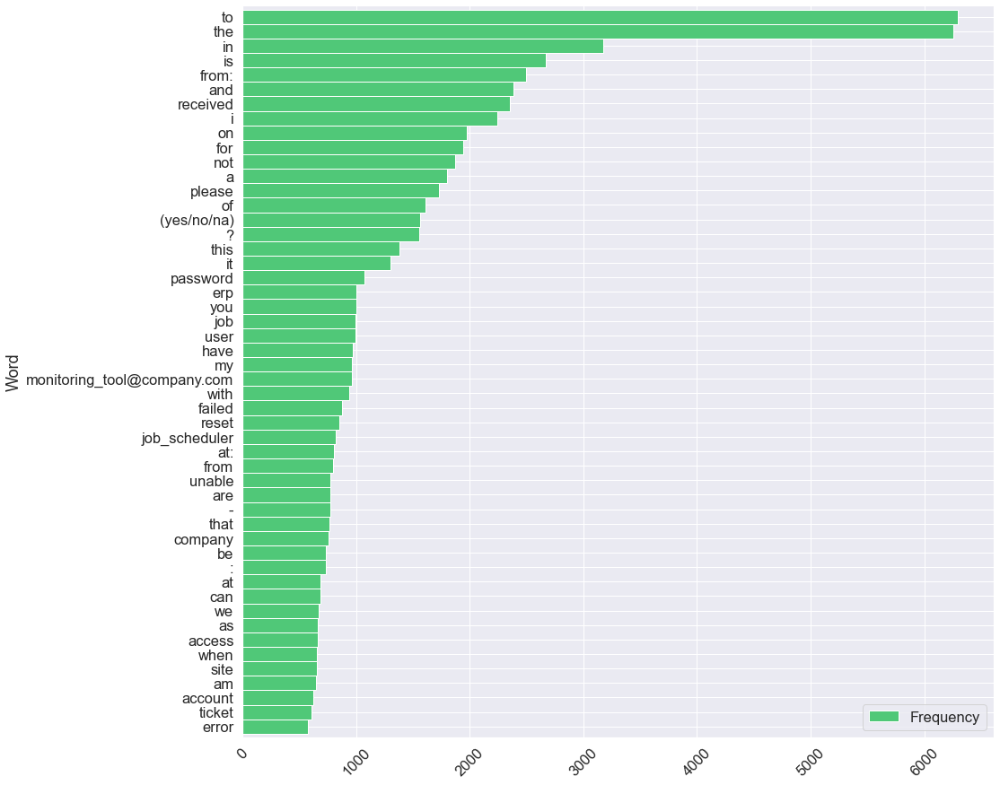

In [58]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [59]:
pprint(rslt.index.tolist(), compact=True)

['to', 'the', 'in', 'is', 'from:', 'and', 'received', 'i', 'on', 'for', 'not',
 'a', 'please', 'of', '(yes/no/na)', '?', 'this', 'it', 'password', 'erp',
 'you', 'job', 'user', 'have', 'my', 'monitoring_tool@company.com', 'with',
 'failed', 'reset', 'job_scheduler', 'at:', 'from', 'unable', 'are', '-',
 'that', 'company', 'be', ':', 'at', 'can', 'we', 'as', 'access', 'when',
 'site', 'am', 'account', 'ticket', 'error']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Stopwords and Anchor words like 'From:', 'Recieved' have to be stripped out
 </span></ul></h5>

In [60]:
# top 50 most frequent words in text
top_N = 50

words = (dataset.short_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [61]:
rslt[:50].transpose()

Word,to,in,not,job,on,is,password,erp,failed,job_scheduler,...,with,i,my,crm,ticket,windows,/,am,password_management_tool,network
Frequency,2167,1737,981,976,917,856,847,822,822,811,...,193,191,187,185,182,177,177,168,161,155


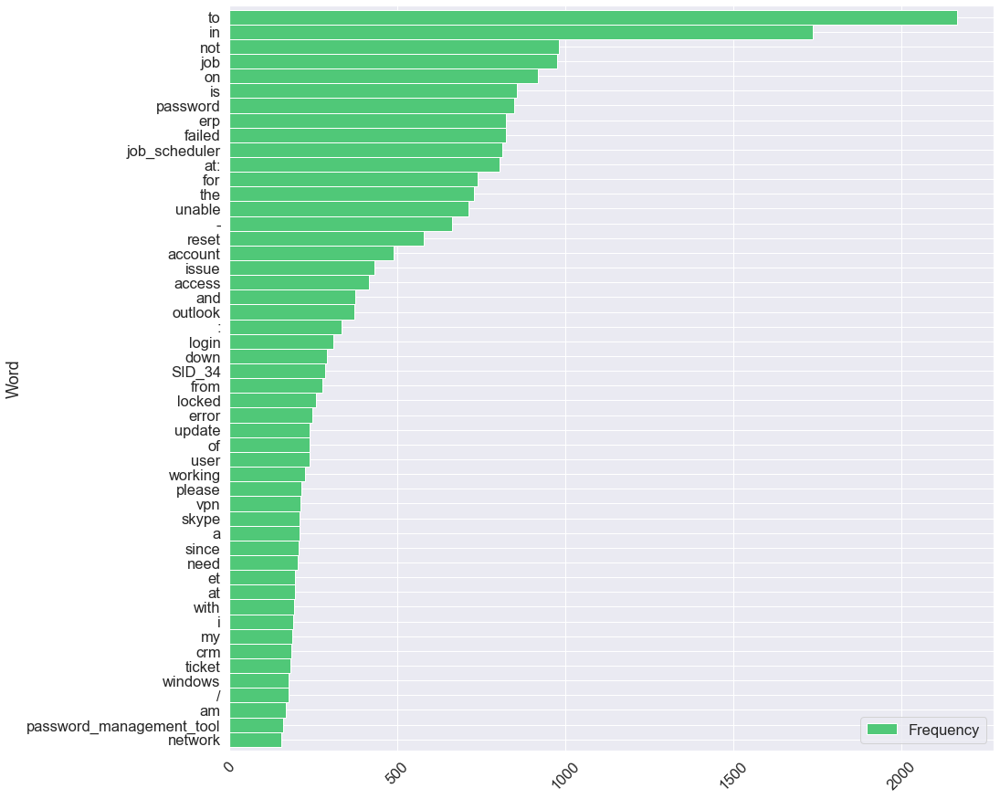

In [62]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [63]:
pprint(rslt.index.tolist(), compact=True)

['to', 'in', 'not', 'job', 'on', 'is', 'password', 'erp', 'failed',
 'job_scheduler', 'at:', 'for', 'the', 'unable', '-', 'reset', 'account',
 'issue', 'access', 'and', 'outlook', ':', 'login', 'down', 'SID_34', 'from',
 'locked', 'error', 'update', 'of', 'user', 'working', 'please', 'vpn', 'skype',
 'a', 'since', 'need', 'et', 'at', 'with', 'i', 'my', 'crm', 'ticket',
 'windows', '/', 'am', 'password_management_tool', 'network']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Many stopwords are occuring most frequently in the dataset. We might need to use stopword removal in our pre-processing if it improves the model performance.
 </span></ul></h5>

In [64]:
descr_string = ""
for description in dataset['description']:
    descr_string += description
    descr_string += " "

short_descr_string = ""
for description in dataset['short_description']:
    short_descr_string += description
    short_descr_string += " "

grp0_string = ""
for description in temp.loc[temp.group == 'Group 0', 'description']:
    grp0_string += description
    grp0_string += " "

other_string = ""
for description in temp.loc[temp.group == 'Other', 'description']:
    other_string += description
    other_string += " "

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Descriptions WordCloud</span></strong></li>
</ul></h4>

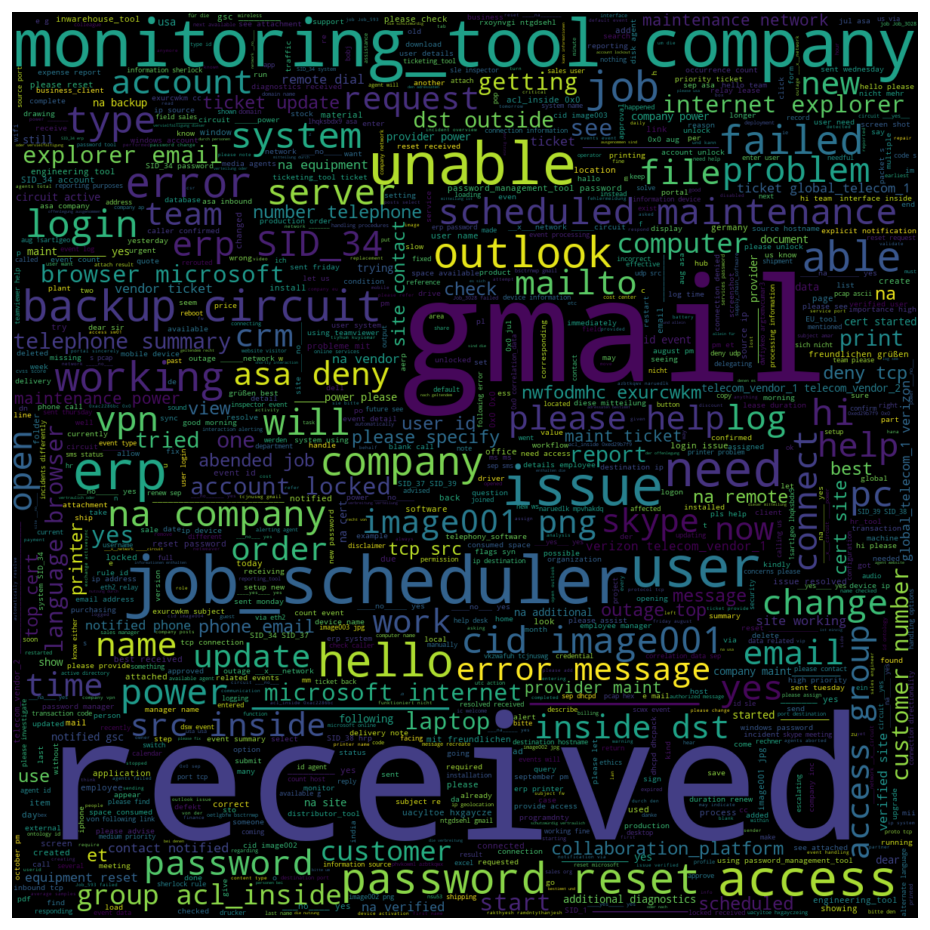

In [65]:
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Short Descriptions WordCloud</span></strong></li>
</ul></h4>

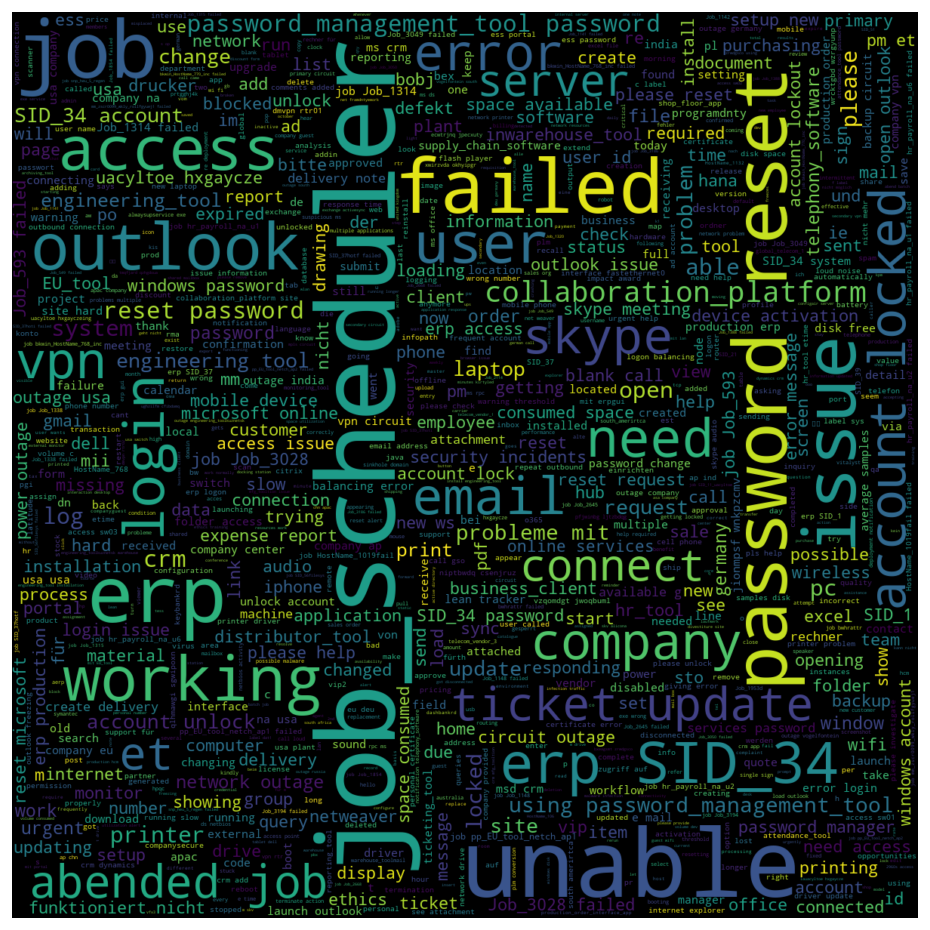

In [66]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(short_descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Group 0 Descriptions WordCloud</span></strong></li>
</ul></h4>

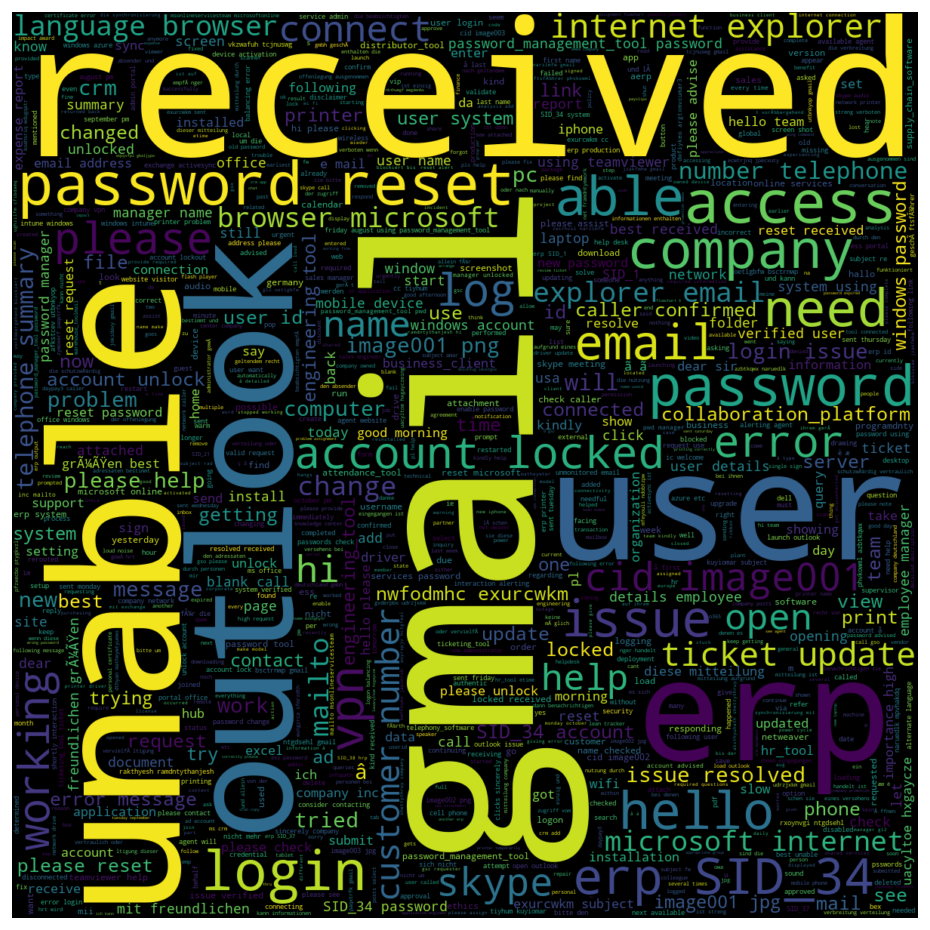

In [67]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(grp0_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Other Groups Descriptions WordCloud</span></strong></li>
</ul></h4>

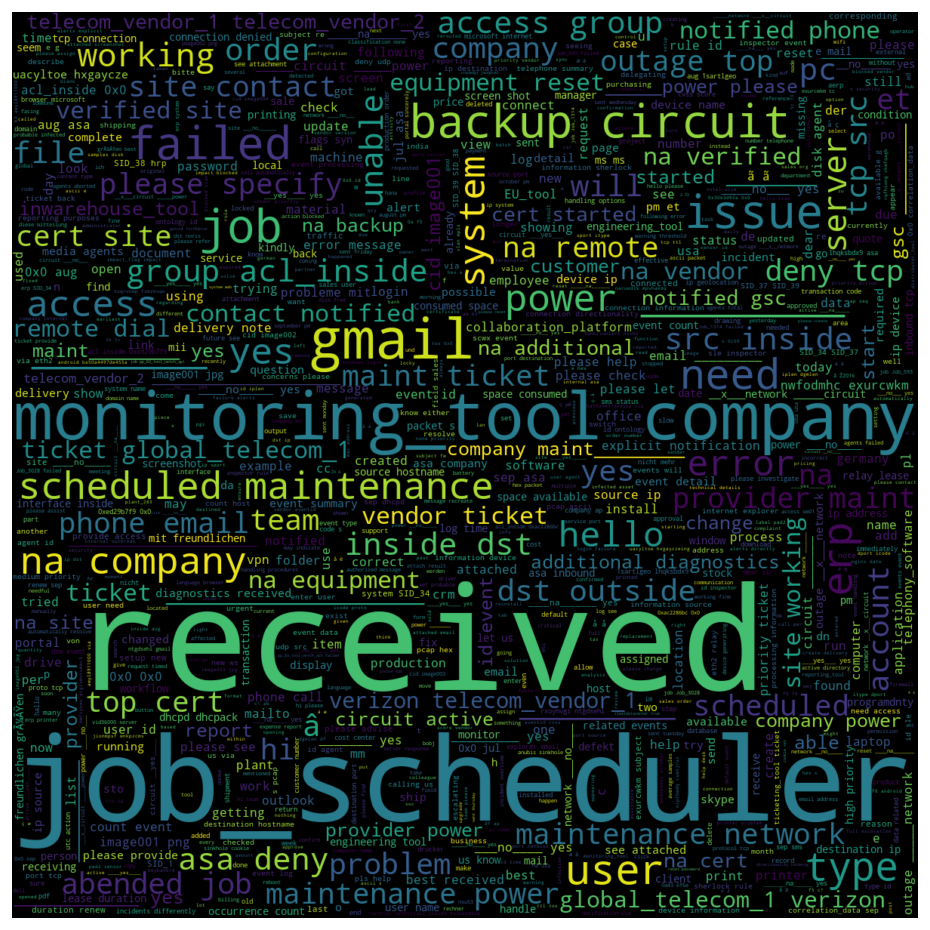

In [68]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(other_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Short Descriptions
 </span></ul></h4>

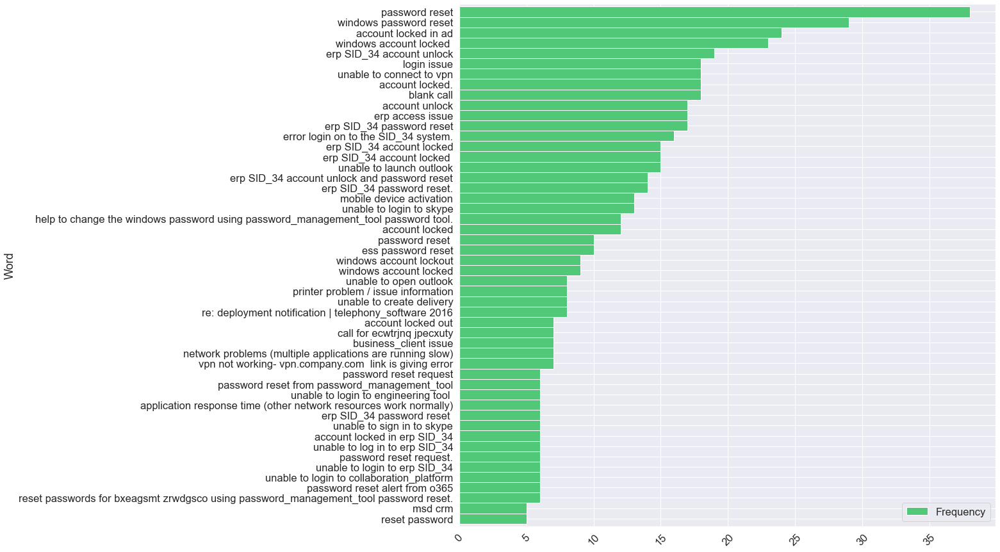

In [69]:
top_N = 50
rslt = pd.DataFrame(Counter(dataset.short_description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Descriptions
 </span></ul></h4>

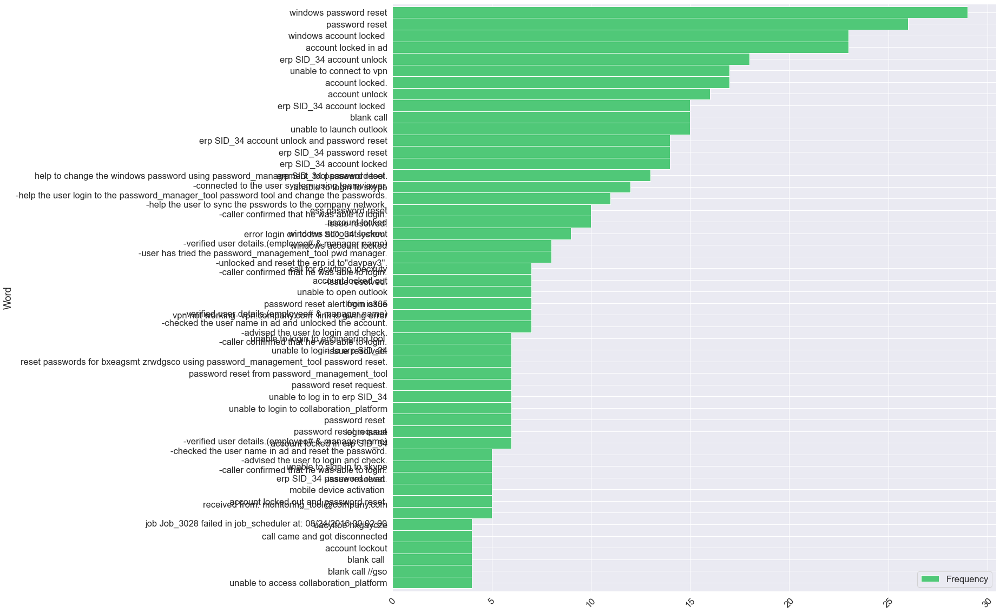

In [70]:
top_N = 50
rslt = pd.DataFrame(Counter(dataset.description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(20, 20), color='#50C878')
plt.xticks(rotation=45)
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Description Lengths vs. Functional Group</span></strong></li>
</ul></h3>

In [71]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code
7627,abended job in job_scheduler: Job_1989,received from: monitoring_tool@company.com\n\n...,ZkBogxib QsEJzdZO,GRP_6,106,11,38,5,abended job in job,abended job in job,56
2163,configair server not available in production (...,configair server not available in production (...,iavozegx jpcudyfi,GRP_14,95,13,95,13,configair server,configair server,6
4778,job Job_1148 failed in job_scheduler at: 09/11...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_9,106,11,62,8,job Job,job Job,73
5933,msc not communicating with erp,name:tmyeqika hfudpeot\nlanguage:\nbrowser:mic...,tmyeqika hfudpeot,GRP_18,174,15,30,5,microsoft internet explorer email,msc not communicating with erp,10
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,46,9,46,9,engineering tool and skype,engineering tool and skype,0
6992,probleme mit erpgui \tmqfjard qzhgdoua,probleme mit erpgui \tmqfjard qzhgdoua,tmqfjard qzhgdoua,GRP_24,38,5,38,5,probleme mit erpgui,probleme mit erpgui,17
1490,lean tracker,\n\nreceived from: sdbcpvtx.hzpctsla@gmail.com...,sdbcpvtx hzpctsla,GRP_0,207,26,12,2,mithyke tayjuoylor and arithel shfsako,lean tracker,0


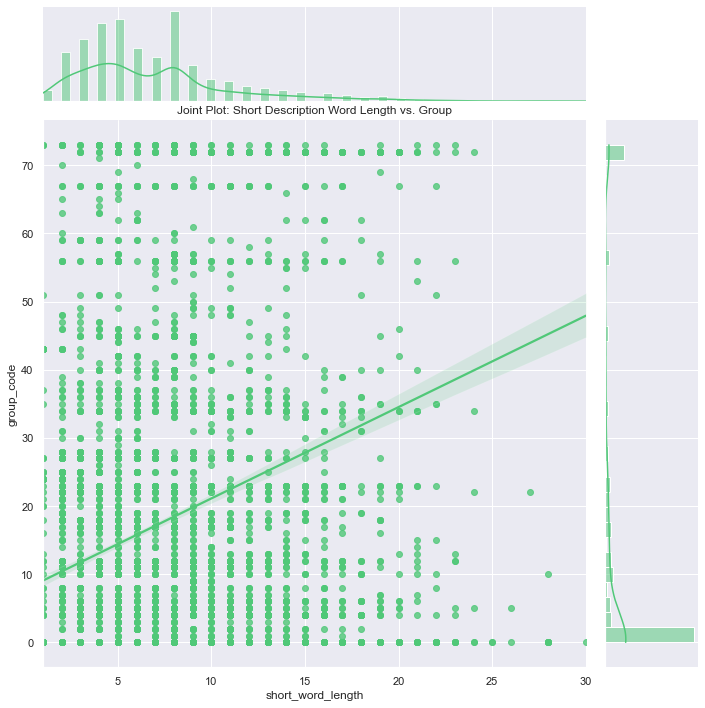

In [72]:
sns.set()
sns.jointplot(dataset.short_word_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Short Description Word Length vs. Group')
plt.show()

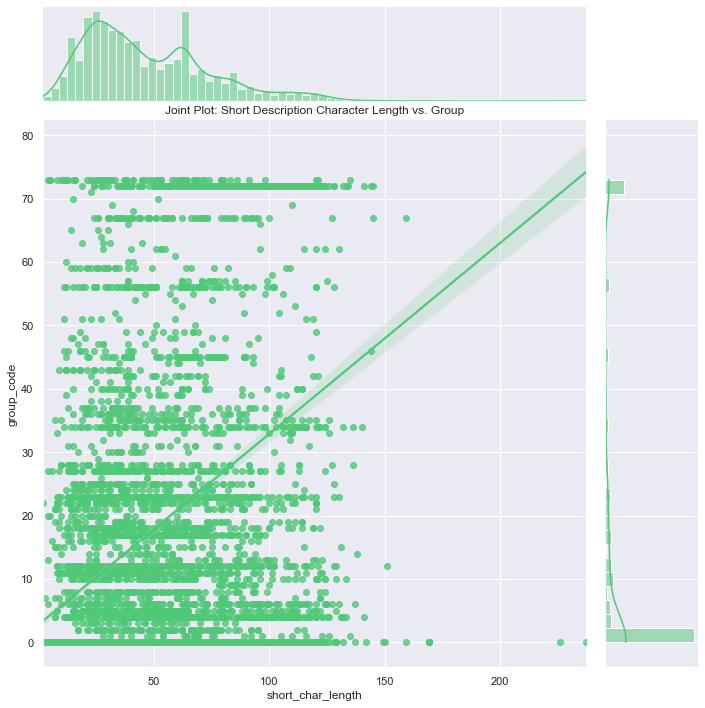

In [73]:
sns.set()
sns.jointplot(dataset.short_char_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Short Description Character Length vs. Group')
plt.show()

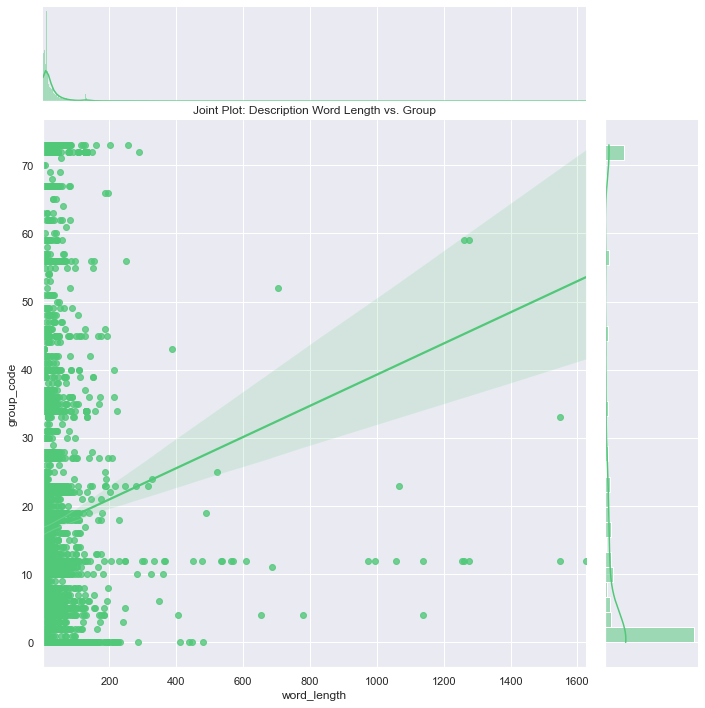

In [74]:
sns.set()
sns.jointplot(dataset.word_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Word Length vs. Group')
plt.show()

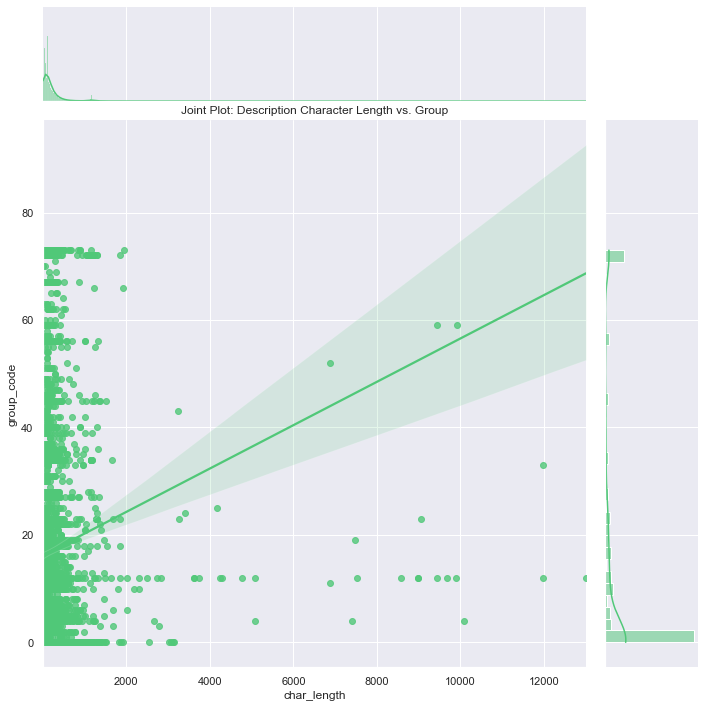

In [75]:
sns.set()
sns.jointplot(dataset.char_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Character Length vs. Group')
plt.show()

In [76]:
# binning the lengths

import jenkspy

NUM_BINS = 100
# calculates the natural breaks in a series, exploiting the Fisher-Jenks algorithm
# https://en.wikipedia.org/wiki/Jenks_natural_breaks_optimization
breaks = jenkspy.jenks_breaks(dataset['char_length'], nb_class=NUM_BINS)
labels = list(range(len(breaks) - 1))
pprint(breaks, compact=True)

[3.0, 17.0, 23.0, 28.0, 34.0, 40.0, 47.0, 55.0, 63.0, 71.0, 80.0, 90.0, 101.0,
 109.0, 117.0, 126.0, 137.0, 149.0, 160.0, 170.0, 180.0, 190.0, 201.0, 213.0,
 224.0, 235.0, 247.0, 259.0, 271.0, 283.0, 295.0, 308.0, 323.0, 338.0, 354.0,
 372.0, 392.0, 412.0, 431.0, 449.0, 468.0, 486.0, 508.0, 537.0, 568.0, 596.0,
 620.0, 653.0, 684.0, 720.0, 765.0, 801.0, 837.0, 866.0, 908.0, 934.0, 990.0,
 1026.0, 1063.0, 1116.0, 1157.0, 1176.0, 1197.0, 1234.0, 1265.0, 1301.0, 1347.0,
 1398.0, 1478.0, 1526.0, 1692.0, 1877.0, 1952.0, 2013.0, 2172.0, 2293.0, 2548.0,
 2744.0, 2833.0, 3062.0, 3141.0, 3249.0, 3403.0, 3628.0, 3734.0, 4169.0, 4286.0,
 4766.0, 5087.0, 6887.0, 7403.0, 7524.0, 8575.0, 8991.0, 9063.0, 9440.0, 9678.0,
 9912.0, 10077.0, 11968.0, 13001.0]


In [77]:
dataset['char_length_bins'] = pd.cut(dataset['char_length'] ,bins=breaks, labels=labels, include_lowest=True)

In [78]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,206,33,11,2,verified user details.,login issue,0,22
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,141,19,33,7,good afternoon,emails not coming,22,16
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,software issue,software issue,0,2
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,windows password reset for tifpdchb,windows password reset for tifpdchb,0,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,103,17,30,4,finish the drawers adjustment settings.,machine não está funcionando,59,12


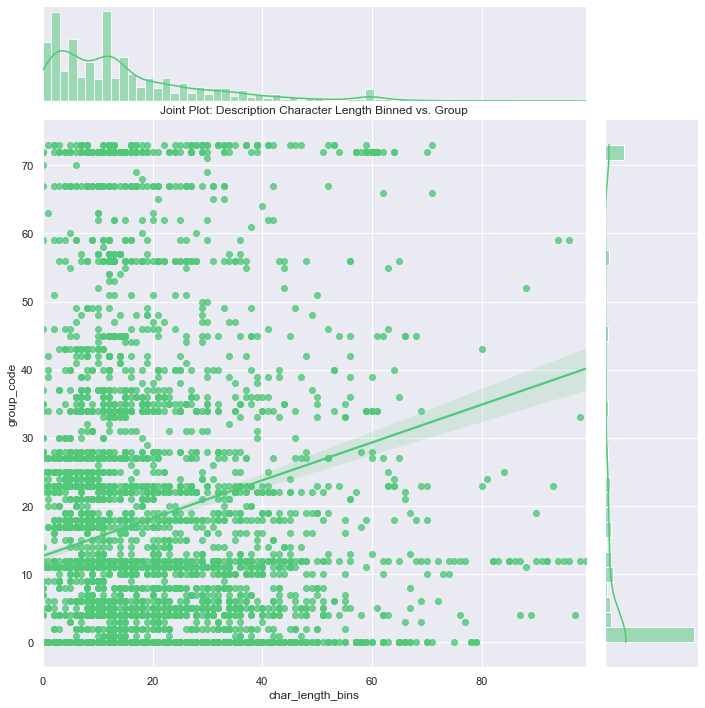

In [79]:
sns.set()
sns.jointplot(dataset.char_length_bins.astype(int), dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Character Length Binned vs. Group')
plt.show()

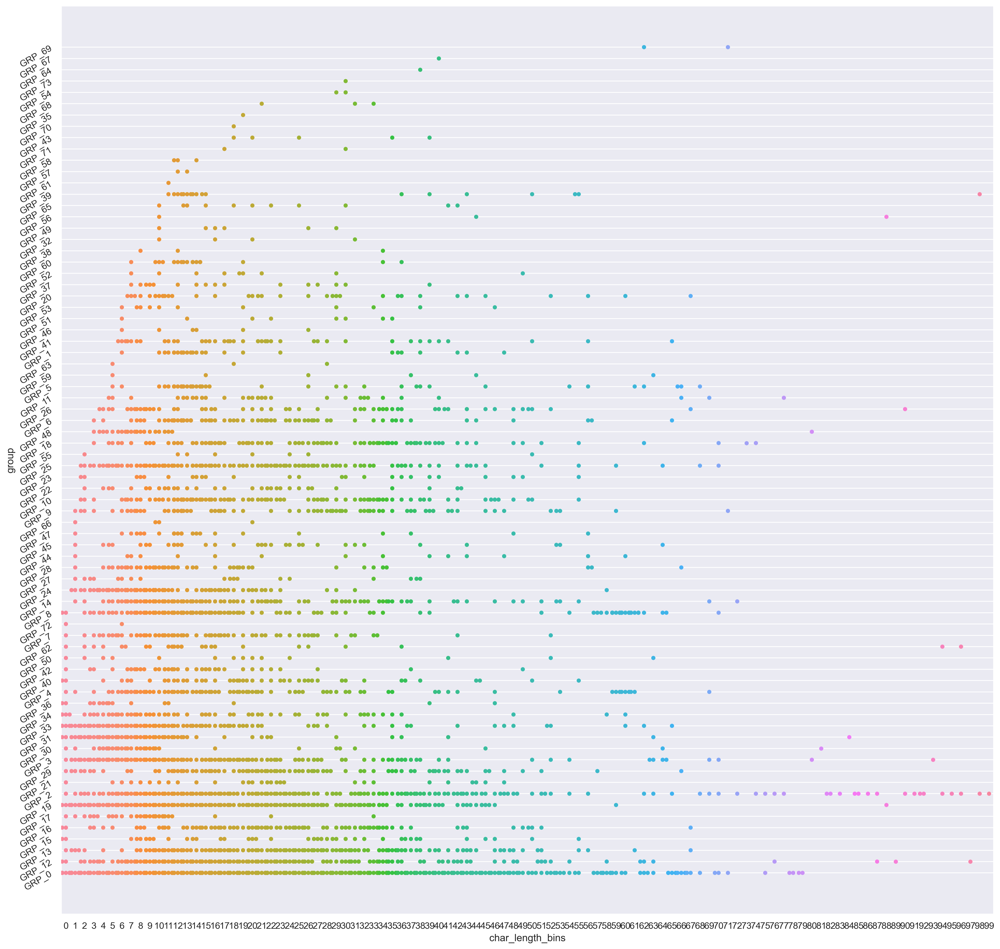

In [80]:
sns.set()
plt.figure(figsize=(20,20), dpi=300)
sns.swarmplot(x="char_length_bins", y="group", data=dataset)
plt.yticks(rotation=30)
plt.show()

In [81]:
# TODO: perform Chi2 Test with group to decide whether to include length features
import scipy.stats as stats
data_crosstab = pd.crosstab(dataset['caller'],
                            dataset['group'],
                            margins=True,
                            margins_name="Total")
data_crosstab

group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9,Total
caller,,,,,,,,,,,,,,,,,,,,,
DEsowkrH sciejzNE,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
HdOuWxAt qfKdlJMx,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
ZkBogxib QsEJzdZO,0,1,2,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,54,31,151
abiuclvj brziktno,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
abtknpew ifcekjdb,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zylwdbig wdkbztjp,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zymdwqsi jzvbthil,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zywoxerf paqxtrfk,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


In [82]:
# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = dataset['caller'].unique()
columns = dataset ['group'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 268747.2241233948  and p value is: 0.0
Null Hypothesis is rejected.


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Detection</span></strong></li>
</ul></h3>

https://fasttext.cc/docs/en/language-identification.html

In [83]:
# TODO: try out fastText pre-trained language identification model (less latency) &
# Google CLD3 (Google Compact Language Detector v3)

# ! pip -q install fasttext
# import fasttext

# path_to_pretrained_model = './artifact/models/lid.176.bin'  # lid (Language identification modeel which can recognize 176 languages)
# fmodel = fasttext.load_model(path_to_pretrained_model)
# text = "+86 Hi there"
# fmodel.predict([text])

In [84]:
from langdetect import DetectorFactory, detect_langs
from langdetect.lang_detect_exception import LangDetectException

DetectorFactory.seed = seed

# detect the languages in the dataset
languages = []
errs = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 74%|█████████████████████████████████████████████████████████▍                    | 6258/8499 [01:37<00:35, 63.05it/s]

text:  +86  
No features in text.


100%|██████████████████████████████████████████████████████████████████████████████| 8499/8499 [02:11<00:00, 64.79it/s]


In [85]:
print("Unique languages in the descriptions: "
      f"{np.unique(languages)}")

Unique languages in the descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ja' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq'
 'sv' 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [86]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                      columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,no,es,it,af,sv,ca,nl,de,fr,...,lt,ja,sk,tr,sw,vi,so,lv,cs,hu
Frequency,7058,67,65,144,262,37,40,48,424,111,...,4,1,1,1,1,3,1,2,1,1


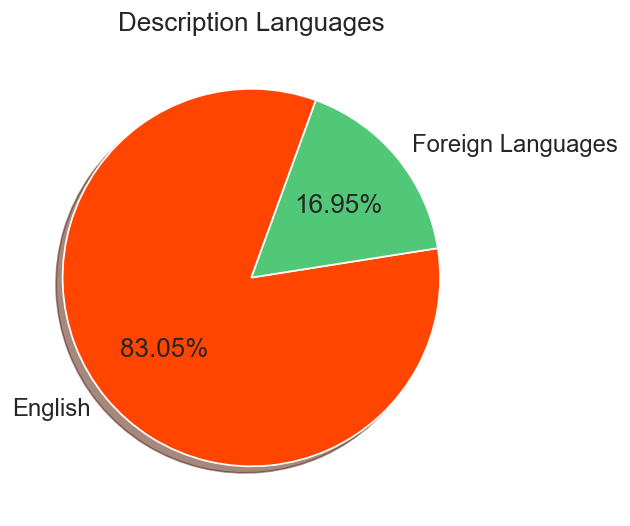

In [87]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Description Languages')
plt.show()

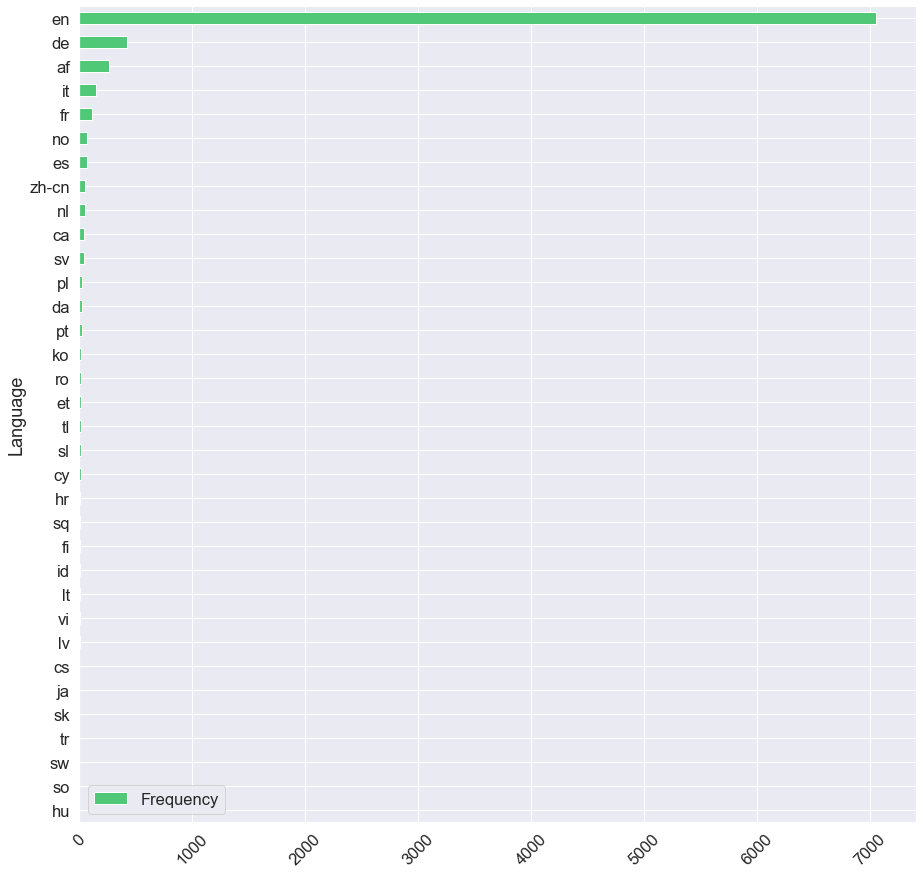

In [88]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [89]:
# for i in lang_samples:
#     print(i)
#     try:
#         print(random.sample(lang_samples[i], 3))
#     except Exception:
#         print(random.sample(lang_samples[i], 1))
#     print('')

In [90]:
# detect the languages in the dataset
languages = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.short_description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 22%|████████████████▊                                                             | 1838/8499 [00:34<01:53, 58.78it/s]

text:  bgflmyar.xgufkidq@gmail.com
No features in text.


 35%|███████████████████████████▎                                                  | 2976/8499 [00:55<02:08, 42.83it/s]

text:  ???????????????????
No features in text.


100%|██████████████████████████████████████████████████████████████████████████████| 8499/8499 [02:39<00:00, 53.45it/s]


In [91]:
print("Unique languages in the short descriptions: "
      f"{np.unique(languages)}")

Unique languages in the short descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq' 'sv'
 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [92]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                       columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,et,no,es,it,nl,af,sv,ro,fr,...,vi,hr,pt,ko,lt,so,sw,lv,tr,hu
Frequency,6121,25,157,95,287,140,489,60,45,245,...,9,6,33,15,9,5,1,4,1,1


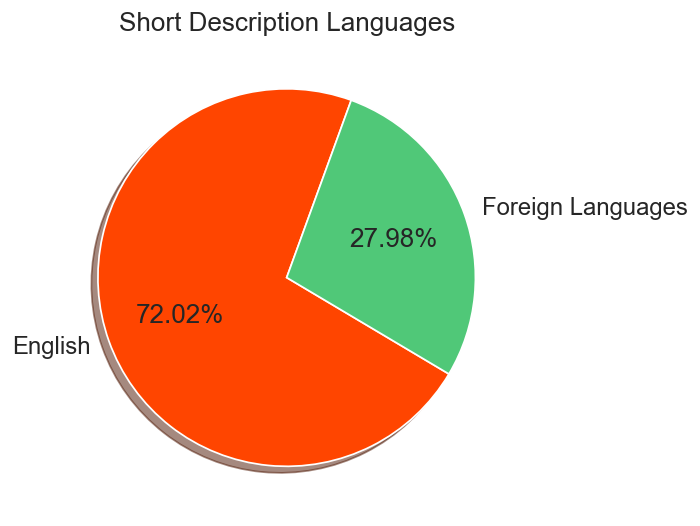

In [93]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Short Description Languages')
plt.show()

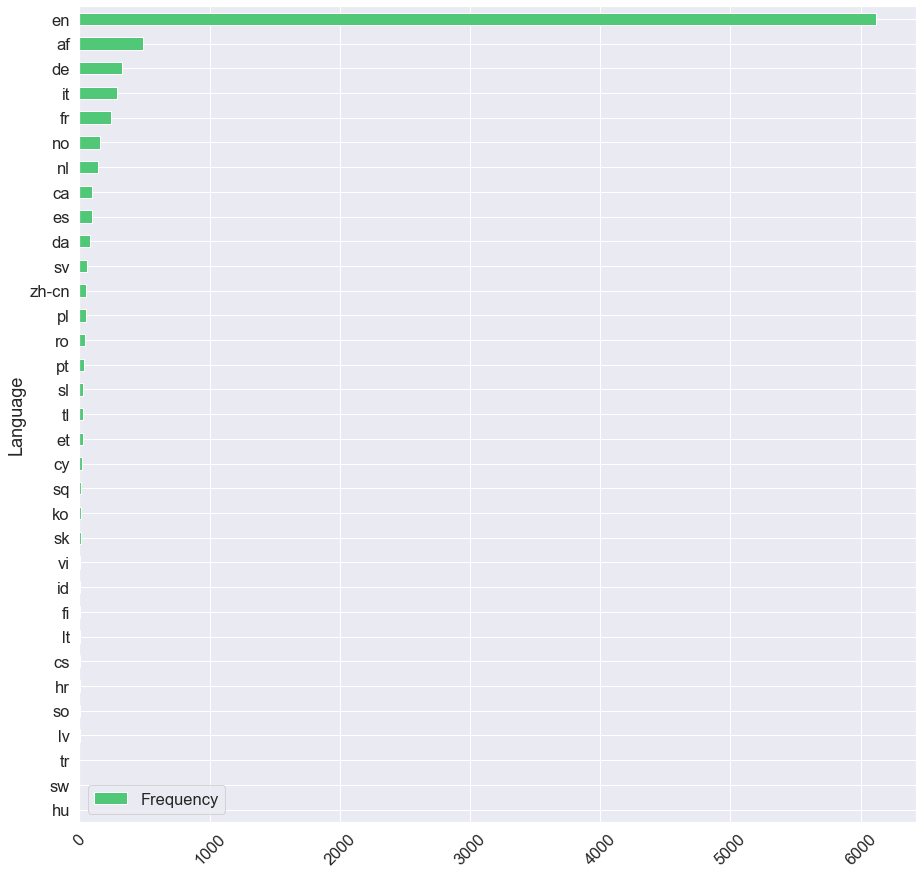

In [94]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [95]:
# for i in lang_samples:
#     print(i)
#     try:
#         print(random.sample(lang_samples[i], 3))
#     except Exception:
#         print(random.sample(lang_samples[i], 1))
#     print('')

In [96]:
errs  # few errors where lang_detect failed, need to impute these irrelevant values

['+86  ', 'bgflmyar.xgufkidq@gmail.com', '???????????????????']

In [97]:
dataset[dataset.description == errs[0]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19,,inbox always show,0,0


In [98]:
dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description

In [99]:
dataset[dataset.short_description == errs[1]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
1836,bgflmyar.xgufkidq@gmail.com,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,27,1,tool on his phone,,0,10


In [100]:
dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description

In [101]:
dataset[dataset.short_description == errs[2]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
2975,???????????????????,\n\nreceived from: yzbjhmpw.vzrulkog@gmail.com...,yzbjhmpw vzrulkog,GRP_0,1207,131,19,1,company shared services gmbh geschäftsführer,,0,62


In [102]:
dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

In [103]:
def clean_incosistencies():
    dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description
    dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description
    dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

# clean_incosistencies()

<h2><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pre-Processing</span></strong></li>
</ul></h2>

In [104]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,206,33,11,2,verified user details.,login issue,0,22
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,141,19,33,7,good afternoon,emails not coming,22,16
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,software issue,software issue,0,2
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,windows password reset for tifpdchb,windows password reset for tifpdchb,0,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,103,17,30,4,finish the drawers adjustment settings.,machine não está funcionando,59,12


### Pipeline
* fix text encoding usng ftfy.fix_text
* handle other languages (drop or translate) (TODO)
* parse email messages to retain only subject and body
* clean up emails, links, website links, telephone numbers
* clean up anchor words like: 'Received from:', 'name:', 'hello', 'hello team' , 'cid' ...
* clean up security logs (TODO)
* clean up outage questionnaires (TODO)
* clean html tags if they exist
* clean /r /n characters
* strip caller names in descriptions
* translate accented characters (á -> a)
* convert unicode characters to ascii
* expand contractions (they're -> they are)
* clean stopwords & any custom stopwords
* clean up extra whitespaces & tokenize
* remove gibberish (after language translation)
* strip extra punctuation
* lemmatization/stemming (if needed for a model)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Language Translation</span></strong></li>
</ul></h3>

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Outage Questionnaires</span></strong></li>
</ul></h3>

In [105]:
outage_df = dataset.reset_index().loc[pd.Series(['outage' in i for i in  dataset.description.tolist()])]

In [106]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [107]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1197,132,82,17,type of outage,ave sites hard,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1156,129,74,14,type of outage,power outage,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1163,130,86,16,type of outage,network outage,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1152,128,80,11,type of outage,network outage,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,type of outage,power outage,72,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1172,130,123,16,type of outage,network outage,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1158,130,86,15,type of outage,south africa mpls circuit,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1148,129,88,14,type of outage,network outage,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1152,130,65,13,type of outage,usa site is hard,72,59


In [108]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [109]:
print(outage_df.description.tolist()[0])

what type of outage:  _____network     _____circuit     ___x__power (please specify what type of outage)

1. top 23 cert site   ?    ___yes______     (yes/no/na) 

2. when did it start  ?   ________4:31 pm et on 10/30. _____________

3.  scheduled maintenance ( power) ? __yno_____    (yes/no/na)     company power  _________     provider power _________
                
4.  scheduled maintenance ( network) ? ___no____    (yes/no/na)     company maint________ (yes/no)       provider maint/ticket #__________________    

5. does site have a backup circuit ?  __yes____    (yes/no/na) 

6. backup circuit active ?   ___na_____     (yes/no/na) 

7. site contact notified (phone/email) ?  _________     (yes/no/na) 

8. remote dial-in ?   ____na_______   (yes/no/na) 

9. equipment reset ?    ____na_______    (yes/no/na) 

10. verified site working on backup circuit ?  ___na____     (yes/no/na) 

11. vendor ticket  # ( global_telecom_1, verizon, telecom_vendor_1, telecom_vendor_2 )    ____global_

In [110]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1197,132,82,17,type of outage,ave sites hard,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1156,129,74,14,type of outage,power outage,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1163,130,86,16,type of outage,network outage,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1152,128,80,11,type of outage,network outage,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,type of outage,power outage,72,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1172,130,123,16,type of outage,network outage,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1158,130,86,15,type of outage,south africa mpls circuit,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1148,129,88,14,type of outage,network outage,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1152,130,65,13,type of outage,usa site is hard,72,59


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Security/Event Logs</span></strong></li>
</ul></h3>

In [111]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])]  # all security incident logs

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
341,341,security incidents - ( #in33071122 ) :[ipbl]: ...,source ip :\nsystem name :lmsl9516338\nuser n...,gzhapcld fdigznbk,GRP_3,166,30,87,13,updates field sales user,security incidents,23,18
2977,2978,security incidents - ( #in33987594) : 29866 vi...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_3,3249,316,115,17,"den dolder,nld devip",bare http get executable,23,80
3096,3097,security incidents - ( #in33976733) : suspicio...,source ip: 10.16.90.249\nsource hostname: andr...,gzhapcld fdigznbk,GRP_56,6887,703,104,11,deny udp src inside,security incidents,52,88
3097,3098,security incidents - ( #in33984033) : internal...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_19,6868,687,96,13,deny udp src inside,internal outbreak for port,11,88
3529,3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17,found field sales user,traffic from sinkhole domain,12,90
3531,3532,security incidents - ( #in33944327) :possible ...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_2,3628,451,109,15,probable infected asset occurrence count,traffic from sinkhole domain,12,82
3704,3705,security incidents - ( #in33932723 ) : possibl...,source ip: 10.44.63.52\nsource hostname: leeng...,gzhapcld fdigznbk,GRP_48,3235,387,105,14,daserf backdoor phoning home,security incidents,43,80
3705,3706,security incidents - ( #in33924718 ) : possibl...,source ip :195.22.28.222\ndestination ip: 12.9...,gzhapcld fdigznbk,GRP_2,4286,536,116,17,probable infected asset occurrence count,traffic from sinkhole domain,12,85
3960,3961,security incidents - ( #in33805815) : possible...,=========================\nevent data\n=======...,gzhapcld fdigznbk,GRP_2,3734,476,110,16,probable infected asset occurrence count,traffic from sinkhole domain,12,83
3964,3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17,servers for each domain,traffic from sinkhole domain,12,92


In [112]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].group.value_counts()  # groups

GRP_2     26
GRP_12     4
GRP_39     4
GRP_3      4
GRP_62     2
GRP_56     1
GRP_19     1
GRP_48     1
GRP_47     1
GRP_0      1
GRP_30     1
GRP_69     1
GRP_31     1
Name: group, dtype: int64

In [113]:
dataset.reset_index().loc[pd.Series(['cyber' in i for i in  dataset.short_description.tolist()])]

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
491,491,october cyber security month - ransomware,october cyber security month - ransomware,pyrtfdxu nxfkqmoy,GRP_0,42,6,42,6,october cyber security month,october cyber security month,0,5
1729,1729,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,60,9,60,9,phish uacyltoe hxgaycze report october,phish uacyltoe hxgaycze report october,12,7
5411,5412,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,62,9,62,9,phish uacyltoe hxgaycze report september,phish uacyltoe hxgaycze report september,12,7


### TODO: dig deeper into security logs and cyber security issues handled by 2, 39, 12, ...

In [114]:
import re
from collections import Counter

def remove_duplicates(text: str) -> str:
    '''Remove duplicates'''
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
    UniqW = Counter(text)
    text = " ".join(UniqW.keys())
    return str(text)

# remove_duplicates(text)

In [115]:
log = dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].iloc[1].description
print(log)

source ip :
system name :
user  name:
location :
sep , sms status :
field sales user ( yes / no) :  
dsw event log:
-------------------------------------------------------------------------------------------------------------------
event detail(s):

event_id 417013204:
[**] [1:21130977:10] 29866 vid22518 bare http get executable from ip address (possible downloader trojan) [**]
[classification: none] [priority: 2] [action: accept_passive] [impact_flag: 0] [impact: 0] [blocked: 2] [vlan: 0] [mpls label: 0] [pad2: 1]
[sensor id: 602982][event id: 281895][time: 2585087487.272206]
[xref => vid, 22518]
[src ip: 10.1.43.79][dst ip: 94.102.53.238][sport/itype: 61007][dport/icode: 80][proto: 6]
09/27/2016-11:39:36.272206 10.1.43.79:61007 -> 94.102.53.238:80
tcp ttl:127 tos:0x0 id:16297 iplen:20 dgmlen:119 df
***ap*** seq: 0xfbc9dc8c ack: 0xe57c9433 win: 0x102 tcplen: 20
==pcap s==
=0c=00=00=00xz=eawn'=04=00w=00=00=00w=00=00=00e=00=00w?=a9@=00=7f=06=f23=0a=01+o^f5=ee=eeo=00p=fb=c9=dc=8c=e5|=943

In [116]:
def clean_sec_logs(text: str) -> str:
    '''Clean up security logs'''
    if text.startswith('source ip'):
        words = set(['source','ip','hostname', 'mac', 'events', 'yes / no'])
        word_cleanup = r'\b(?:{})\b'.format('|'.join(words))
        text = text.replace('\n', ' ').replace('\r', '')
        text = re.sub(r'((:)?\s?\d+(.|:)?)+', '', text)
        text = re.sub('(_x000D_|_x_|_x|x_)', '', text)
        text = re.sub(r'(\[|\]|(\-)+|(\=)+|\%|\,|\"|\:|\(|\))?','', text)
        text = re.sub(word_cleanup,'', text)
        text = remove_duplicates(text)
    return str(text)

clean_sec_logs(log)

" system name user location sep sms status field sales dsw event log details event_id ** vidbare http get executable from address possible downloader trojan classification none priority action accept_passive impact_flag impact blocked vlan mpls label pad sensor idevent idtime xref > vid src ipdst ipsport/itypedport/icodeproto>tcp ttltosidiplendgmlendf ***ap*** seqfbcc ackewintcplenpcap s zeawn'?afo^feeeeofbcdcedet /~yahoo/csrsv.exe http/hostconnection keepalive pcap e ex http_uri http_hostname osecurity correlation_data sepdhcpd dhcpack onto cfelhql via ethrelayleasedurationrenew lowercaseurlcorrelation srcip urlcorrelation vendorreference vidforeseeconndirection outgoing refererproxycorrelationurl null foreseeexternalip eventtypeid unique_event_hash ontologyid foreseeinternalip urlpath srchostname lhqlinspectorruleid inspectoreventid httpmethod netacuity_destination_organization ecatel ltd vendoreventid device_id foreseemaliciousprobability event_summary tcpflags agentid lhqlcvss fore

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Parse Emails</span></strong></li>
</ul></h3>

In [117]:
# !pip -q installmail-parser
import re
import email
import spacy
import mailparser
from utils.utils import clean_text, is_blank, is_not_blank
from utils.email_handler import email_regex
from charset_normalizer import from_bytes
from utils.email_handler import EmailHandler

nlp = spacy.load('en_core_web_sm', disable=['parser'])

* detect emails in description

In [118]:
email_hdlr = EmailHandler()
emails_df = defaultdict(list)

for idx, row in tqdm(dataset.iterrows()):
    doc = nlp(row.description)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    # if email is present add to accum
    if email_indices:
        row = dict(row)
        for i in row:
            emails_df[i].append(row[i])

emails_df = pd.DataFrame(dict(emails_df))

8499it [01:47, 78.97it/s] 


In [119]:
emails_df  # 2616 rows with an email id in description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
1,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
2,unable to login to company vpn,"\n\nreceived from: xyz@company.com\n\nhi,\n\ni...",chobktqj qdamxfuc,GRP_0,244,44,30,6,login to company vpn website,unable to login to company,0,25
3,vpn issue,\n\nreceived from: ugephfta.hrbqkvij@gmail.com...,ugephfta hrbqkvij,GRP_0,473,68,9,2,connect vpn from home office,vpn issue,0,40
4,vpn not working,\n\nreceived from: dceoufyz.saufqkmd@gmail.com...,dceoufyz saufqkmd,GRP_0,206,33,15,3,company network through the vpn,vpn not working,0,22
...,...,...,...,...,...,...,...,...,...,...,...,...
2611,customer group enhanced field,\n\nreceived from: nlearzwi.ukdzstwi@gmail.com...,nlearzwi ukdzstwi,GRP_9,598,81,29,4,business decision has recently,customer group enhanced field,73,45
2612,ess portal,\n\nreceived from: eagvusbr.nguqityl@gmail.com...,eagvusbr nguqityl,GRP_9,331,51,10,2,ess file and checking,ess portal,73,32
2613,erp account unlock,name:mfeyouli ndobtzpw\nlanguage:\nbrowser:mic...,rbozivdq gmlhrtvp,GRP_0,197,19,18,3,microsoft internet explorer email,erp account unlock,0,21
2614,vpn for laptop,\n\nreceived from: jxgobwrm.qkugdipo@gmail.com...,jxgobwrm qkugdipo,GRP_34,216,20,14,3,vpn for my new laptop,vpn for laptop,28,23


In [120]:
def parse_body(msg: str, encoding='utf-8'):
    b = email.message_from_string(msg)
    body = ""

    if b.is_multipart():
        for part in b.walk():
            ctype = part.get_content_type()
            cdispo = str(part.get('Content-Disposition'))

            # skip any text/plain (txt) attachments
            if ctype == 'text/plain' and 'attachment' not in cdispo:
                body = part.get_payload(decode=True)  # decode
                break

    # not multipart - i.e. plain text & no attachments
    else:
        # print('Plain Text')
        body = b.get_payload(decode=True)

    subject_matches =  re.findall('subject:.*\n', test)
    if subject_matches:
        subject = subject_matches[0]
    else:
        subject = b.get_all('subject')

    if not isinstance(subject, str):
        subject = ''
    
    # print("Subject: ", subject)
    # print("Body: ", body)

    body = str(from_bytes(body).best())
    # body = str(body, encoding)

    parsed_msg = str(subject + body)
    if is_blank(parsed_msg):
        # return original message if no payload is found after parsing
        return msg
    return parsed_msg

In [121]:
msgs = list(set(emails_df.description.tolist()))
msgs = [i for i in msgs if 'to:' in i]
len(msgs)

303

In [122]:
test = msgs[20]

print(test)
print('\nParsed:')
print(parse_body(test))



received from: oetlgbfw.bsctrnwp@gmail.com

i am not able to login my account
i must have the wrong password

matghyuthdw is my username

dan,
welcome to s&op .. i've created your user account; please use following logn credentials:




dthyan matheywtyuews
sales manager gl2
oetlgbfw.bsctrnwp@gmail.com<mailto:oetlgbfw.bsctrnwp@gmail.com>
t


Parsed:

received from: oetlgbfw.bsctrnwp@gmail.com

i am not able to login my account
i must have the wrong password

matghyuthdw is my username

dan,
welcome to s&op .. i've created your user account; please use following logn credentials:




dthyan matheywtyuews
sales manager gl2
oetlgbfw.bsctrnwp@gmail.com<mailto:oetlgbfw.bsctrnwp@gmail.com>
t



In [123]:
def strip_headers(text: str) -> str:
    '''strip headers in email messages like: "received from: xyz@gmail.com"'''
    patterns = list()
    patterns.append(r'received from:?\s?' + email_regex)
    patterns.append(r'from:?\s?' + email_regex)
    patterns.append(r'email:?\s?' + email_regex)
    patterns.append(r'to:?\s?' + email_regex)
    patterns.append(r'to:\s')
    patterns.append(r'sent:\s.*[ap]m')
    patterns.append(r'customer number:')
    patterns.append(r'summary:')
    patterns.append(r'subject:')
    patterns.append(r'telephone:')
    patterns.append(r'regional controller')
    patterns.append(r'<mail>')
    patterns.append(r'help desk,')
    patterns.append(r'it team,')
    patterns.append(r'global it team,')
    patterns.append(r'\nbest\n')
    patterns.append(r'\nregards\n')
    patterns.append(r'\[cid:?.*\]')  # attachments link
    
    # patterns.append(r'subject:?.*\b')
    patterns = [re.compile(p) for p in patterns]
    for pattern in patterns:
        text = re.sub(pattern, '', text.strip()).strip()
    return str(text.strip())

print(strip_headers(test))

i am not able to login my account
i must have the wrong password

matghyuthdw is my username

dan,
welcome to s&op .. i've created your user account; please use following logn credentials:




dthyan matheywtyuews
sales manager gl2
oetlgbfw.bsctrnwp@gmail.com
t


In [124]:
def parse_email(msg: str) -> str:
    '''parses and cleans email messages'''
    doc = nlp(msg)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    if email_indices:
        msg = parse_body(msg)
        msg = strip_headers(msg)
    return msg

def parse_email_row(row):
    descr = row.description
    short_descr = row.short_description
    # text_normalized = str(from_bytes(text.encode('utf-8')).best())
    row['cleaned_short_description'] = parse_email(short_descr)
    row['cleaned_description'] = parse_email(descr)
    return row

print(parse_email(test))

i am not able to login my account
i must have the wrong password

matghyuthdw is my username

dan,
welcome to s&op .. i've created your user account; please use following logn credentials:




dthyan matheywtyuews
sales manager gl2
oetlgbfw.bsctrnwp@gmail.com
t


In [125]:
emails_df = emails_df.progress_apply(parse_email_row, axis=1)
emails_df.to_csv('./data/cleaned_emails_test.csv', index=None)

100%|██████████████████████████████████████████████████████████████████████████████| 2616/2616 [01:31<00:00, 28.65it/s]


In [126]:
emails_df

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_short_description,cleaned_description
0,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21,outlook,"hello team,\n\nmy meetings/skype meetings etc ..."
1,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10,cant log in to vpn,hi\n\ni cannot log on to vpn\n\nbest
2,unable to login to company vpn,"\n\nreceived from: xyz@company.com\n\nhi,\n\ni...",chobktqj qdamxfuc,GRP_0,244,44,30,6,login to company vpn website,unable to login to company,0,25,unable to login to company vpn,"hi,\n\ni am unable to login to company vpn web..."
3,vpn issue,\n\nreceived from: ugephfta.hrbqkvij@gmail.com...,ugephfta hrbqkvij,GRP_0,473,68,9,2,connect vpn from home office,vpn issue,0,40,vpn issue,hello helpdesk\n\ni am not able to connect vpn...
4,vpn not working,\n\nreceived from: dceoufyz.saufqkmd@gmail.com...,dceoufyz saufqkmd,GRP_0,206,33,15,3,company network through the vpn,vpn not working,0,22,vpn not working,"hello,\n\ni'm not being able to connect to com..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2611,customer group enhanced field,\n\nreceived from: nlearzwi.ukdzstwi@gmail.com...,nlearzwi ukdzstwi,GRP_9,598,81,29,4,business decision has recently,customer group enhanced field,73,45,customer group enhanced field,"hello,\n\na business decision has recently bee..."
2612,ess portal,\n\nreceived from: eagvusbr.nguqityl@gmail.com...,eagvusbr nguqityl,GRP_9,331,51,10,2,ess file and checking,ess portal,73,32,ess portal,"hi team,\n\ni was going into the ess file and ..."
2613,erp account unlock,name:mfeyouli ndobtzpw\nlanguage:\nbrowser:mic...,rbozivdq gmlhrtvp,GRP_0,197,19,18,3,microsoft internet explorer email,erp account unlock,0,21,erp account unlock,unlock erp account for gadbpfrz unvdyask user ...
2614,vpn for laptop,\n\nreceived from: jxgobwrm.qkugdipo@gmail.com...,jxgobwrm qkugdipo,GRP_34,216,20,14,3,vpn for my new laptop,vpn for laptop,28,23,vpn for laptop,i need a vpn for my new laptop. name llv851741...


In [127]:
for msg in random.sample(msgs, 10):
    print(msg)
    print("Cleaned:")
    print(parse_email(msg))
    print('~'*200)



received from: afwzehqs.jfbxegac@gmail.com

hello team

we are unable to send any quotations to customer or sales through zz_mails.

please check and resolve immediately.

example: 3116105044 was sent to afwzehqs.jfbxegac@gmail.com<mailto:afwzehqs.jfbxegac@gmail.com> but not received.

warm 
Cleaned:
hello team

we are unable to send any quotations to customer or sales through zz_mails.

please check and resolve immediately.

example: 3116105044 was sent  but not received.

warm
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
from: tsbnfixp numwqahj 
sent: wednesday, september 28, 2016 9:01 pm
to: nwfodmhc exurcwkm
subject: amar wg: die synchronisierung mit exchange activesync ist auf ihrem gerät vorübergehend blockiert, bis der zugriff vom administrator gewährt wird.
importance: high

please usa access for that company owned device.

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean up caller ids in description</span></strong></li>
</ul></h3>

In [128]:
uniq_callers = set(dataset.caller.tolist())
len(uniq_callers)

2950

In [129]:
from pandas.core.common import flatten
callers_tokens = set(flatten([i.split() for i in uniq_callers]))
len(callers_tokens)

5900

In [130]:
def clean_callers(text: str, callers_tokens=callers_tokens) -> str:
    '''strips out caller ids from the descriptions'''
    return ' '.join([w for w in text.split()  if w.lower() not in callers_tokens])

test = '''yfqoaepn xnezhsit
managing director
finance manager cee
'''

clean_callers(test)

'managing director finance manager cee'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Irrelevant Information</span></strong></li>
</ul></h3>

* Clean up Emails, Links, Dates, Telephone Numbers

In [131]:
# !pip -q installspacy
# !python -m spacy downlaod en_core_web_sm
# !pip -q installcontractions
import nltk
import spacy

nltk.download('punkt')
nltk.download('stopwords')
# Initialize spacy 'en_core_web_sm' model
nlp = spacy.load('en_core_web_sm', disable=['parser'])

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [132]:
from utils.link_handler import LinkHandler
from utils.email_handler import EmailHandler
from utils.date_handler import DateHandler
from utils.tel_handler import TelHandler

In [133]:
test = "Date: 12/2/2024" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "DATE"
date_hdlr = DateHandler()
date_indices = date_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = ['DATE' if idx in date_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches DATE: ['12/2/2024']

Date : 12/2/2024
['Date', ':', '12/2/2024']
['O', 'O', 'DATE']
[('Date', 'O'), (':', 'O'), ('12/2/2024', 'DATE')]


In [134]:
test = "mailto: john.doe@gmail.com from: jane.doe@outlook.com"
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "MAIL"
email_hdlr = EmailHandler()
email_indices = email_hdlr.match_ref(text, toks, tags,
                                     entity=tag,
                                     verbose=True)
tags = [tag if idx in email_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches MAIL: ['john.doe@gmail.com', 'jane.doe@outlook.com']

mailto : john.doe@gmail.com from : jane.doe@outlook.com
['mailto', ':', 'john.doe@gmail.com', 'from', ':', 'jane.doe@outlook.com']
['O', 'O', 'MAIL', 'O', 'O', 'MAIL']
[('mailto', 'O'), (':', 'O'), ('john.doe@gmail.com', 'MAIL'), ('from', 'O'),
 (':', 'O'), ('jane.doe@outlook.com', 'MAIL')]


In [135]:
test = "www.google.com/?search Search Results: ..." 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "LINK"
link_hdlr = LinkHandler()
link_indices = link_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = [tag if idx in link_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches LINK: ['www.google.com/?search']

www.google.com/?search Search Results : ...
['www.google.com/?search', 'Search', 'Results', ':', '...']
['LINK', 'O', 'O', 'O', 'O']
[('www.google.com/?search', 'LINK'), ('Search', 'O'), ('Results', 'O'),
 (':', 'O'), ('...', 'O')]


In [136]:
test = "Tel +1 724 539 5257" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "TEL"
tel_hdlr = TelHandler()
tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                 entity=tag,
                                 verbose=True)
tags = [tag if idx in tel_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches TEL: ['Tel', '+1', '724', '539', '5257']

Tel +1 724 539 5257
['Tel', '+1', '724', '539', '5257']
['TEL', 'TEL', 'TEL', 'TEL', 'TEL']
[('Tel', 'TEL'), ('+1', 'TEL'), ('724', 'TEL'), ('539', 'TEL'), ('5257', 'TEL')]


In [137]:
def clean_irrelevant_info(text: str) -> str:
    '''strips out emails, dates, website links and telephone numbers in the text'''
    doc = nlp(text)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                     entity='TEL',
                                     verbose=False)
    tags = ['TEL' if idx in tel_indices else 'O'
            for idx in range(len(toks))]
    link_indices = link_hdlr.match_ref(text, toks, tags,
                                       entity='LINK',
                                       verbose=False)
    tags = ['LINK' if idx in link_indices else tag
            for idx, tag in enumerate(tags)]
    date_indices = date_hdlr.match_ref(text, toks, tags,
                                       entity='DATE',
                                       verbose=False)
    tags = ['DATE' if idx in date_indices else tag
            for idx, tag in enumerate(tags)]
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity='MAIL',
                                         verbose=False)
    tags = ['MAIL' if idx in email_indices else tag
            for idx, tag in enumerate(tags)]
    # print(toks)
    # print(tags)
    # print([tok for tok, tag in zip(toks, tags) if tag == "O"])

    text = str(" ".join([tok for tok, tag in zip(toks, tags) if tag == "O"]))
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    return text

In [138]:
%%time

test = "Tel +1 724 539 5257 www.google.com/?search Search Results: ... Date: 12/2/2024 mailto: john.doe@gmail.com from: jane.doe@outlook.com"
clean_irrelevant_info(test)

Wall time: 9 ms


'Search Results : ... Date : mailto : from :'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Anchors</span></strong></li>
</ul></h3>

In [139]:
import re

anchors = ['received from:', 'received from :', 'received from:',
           'from:', 'to:', 'from :', 'to :',
           'date:', 'date :', 'cid', 'gentles,',
           '^hi', '^hello', '^hello,', '^hello ,', '^dear team',
           'good morning', 'good morning,' '^hi there', '^hi there,',
           'received from:?', 'hello helpdesk', 'best$',
           'hello', 'hi', 'employee', 'manager', 'etc', 'meetings', 'welcome',
           'please', 'pls', 'sir','mam', 'regards', 'jpg', 'image', 'fyi',
           'good', 'afternoon', 'morning', 'greetings',
          ]

# to strip out larger anchors first
anchors = sorted(list(set(anchors)), key=len, reverse=True)
anchors = [re.compile(a) for a in anchors]

def clean_anchors(text: str, anchors=anchors) -> str:
    '''strips out anchor words'''
    for anchor in anchors:
        text = re.sub(anchor, '', text.strip()).strip()
    return str(text.strip())

In [140]:
%%time
test = '''
hi there,

would you please help me unlock my supply_chain_software account and reset my supply_chain_software password? '''
clean_anchors(test)

Wall time: 0 ns


'would you  help me unlock my supply_chain_software account and reset my supply_chain_software password?'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Gibberish Removal</span></strong></li>
</ul></h3>

In [141]:
import re
import nltk
from nltk.corpus import words
nltk.download('words')
vocab = set(nltk.corpus.words.words())

gib = set(['æ','¹','å','†ç','ï¼Œ','Ž','¥','Š','å','©','ç™','å½','ä','º','†','ã','€','æ','—','¶',"f³","‹","è","§",'¯åŠ¨å','¯åŠ¨å','Žé'])
gibb = r'\b(?:{})\b'.format('|'.join(gib))
def clean_gibberish(text: str) -> str:
    #gibb = r'\b(?:{})\b'.format('|'.join(gib))
    text=text.lower()
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    # replace '&' with 'and'
    text = re.sub(r'&;?', 'and', text)

    # Remove characters beyond Readable formart by Unicode:
    # text= ''.join(c for c in text if c <= '\uFFFF') 
    # text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub(' +', ' ', text)
    text = re.sub('xd','',text)
    text = re.sub(gibb,'',text)
    return str(text.strip())


def clean_oov(text: str, vocab=vocab) -> str:
    '''strips out words that are outside the given vocabulary
       (exclude out-of-vocab tokens)'''
    text = " ".join([i for i in text.split() if i.lower() in vocab])
    return str(text.strip())

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


* General Preprocessing helper functions

In [142]:
# utility functions for text preprocesing
import string
import unicodedata
import contractions
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem.snowball import SnowballStemmer

CUSTOM = True

stemmer = SnowballStemmer('english')
if CUSTOM:
    stop_words = set(nltk.corpus.stopwords.words('english'))
    # custom stopwords added from the most frequent words which are generic 
    # and might not relate to the sentiment of the review
    stop_words.update(['urllink', ])
else:
    stop_words = set(nltk.corpus.stopwords.words('english'))


def replace_accented_chars(text: str) -> str:
    '''normalizes and replaces accented characters'''
    unaccented_text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return str(unaccented_text)


def strip_html_tags(text: str) -> str:
    '''strips html tags like <h4> ..etc'''
    soup = BeautifulSoup(text, "html.parser")
    [s.extract() for s in soup(['iframe', 'script'])]
    stripped_text = soup.get_text()
    stripped_text = re.sub(r'[\r|\n|\r\n]+', '\n', stripped_text)
    return str(stripped_text)


def expand_contractions(text: str) -> str:
    text = contractions.fix(text)
    return str(text)


def remove_special_characters(text: str) -> str:
    '''
    Remove special characters but preserve digits and excalamation marks
    as they indicate emotionally charged review '''
    text = re.sub(r"[^A-Za-z0-9!?\'\`]", " ", text)
    return str(text)


def strip_stops(text: str, is_lower_case=False, stop_words=stop_words) -> str:
    '''strip stopwrds'''
    tokens = text.split()
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stop_words]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stop_words]
    filtered_text = ' '.join(filtered_tokens)    
    return str(filtered_text)


def snowball_stem(text: str, stemmer=stemmer) -> str:
    '''stemming using snowball stemmer'''
    words = text.split()
    stemmed_words = [stemmer.stem(word) for word in words]
    text = " ".join(stemmed_words)
    return str(text)


def tokenize(text: str) -> str:
    '''tokenize using spaCy'''
    doc = nlp(text)
    return str(" ".join([t.text for t in doc]))


def lemmatize(text: str) -> str:
    '''lemmatize using spaCy'''
    doc = nlp(text)
    return str(" ".join([t.lemma_ for t in doc]))

In [173]:
def preprocess_text(text: str,
                    fix_encoding=True,
                    translate_to_english=True,
                    clean_security_logs=True,
                    clean_emails=True,
                    strip_irrelevant=True,
                    strip_anchors=True,
                    strip_callers=True,
                    clean_html_tags=True,
                    replace_accented=True,
                    remove_special=True,
                    strip_stopwords=True,
                    clean_whitespace=True,
                    tokenize_text=True,
                    remove_gibberish=True,
                    remove_oov=False,
                    lower=True,
                    get_lemmas=True,
                    strip_numbers=True)-> str:
    '''performs all preprocessing techniques in the pipeline on a string to return a cleaned string'''

    if fix_encoding:
        text = fix_text(text)
    
    # TODO
    if translate_to_english:
        pass
    
    if clean_security_logs:
        text = clean_sec_logs(text)

    if clean_emails:
        text = parse_email(text)

    if strip_irrelevant:
        text = clean_irrelevant_info(text)

    if strip_anchors:
        text = clean_anchors(text)

    if strip_callers:
        text = clean_callers(text)
    
    if clean_html_tags:
        text = strip_html_tags(text)
    
    if replace_accented:
        text = replace_accented_chars(text)
    text = expand_contractions(text)

    if remove_special:
        text = remove_special_characters(text)

    if strip_stopwords:
        text = strip_stops(text)
    
    if clean_whitespace:
        # remove extra whitespace between tokens
        text = ' '.join(text.split())
    
    if tokenize_text:
        text = tokenize(text)
    
    if remove_gibberish:
        text = clean_gibberish(text)
    
    if remove_oov:
        text = clean_oov(text)

    if lower:
        text = text.lower()

    if get_lemmas:
        text = lemmatize(text)

    if strip_numbers:
        text = ' '.join([re.sub(r'\d+', '', tok) for tok in text.split()])

    return str(text.strip())

In [174]:
test = """
received from: phfduvwl.yqnaucep@gmail.com

hello
i failed to login my hpqc account and got below message.
could you please reset password for my hpqc account, i need it to do uacyltoe hxgaycze next week
my user id is zhudrs

[cid:image001.png@01SID_358c2.0b26f430]
"""

In [175]:
test = """received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account """
print(test)

received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account 


In [176]:
%%time

cleaned = preprocess_text(test)
pprint(cleaned, compact=True)

('need access follow path see pmgzjikq potmrkxy approval company usa plant '
 'controller ticket update inplant  unable login collaboration platform '
 'password reset call ip phone go warehouse toolmail even ring sale area '
 'selection opportunity filtering wch account')
Wall time: 52 ms


In [177]:
k = custom_kw_extractor.extract_keywords(test)
k[0][0]

'access to the following path'

In [178]:
def preprocess(row):
    descr = row.description
    short_descr = row.short_description

    if isinstance(descr, str):
        descr = preprocess_text(descr)
    else:
        descr = np.nan
    row['cleaned_description'] = descr
    
    if isinstance(short_descr, str):
        short_descr = preprocess_text(short_descr)
    else:
        short_descr = np.nan
    row['cleaned_short_description'] = short_descr
    return row

In [179]:
dataset = dataset.progress_apply(preprocess, axis=1)

100%|██████████████████████████████████████████████████████████████████████████████| 8432/8432 [08:59<00:00, 15.62it/s]


In [180]:
dataset.isna().sum()

short_description             0
description                   0
caller                        0
group                         0
char_length                   0
word_length                   0
short_char_length             0
short_word_length             0
description_keywords          0
short_description_keywords    0
group_code                    0
char_length_bins              0
cleaned_description           0
cleaned_short_description     0
cleaned_char_length           0
cleaned_word_length           0
cleaned_short_char_length     0
cleaned_short_word_length     0
dtype: int64

In [181]:
# claned dataset
dataset.sample(50)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
693,unable to connect to erp,unable to connect to erp,ljodkepq dsifumxl,GRP_0,25,5,25,5,unable to connect to erp,unable to connect to erp,0,2,unable connect erp,unable connect erp,18,3,18,3
2776,windows account lock out issue,windows account lock out issue,htsnaodb adjtmlzn,GRP_0,31,5,31,5,windows account lock out issue,windows account lock out issue,0,3,window account lock issue,window account lock issue,25,4,25,4
4130,unable to login to engineering tool,unable to login to engineering tool,gxaudkip pgkuwtlv,GRP_0,37,6,37,6,unable to login to engineering,unable to login to engineering,0,4,unable login engineering tool,unable login engineering tool,29,4,29,4
3978,trying to get the status of ticket number tick...,name:erirtc\nlanguage:\nbrowser:microsoft inte...,ntsowaem jfgslyde,GRP_0,187,18,58,9,microsoft internet explorer email,status of ticket number ticket,0,20,try get status ticket number ticket no,try get status ticket number ticket no,45,7,45,7
5186,dob report showing blank data for yzugpdco nsy...,this report was working up until september 3rd...,kyzhcsrq fwyltvpd,GRP_9,263,32,51,8,working up until september,dob report showing blank data,73,27,ts report work september rd show datum laurent...,dob report show blank datum,190,30,27,5
3648,erp SID_1 account locked out,erp SID_1 account locked out,iauqlrjk nijdaukz,GRP_0,28,5,28,5,erp SID,erp SID,0,2,erp sid account lock,erp sid account lock,22,5,22,5
6056,we 108 scannt nicht mehr,"hallo ,\n\nunser drucker we 108 scannt nicht m...",whykbjdq gfqlnysm,GRP_24,283,47,25,5,scannt nicht mehr richtig ein,scannt nicht mehr,17,29,hallo unser drucker scannt nicht mehr richtig...,scannt nicht mehr,262,44,21,4
7273,document sent out via zz_mails can't be receiv...,i made a uacyltoe hxgaycze as sent document 76...,zupifghd vdqxepun,GRP_13,164,31,56,10,uacyltoe hxgaycze as sent document,mails ca n't be received,5,18,make uacyltoe hxgaycze send document email ad...,document send via zz mail ca t receive time,116,20,43,9
7301,virus has been found in my laptop,\n\nreceived from: gqwdslpc.clhgpqnb@gmail.com...,omLHxJVE PYudFZBW,GRP_0,163,17,33,7,found in my laptop,virus has been found,0,19,follow virus find laptop rectify,virus find laptop,32,5,17,3
6435,HostName_145 (erp SID_28): volume: /dev/hd3 on...,HostName_145 (erp SID_28): volume: /dev/hd3 on...,dkmcfreg anwmfvlg,GRP_47,104,15,104,15,erp SID,erp SID,42,12,hostname erp sid volume dev hd server space...,hostname erp sid volume dev hd server space...,85,16,85,16


In [182]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
        row['cleaned_char_length'] = len(row.cleaned_description)
        row['cleaned_word_length'] = len(row.cleaned_description.split())
        row['cleaned_short_char_length'] = len(row.cleaned_short_description)
        row['cleaned_short_word_length'] = len(row.cleaned_short_description.split())
    except Exception:  # assign 0 length to missing rows, if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
        row['cleaned_char_length'] = 0
        row['cleaned_word_length'] = 0
        row['cleaned_short_char_length'] = 0
        row['cleaned_short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|████████████████████████████████████████████████████████████████████████████| 8432/8432 [00:02<00:00, 3705.35it/s]


In [183]:
dataset.shape

(8432, 18)

In [184]:
dataset[dataset.cleaned_char_length == 0][dataset.cleaned_short_char_length == 0]  # drop these as the descriptions are all in chineese and language translation isn't handled as yet.

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length


In [185]:
dataset[dataset.cleaned_char_length == 0]  # impute with cleaned_short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
8266,erp无法进行采购(转给贺正平),"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员""",kyagjxdh dmtjpbnz,GRP_30,36,1,16,1,"进行采购时显示""找不到员工",erp,24,10,,erp,0,0,3,1


In [186]:
dataset[dataset.cleaned_short_char_length == 0]  # impute with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
711,id 04637,id 04637 printer have paper stuck up issue.,ongumpdz pjkrfmbc,GRP_19,43,8,8,2,printer have paper stuck,,11,5,printer paper stick issue,,25,4,0,0
1118,id : 1064870825,id : 2175981936\n\nperson on other side discon...,efbwiadp dicafxhv,GRP_0,51,8,15,3,person on other side disconnected,,0,6,person side disconnect,,22,3,0,0
5013,转发: 订单号:5212346451可以签字了,\n\nreceived from: apacjun.zhang@company.com\n...,qzbxfncr kysuqema,GRP_29,73,7,23,2,"alex 这个可以开票了,多谢",订单号,22,12,alex ufd uea uef uee uf u ue ua uc,,34,10,0,0
5464,答复: 35969737/2032252,\n\nreceived from: wqzarvhx.hfsojckw@gmail.com...,wqzarvhx hfsojckw,GRP_13,174,27,20,2,net value in condition table,,5,19,help check item net value condition table rmb...,,82,14,0,0


In [187]:
def postprocess_cleaned_data(dataset):
    # TODO impute non-chineese descriptions later
    dataset = dataset[~((dataset.cleaned_char_length == 0) | (dataset.cleaned_short_char_length == 0))]
    return dataset

dataset = postprocess_cleaned_data(dataset)

In [188]:
# dataset.to_excel('./data/cleaned_data.xlsx', index=None)

In [192]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,202,33,11,2,verified user details.,login issue,0,22,verify user detail name check user name ad res...,login issue,121,20,11,2
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,186,25,7,1,appearing in my outlook calendar,outlook,0,21,team skype appear outlook calendar somebody ad...,outlook,66,10,7,1
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,79,11,18,5,log on to vpn,log in to vpn,0,10,log vpn,ca nt log vpn,7,2,13,4
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3,unable access hr tool page,unable access hr tool page,26,5,26,5
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0,skype error,skype error,11,2,11,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,133,19,33,7,good afternoon,emails not coming,22,16,receive email send zz mail advise,email come zz mail,33,6,18,4
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,software issue,software issue,0,2,telephony software issue,telephony software issue,24,3,24,3
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,windows password reset for tifpdchb,windows password reset for tifpdchb,0,6,vip windows password reset tifpdchb pedxruyf,vip windows password reset tifpdchb pedxruyf,44,6,44,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,102,17,28,4,finish the drawers adjustment settings.,machine não está funcionando,59,12,unable access macne utility finish drawer adju...,macne nao esta funcionando,68,9,26,4


In [189]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
2300,windows password reset,windows password reset,dpajkrhy hwvjympt,GRP_0,22,3,22,3,windows password reset,windows password reset,0,1,windows password reset,windows password reset,22,3,22,3
417,outlook is slow.,outlook is slow.,axdyfojg nyjlxbsk,GRP_0,16,3,16,3,outlook is slow,outlook is slow,0,0,outlook slow,outlook slow,12,2,12,2
5945,blank call //gso,blank call //gso,rbozivdq gmlhrtvp,GRP_0,16,3,16,3,blank call,blank call,0,0,blank call gso,blank call gso,14,3,14,3
722,email address in purchasing,"from: dpuifqeo eglwsfkn \nsent: friday, octobe...",dfetvmzq brxavtzp,GRP_2,315,46,27,4,purchasing dfetvmzq brxavtzp the email,email address in purchasing,12,31,email address ts profile incorrect u change al...,email address purchase,81,13,22,3
5386,vpn vpn access,\n\nreceived from: qfcxbpht.oiykfzlr@gmail.com...,qfcxbpht oiykfzlr,GRP_0,209,27,14,3,vpn vpn access tonight,vpn vpn access,0,23,reason logon information wo t work vpn vpn acc...,vpn vpn access,94,15,14,3
7501,unable to launch outlook,unable to launch outlook,ctxribfl hiwckyrn,GRP_0,24,4,24,4,unable to launch outlook,unable to launch outlook,0,2,unable launch outlook,unable launch outlook,21,3,21,3
1077,termination for brthryian lsgthhuart,termination for brthryian lsgthhuart\n\nhello ...,lfikjasz tjbqcmvl,GRP_2,167,22,36,4,termination for brthryian lsgthhuart,termination for brthryian lsgthhuart,12,18,termination brthryian lsgthhuart termination b...,termination brthryian lsgthhuart,100,11,32,3


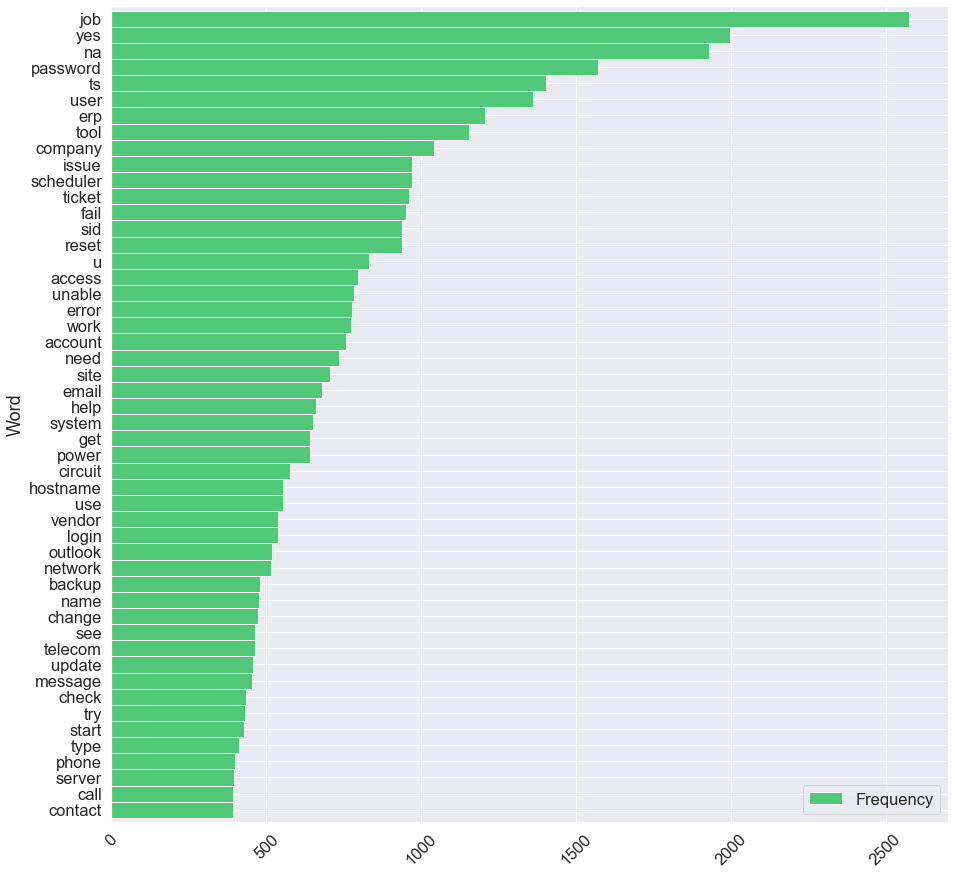

In [190]:
# top 50 most frequent words in text
top_N = 50

words = (dataset.cleaned_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
rslt[:50].transpose()
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.savefig('dist_after_cleaning.png')
plt.show()

In [1]:
#importing the data
import pandas as pd
data = pd.read_excel('./data/cleaned_data.xlsx')
data.head()

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,202,33,11,2,verified user details.,login issue,0,22,verify user detail name check user name ad res...,login issue,121,20,11,2
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,186,25,7,1,appearing in my outlook calendar,outlook,0,21,team skype appear outlook calendar somebody ad...,outlook,66,10,7,1
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,79,11,18,5,log on to vpn,log in to vpn,0,10,log vpn,ca nt log vpn,7,2,13,4
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3,unable access hr tool page,unable access hr tool page,26,5,26,5
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0,skype error,skype error,11,2,11,2


In [2]:
# reproducibility
import random
seed = 7
random.seed(seed)

In [3]:
#drop unwanted variables
data.drop(['description','char_length','word_length','short_char_length',
                   'short_word_length','group_code','char_length_bins'], axis = 1, inplace = True)

In [4]:
data.head()

,short_description,caller,group,description_keywords,short_description_keywords,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
0,login issue,spxjnwir pjlcoqds,GRP_0,verified user details.,login issue,verify user detail name check user name ad res...,login issue,121,20,11,2
1,outlook,hmjdrvpb komuaywn,GRP_0,appearing in my outlook calendar,outlook,team skype appear outlook calendar somebody ad...,outlook,66,10,7,1
2,cant log in to vpn,eylqgodm ybqkwiam,GRP_0,log on to vpn,log in to vpn,log vpn,ca nt log vpn,7,2,13,4
3,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,tool page,tool page,unable access hr tool page,unable access hr tool page,26,5,26,5
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,skype error,skype error,skype error,11,2,11,2


In [5]:
from nltk.tokenize import word_tokenize
from string import punctuation
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer #word stemmer class
lemma = WordNetLemmatizer()

In [6]:
import nltk
nltk.download('words')
words = set(nltk.corpus.words.words())
nltk.download('stopwords')
from nltk.corpus import stopwords
nltk.download('wordnet')
from nltk.corpus import wordnet
import re

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [7]:
import re

def normalizer(text):
    text = " ".join(filter(lambda x: x[0]!= '@' , text.split()))
    text = re.sub('[^a-zA-Z]', ' ', text)
    text = text.lower()
    text = re.sub(' +', ' ', text).strip()
    text = text.split()
    text = [words for words in text if not words in set(stopwords.words('english'))]
    text = [lemma.lemmatize(word) for word in text]
    
    text = " ".join(text)
    return text

In [8]:
data['shrt_data'] = data['cleaned_short_description'].apply(normalizer)

In [9]:
data.head()

,short_description,caller,group,description_keywords,short_description_keywords,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,shrt_data
0,login issue,spxjnwir pjlcoqds,GRP_0,verified user details.,login issue,verify user detail name check user name ad res...,login issue,121,20,11,2,login issue
1,outlook,hmjdrvpb komuaywn,GRP_0,appearing in my outlook calendar,outlook,team skype appear outlook calendar somebody ad...,outlook,66,10,7,1,outlook
2,cant log in to vpn,eylqgodm ybqkwiam,GRP_0,log on to vpn,log in to vpn,log vpn,ca nt log vpn,7,2,13,4,ca nt log vpn
3,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,tool page,tool page,unable access hr tool page,unable access hr tool page,26,5,26,5,unable access hr tool page
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,skype error,skype error,skype error,11,2,11,2,skype error


In [10]:
## Combining the Description and Short_description Columnns
data['Combine_Descrption'] = data['shrt_data']+data['cleaned_description']

In [11]:
data.head()

,short_description,caller,group,description_keywords,short_description_keywords,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,shrt_data,Combine_Descrption
0,login issue,spxjnwir pjlcoqds,GRP_0,verified user details.,login issue,verify user detail name check user name ad res...,login issue,121,20,11,2,login issue,login issueverify user detail name check user ...
1,outlook,hmjdrvpb komuaywn,GRP_0,appearing in my outlook calendar,outlook,team skype appear outlook calendar somebody ad...,outlook,66,10,7,1,outlook,outlookteam skype appear outlook calendar some...
2,cant log in to vpn,eylqgodm ybqkwiam,GRP_0,log on to vpn,log in to vpn,log vpn,ca nt log vpn,7,2,13,4,ca nt log vpn,ca nt log vpnlog vpn
3,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,tool page,tool page,unable access hr tool page,unable access hr tool page,26,5,26,5,unable access hr tool page,unable access hr tool pageunable access hr too...
4,skype error,owlgqjme qhcozdfx,GRP_0,skype error,skype error,skype error,skype error,11,2,11,2,skype error,skype errorskype error


In [12]:
data['Combine_Descrption'][0]

'login issueverify user detail name check user name ad reset password advise user login check caller confirm able login issue resolve'

In [13]:
#remover duplicate words in a sentence
def uniquify(string):
    output = []
    seen = set()
    for word in string.split():
        if word not in seen:
            output.append(word)
            seen.add(word)
    return ' '.join(output)

In [14]:
data['Combine_Descrption'] = data['Combine_Descrption'].apply(uniquify)

In [15]:
data['Combine_Descrption'][0]

'login issueverify user detail name check ad reset password advise caller confirm able issue resolve'

In [16]:
data=data[['group','caller','Combine_Descrption']]

In [17]:
data.head()

,group,caller,Combine_Descrption
0,GRP_0,spxjnwir pjlcoqds,login issueverify user detail name check ad re...
1,GRP_0,hmjdrvpb komuaywn,outlookteam skype appear outlook calendar some...
2,GRP_0,eylqgodm ybqkwiam,ca nt log vpnlog vpn
3,GRP_0,xbkucsvz gcpydteq,unable access hr tool pageunable page
4,GRP_0,owlgqjme qhcozdfx,skype errorskype error


In [18]:
#collapsing the targets into 3 based on count frequency
def get_cat(GRP):

    if GRP in ['GRP_8','GRP_24','GRP_12','GRP_9','GRP_2','GRP_19','GRP_3','GRP_6','GRP_13','GRP_10','GRP_5','GRP_14','GRP_25','GRP_33','GRP_4','GRP_29','GRP_18','GRP_16']:
        return 'L2'
    
    elif GRP in ['GRP_17','GRP_31', 'GRP_7','GRP_34','GRP_26','GRP_40','GRP_28','GRP_41','GRP_30','GRP_15','GRP_42','GRP_20','GRP_45','GRP_1','GRP_22','GRP_11','GRP_21','GRP_47',
                 'GRP_62','GRP_48','GRP_23','GRP_60','GRP_39','GRP_27','GRP_37','GRP_36','GRP_44','GRP_50','GRP_65','GRP_53','GRP_52','GRP_55','GRP_51','GRP_49','GRP_59','GRP_46',
                 'GRP_43','GRP_32','GRP_66','GRP_68','GRP_38','GRP_63','GRP_56','GRP_58','GRP_72','GRP_57','GRP_71','GRP_69','GRP_54','GRP_70','GRP_64','GRP_73','GRP_67','GRP_61',
                 'GRP_35']:
        return 'L3'
    else:
        return 'L1'

In [19]:
data['grp'] = data['group'].apply(get_cat)

In [20]:
data['grp'].value_counts(normalize=True) * 100

L1    46.952087
L2    40.547913
L3    12.500000
Name: grp, dtype: float64

In [21]:
#chi square test 
import scipy.stats as stats
data_crosstab = pd.crosstab(data['caller'],
                            data['grp'],
                           margins=True, margins_name="Total")

In [22]:
#HO: No relationship between caller and the target class
#HA: Signifacnt relationship between caller and target class

# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = data['caller'].unique()
columns = data['grp'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 10284.902651089269  and p value is: 0.0
Null Hypothesis is rejected.


In [23]:
#getting count freq of callers
count_freq = dict(data['caller'].value_counts())

In [24]:
data['count_freq'] = data['caller']
data['count_freq'] = data['count_freq'].map(count_freq)

In [25]:
import numpy as np

In [26]:
data['caller'] = np.where(data['count_freq']>1, 'Rep', 'No')

In [27]:
# creating a new variable callers that classifies caller into repetative and one off callers
data['caller'].value_counts(normalize=True) * 100

Rep    82.732448
No     17.267552
Name: caller, dtype: float64

In [28]:
#chi square test on the new caller variable
data_crosstab = pd.crosstab(data['caller'],
                            data['grp'],
                           margins=True, margins_name="Total")

In [29]:
#HO: No relationship between caller and the target class
#HA: Signifacnt relationship between caller and target class

# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = data['caller'].unique()
columns = data['grp'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 166.28918317240448  and p value is: 0.0
Null Hypothesis is rejected.


#### Vizualizing the type of queries based on groups

In [30]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

In [31]:
grp_0 = data[data["grp"] == 'L1']
grp_0.head()

,group,caller,Combine_Descrption,grp,count_freq
0,GRP_0,No,login issueverify user detail name check ad re...,L1,1
1,GRP_0,Rep,outlookteam skype appear outlook calendar some...,L1,4
2,GRP_0,Rep,ca nt log vpnlog vpn,L1,3
3,GRP_0,Rep,unable access hr tool pageunable page,L1,3
4,GRP_0,Rep,skype errorskype error,L1,5


In [32]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

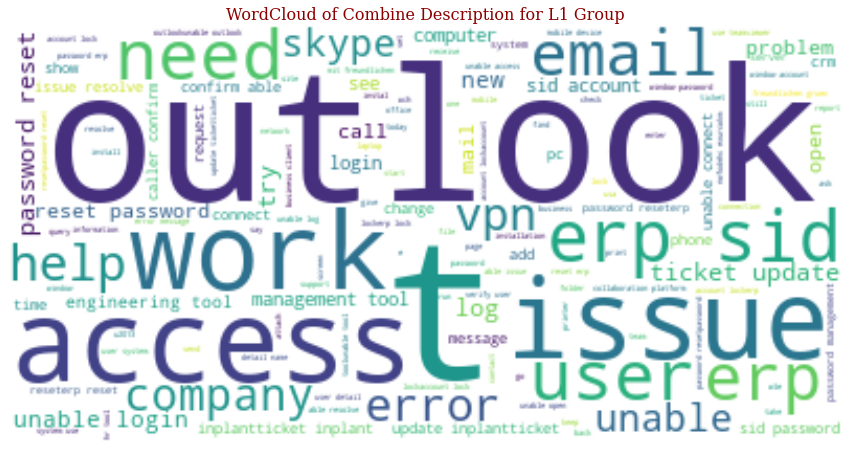

In [33]:
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 16,
        }
All_words = ""
All_words += " ".join(grp_0['Combine_Descrption'])
wordcloud = WordCloud(background_color='white').generate(All_words) # width and height in the wordcloud attribute does not work
plt.figure(figsize=(15,15))
plt.title("WordCloud of Combine Description for L1 Group", fontdict=font)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [34]:
grp_L2 = data[data["grp"] == 'L2']
grp_L2.head()

,group,caller,Combine_Descrption,grp,count_freq
17,GRP_3,Rep,undock pc screen come backundock back,L2,2
32,GRP_4,Rep,duplication network addressgentle two device t...,L2,6
43,GRP_5,Rep,reroute job printer issue need resolve todaypr...,L2,2
47,GRP_6,Rep,job fail schedulerjob 1424 scheduler 09 06 00,L2,810
50,GRP_8,Rep,job mm zscr dly merktc fail schedulerjob zscr0...,L2,810


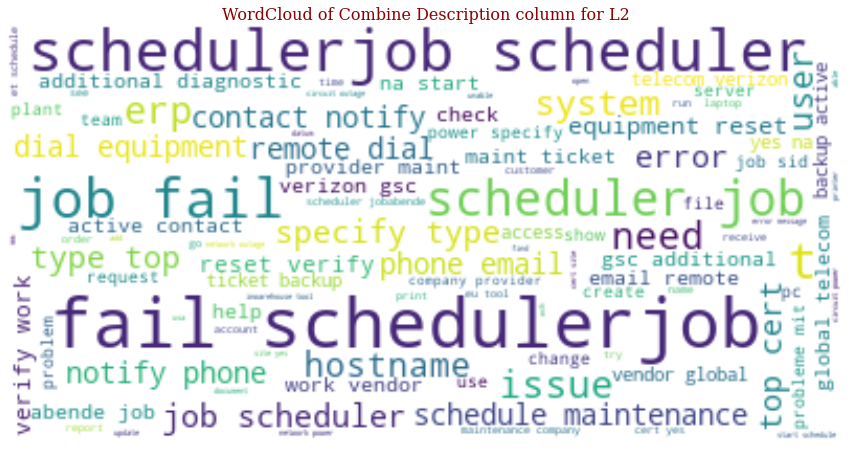

In [35]:
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 16,
        }
All_words = ""
All_words += " ".join(grp_L2['Combine_Descrption'])
wordcloud = WordCloud(background_color='white').generate(All_words) # width and height in the wordcloud attribute does not work
plt.figure(figsize=(15,15))
plt.title("WordCloud of Combine Description column for L2", fontdict=font)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [36]:
grp_L3 = data[data["grp"] == 'L3']
grp_L3.head()

,group,caller,Combine_Descrption,grp,count_freq
6,GRP_1,Rep,event critical hostname company com value moun...,L3,51
49,GRP_7,Rep,status change telephony softwareclose call age...,L3,3
83,GRP_11,Rep,engineering tool draw original pdf format show...,L3,2
140,GRP_15,Rep,channel partner receive multiple email erp urg...,L3,11
153,GRP_17,No,reset password use management tool resetget er...,L3,1


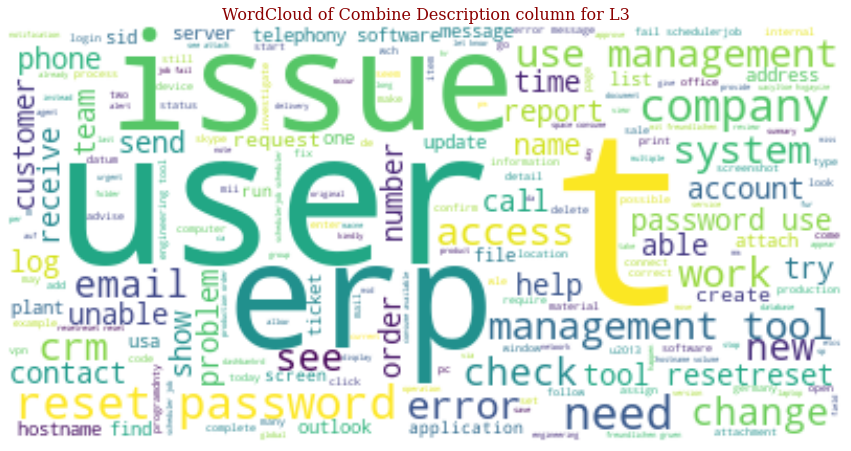

In [37]:
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 16,
        }
All_words = ""
All_words += " ".join(grp_L3['Combine_Descrption'])
wordcloud = WordCloud(background_color='white').generate(All_words) # width and height in the wordcloud attribute does not work
plt.figure(figsize=(15,15))
plt.title("WordCloud of Combine Description column for L3", fontdict=font)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [38]:
data.drop(columns = ['count_freq'], axis = 1,inplace=True)
data.head()

,group,caller,Combine_Descrption,grp
0,GRP_0,No,login issueverify user detail name check ad re...,L1
1,GRP_0,Rep,outlookteam skype appear outlook calendar some...,L1
2,GRP_0,Rep,ca nt log vpnlog vpn,L1
3,GRP_0,Rep,unable access hr tool pageunable page,L1
4,GRP_0,Rep,skype errorskype error,L1


#### Data pre-processing 

In [39]:
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
data["Label_grp"] = le.fit_transform(data["grp"])
y_classes_len = len(le.classes_)
le.classes_
print(y_classes_len)

3


In [40]:

data['caller']=np.where(data['caller']=='Rep', 1, 0)

In [41]:
data.head()

,group,caller,Combine_Descrption,grp,Label_grp
0,GRP_0,0,login issueverify user detail name check ad re...,L1,0
1,GRP_0,1,outlookteam skype appear outlook calendar some...,L1,0
2,GRP_0,1,ca nt log vpnlog vpn,L1,0
3,GRP_0,1,unable access hr tool pageunable page,L1,0
4,GRP_0,1,skype errorskype error,L1,0


In [42]:
data.drop(columns = ['group','grp'], axis = 1,inplace=True)
data.head()

,caller,Combine_Descrption,Label_grp
0,0,login issueverify user detail name check ad re...,0
1,1,outlookteam skype appear outlook calendar some...,0
2,1,ca nt log vpnlog vpn,0
3,1,unable access hr tool pageunable page,0
4,1,skype errorskype error,0


In [43]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

In [44]:
def mytokenizer(x):
    return [y for y in x.split() if len(y) > 2]

In [45]:
vec = CountVectorizer(tokenizer=mytokenizer, min_df=0.005)
X = vec.fit_transform(data['Combine_Descrption'])
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())


In [46]:
s1 = pd.Series(data['Label_grp'], name="Label_grp")
s2= pd.Series(data['caller'], name="caller")

In [47]:
df1=df.reset_index(drop=True)
s3=s1.reset_index(drop=True)
s4=s2.reset_index(drop=True)

In [48]:
result = pd.concat([df1, s3,s4], axis=1)

In [49]:
result.head()

,2016,abende,able,access,account,action,active,add,additional,address,...,without,wle,work,working,would,wrong,yes,yesterday,Label_grp,caller
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [50]:
result = result.loc[:,~result.columns.duplicated()]

In [51]:
result.head()

,2016,abende,able,access,account,action,active,add,additional,address,...,window,without,wle,work,working,would,wrong,yes,yesterday,Label_grp
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
#creating a copy of the train data and seperating the target column and the predictor variables

X=result.drop(['Label_grp'],axis=1)
y=result['Label_grp']

In [53]:
#loading required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import binarize
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score,f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold,cross_val_score,KFold
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn import metrics
import seaborn as sns
sns.set(color_codes=True)
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [54]:
# splitting data training dataset into train and test set for independent attributes
X_train, X_test, Y_train, Y_test =train_test_split(X,y, test_size=.30,random_state=105)

In [55]:
# Initializaing various classification algorithms with normal dataset and choosing the best model based on auc score for tuning

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear',probability=True)))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("GBT", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(verbosity=0)))
models.append(("LightGBM",LGBMClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=None,shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='roc_auc_ovo')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f%% (%f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

LR: 83.071664% (1.429062%)
KNN: 78.526848% (2.182676%)
GNB: 74.838250% (1.969526%)
SVM: 79.743117% (1.366922%)
DT: 71.459423% (1.369076%)
RF: 85.569903% (1.172127%)
GBT: 83.958214% (0.826341%)
XGB: 85.167831% (1.669024%)
LightGBM: 85.069043% (0.811227%)


#### LightGBM with RandomsearchCV

In [56]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

In [57]:
param_test ={'num_leaves': sp_randint(6, 50), 
             'min_child_samples': sp_randint(100, 500), 
             'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
             'subsample': sp_uniform(loc=0.2, scale=0.8), 
             'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
             'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
             'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100],
             'scale_pos_weight':[1,2,6,12]}

sample = 100

#n_estimators is set to a "large value". The actual number of trees build will depend on early stopping and 2000 define only the absolute maximum
lgb = LGBMClassifier(max_depth=-1, random_state=31, silent=True, metric='multi_logloss', n_jobs=4, n_estimators=2000)
gs = RandomizedSearchCV(
    estimator=lgb, param_distributions=param_test, 
    n_iter=sample,
    cv=5,
    refit=True,
    random_state=314,
    verbose=True)

gs.fit(X_train, Y_train)
gs.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  9.7min finished


{'colsample_bytree': 0.8914513227485243,
 'min_child_samples': 117,
 'min_child_weight': 0.01,
 'num_leaves': 7,
 'reg_alpha': 0.1,
 'reg_lambda': 5,
 'scale_pos_weight': 6,
 'subsample': 0.5804609677502011}

In [58]:
lgb=LGBMClassifier(colsample_bytree= 0.8914513227485243,
 min_child_samples= 117,
 min_child_weight= 0.01,
 num_leaves=7,
 reg_alpha= 0.1,
 reg_lambda= 5,
 scale_pos_weight= 6,
 subsample= 0.5804609677502011)
lgb.fit(X_train,Y_train)

LGBMClassifier(colsample_bytree=0.8914513227485243, min_child_samples=117,
               min_child_weight=0.01, num_leaves=7, reg_alpha=0.1, reg_lambda=5,
               scale_pos_weight=6, subsample=0.5804609677502011)

In [59]:
modellgb1=lgb.score(X_train,Y_train)
print('Accuracy Score of Training Data: ', modellgb1)

Accuracy Score of Training Data:  0.7319552694002033


In [60]:
y_predictlg1= lgb.predict(X_test)
modellg1 = accuracy_score(Y_test, y_predictlg1)
print('Accuracy Score of Test Data:', modellg1)

Accuracy Score of Test Data: 0.6988142292490118


In [61]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictlg1, labels=[0,1,2]))

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.84      0.76      1201
           1       0.70      0.71      0.70       991
           2       0.68      0.19      0.30       338

    accuracy                           0.70      2530
   macro avg       0.69      0.58      0.59      2530
weighted avg       0.70      0.70      0.68      2530



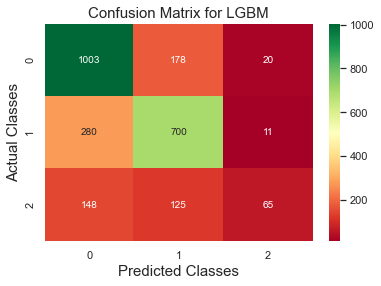

In [62]:
# visualizing confusion matrix
cm= confusion_matrix(Y_test, y_predictlg1)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for LGBM', fontsize = 15);

#### Random forest with RandomsearchCV

In [63]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = range(2,100,5)
# Minimum number of samples required at each leaf node
min_samples_leaf = range(1,100,10)
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
                'criterion':['gini','entropy']}

In [64]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, cv = 5, verbose=2, random_state=90, n_jobs = -1)
rf_random.fit(X_train, Y_train)
rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  45 out of  50 | elapsed:   29.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   36.6s finished


{'n_estimators': 463,
 'min_samples_split': 82,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'criterion': 'gini',
 'bootstrap': False}

In [65]:
rf_grid1 = RandomForestClassifier(n_estimators=463,
 min_samples_split= 82,
 min_samples_leaf=1,
 max_features= 'sqrt',
 max_depth= 110,
 criterion= 'gini',
 bootstrap= False)
rf_grid1.fit(X_train, Y_train)

RandomForestClassifier(bootstrap=False, max_depth=110, max_features='sqrt',
                       min_samples_split=82, n_estimators=463)

In [66]:
modelrfg1_score=rf_grid1.score(X_train,Y_train)
print('Accuracy Score of Training Data: ', modelrfg1_score)

Accuracy Score of Training Data:  0.8542866824805151


In [67]:
y_predictrfg1= rf_grid1.predict(X_test)
modelrfg1_score = accuracy_score(Y_test, y_predictrfg1)
print('Accuracy Score of Test Data:', modelrfg1_score)

Accuracy Score of Test Data: 0.758893280632411


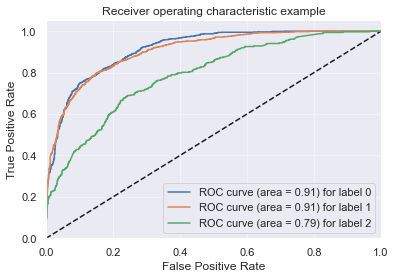

In [68]:
def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
    y_score = clf.predict_proba(X_test)

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
    for i in range(n_classes):
        fpr[i], tpr[i], _ = metrics.roc_curve(y_test_dummies[:, i], y_score[:, i])
        roc_auc[i] = metrics.auc(fpr[i], tpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %i' % (roc_auc[i], i))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.savefig('ROC_Curve_RF.png')
    plt.show()

plot_multiclass_roc(rf_grid1, X_test, Y_test, n_classes=3, figsize=(6, 4))

In [69]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictrfg1, labels=[0,1,2]))

Classification Report
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      1201
           1       0.74      0.82      0.78       991
           2       0.76      0.16      0.27       338

    accuracy                           0.76      2530
   macro avg       0.76      0.62      0.62      2530
weighted avg       0.76      0.76      0.73      2530



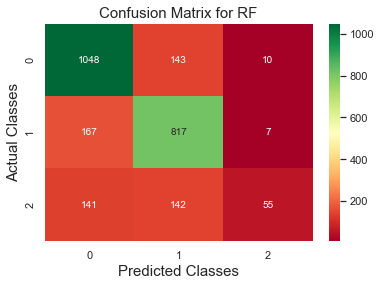

In [70]:
# visualizing confusion matrix
cm= confusion_matrix(Y_test, y_predictrfg1)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF', fontsize = 15);

#### XGBoost with RandomsearchCV

In [71]:
xgb_para = {"learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
            "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
            "min_child_weight" : [ 1, 3, 5, 7 ],
            "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
            "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ] 
           }

xgb = XGBClassifier()
xgb_hy = RandomizedSearchCV(estimator = xgb, param_distributions = xgb_para, cv = 5, verbose=2, random_state=25, n_jobs = -1)
xgb_hy.fit(X_train, Y_train)
xgb_hy.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  45 out of  50 | elapsed:  8.5min remaining:   56.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  8.6min finished


{'min_child_weight': 1,
 'max_depth': 6,
 'learning_rate': 0.2,
 'gamma': 0.0,
 'colsample_bytree': 0.7}

In [72]:
xgb=XGBClassifier(min_child_weight=1,
 max_depth=6,
 learning_rate= 0.2,
 gamma= 0,
 colsample_bytree=0.7)
xgb.fit(X_train,Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [73]:
modelxgb_score=xgb.score(X_train,Y_train)
print('Accuracy Score of Training Data: ', modelxgb_score)

Accuracy Score of Training Data:  0.8607251779057946


In [74]:
y_predictxg= xgb.predict(X_test)
modelxg_score = accuracy_score(Y_test, y_predictxg)
print('Accuracy Score of Test Data:', modelxg_score)

Accuracy Score of Test Data: 0.7640316205533597


In [75]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictxg, labels=[0,1,2]))

Classification Report
              precision    recall  f1-score   support

           0       0.77      0.89      0.83      1201
           1       0.77      0.79      0.78       991
           2       0.66      0.23      0.34       338

    accuracy                           0.76      2530
   macro avg       0.73      0.64      0.65      2530
weighted avg       0.75      0.76      0.74      2530



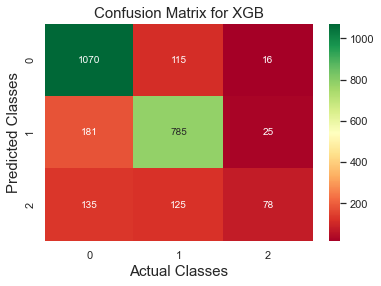

In [76]:
# visualizing confusion matrix
cm= confusion_matrix(Y_test, y_predictxg)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for XGB', fontsize = 15);

#### Based on the word cloud we do notice that there is bit of an overlap between group L1 and L3, hence collapsing the targets further into 2 classes

In [77]:
def get_cat1(GRP):

    if GRP in [1]:
        return 1
    else:
        return 0

In [78]:
dd=data.copy()

In [79]:
dd['Label_grp'] = dd['Label_grp'].apply(get_cat1)

In [80]:
dd['Label_grp'].value_counts(normalize=True) * 100

0    59.452087
1    40.547913
Name: Label_grp, dtype: float64

In [81]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

In [82]:
dd.head()

,caller,Combine_Descrption,Label_grp
0,0,login issueverify user detail name check ad re...,0
1,1,outlookteam skype appear outlook calendar some...,0
2,1,ca nt log vpnlog vpn,0
3,1,unable access hr tool pageunable page,0
4,1,skype errorskype error,0


In [83]:
vec = CountVectorizer(tokenizer=mytokenizer, min_df=0.005)
X = vec.fit_transform(dd['Combine_Descrption'])
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())

In [84]:
s1 = pd.Series(dd['Label_grp'], name="Label_grp")
s2= pd.Series(dd['caller'], name="caller")

In [85]:
df1=df.reset_index(drop=True)
s3=s1.reset_index(drop=True)
s4=s2.reset_index(drop=True)

In [86]:
result = pd.concat([df1, s3,s4], axis=1)

In [87]:
result.head()

,2016,abende,able,access,account,action,active,add,additional,address,...,without,wle,work,working,would,wrong,yes,yesterday,Label_grp,caller
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [88]:
result = result.loc[:,~result.columns.duplicated()]

In [89]:
result.head()

,2016,abende,able,access,account,action,active,add,additional,address,...,window,without,wle,work,working,would,wrong,yes,yesterday,Label_grp
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [90]:
#creating a copy of the train data and seperating the target column and the predictor variables

X=result.drop(['Label_grp'],axis=1)
y=result['Label_grp']

In [91]:
# splitting data training dataset into train and test set for independent attributes
X_train, X_test, Y_train, Y_test =train_test_split(X,y, test_size=.30,random_state=12)

In [92]:
# Initializaing various classification algorithms with normal dataset and choosing the best model based on auc score for tuning

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear',probability=True)))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("GBT", GradientBoostingClassifier()))
models.append(("XGB", XGBClassifier(verbosity=0)))
models.append(("LightGBM",LGBMClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=None,shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold,scoring='roc_auc')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f%% (%f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

LR: 88.448155% (1.250043%)
KNN: 84.695776% (2.007108%)
GNB: 84.779190% (1.925514%)
SVM: 86.350009% (2.227272%)
DT: 76.121059% (2.070598%)
RF: 90.490668% (0.905004%)
GBT: 88.714790% (1.090906%)
XGB: 89.995563% (1.472594%)
LightGBM: 90.197015% (1.267628%)


In [93]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = range(2,100,5)
# Minimum number of samples required at each leaf node
min_samples_leaf = range(1,100,10)
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
                'criterion':['gini','entropy']}

In [94]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, cv = 5, verbose=2, random_state=90, n_jobs = -1)
rf_random.fit(X_train, Y_train)
rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  45 out of  50 | elapsed:   29.3s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   35.1s finished


{'n_estimators': 463,
 'min_samples_split': 82,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'criterion': 'gini',
 'bootstrap': False}

In [95]:
rf_grid1 = RandomForestClassifier(n_estimators=463,
 min_samples_split= 82,
 min_samples_leaf=1,
 max_features= 'sqrt',
 max_depth= 110,
 criterion= 'gini',
 bootstrap= False)
rf_grid1.fit(X_train, Y_train)

RandomForestClassifier(bootstrap=False, max_depth=110, max_features='sqrt',
                       min_samples_split=82, n_estimators=463)

In [96]:
modelrfg1_score=rf_grid1.score(X_train,Y_train)
print('Accuracy Score of Training Data: ', modelrfg1_score)

Accuracy Score of Training Data:  0.9039308708912233


In [97]:
y_predictrfg1= rf_grid1.predict(X_test)
modelrfg1_score = accuracy_score(Y_test, y_predictrfg1)
print('Accuracy Score of Test Data:', modelrfg1_score)

Accuracy Score of Test Data: 0.8205533596837945


In [98]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_predictrfg1, labels=[0,1]))

Classification Report
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      1513
           1       0.79      0.76      0.77      1017

    accuracy                           0.82      2530
   macro avg       0.81      0.81      0.81      2530
weighted avg       0.82      0.82      0.82      2530



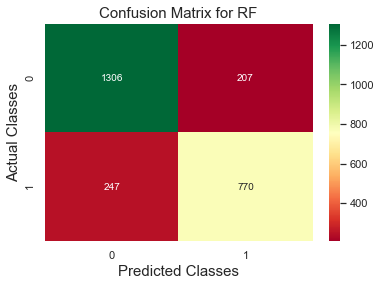

In [99]:
# visualizing confusion matrix
cm= confusion_matrix(Y_test, y_predictrfg1)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF', fontsize = 15);

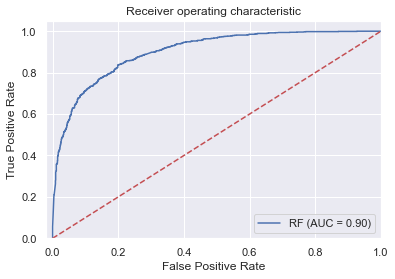

In [105]:
#Plotting ROC and AUC
probs = rf_grid1.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(Y_test, preds)
roc_auc_rfo = metrics.auc(fpr, tpr)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label='RF (AUC = %0.2f)' % roc_auc_rfo)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [101]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

          fpr       tpr     1-fpr        tf  threshold
362  0.187707  0.813176  0.812293  0.000883   0.420479


In [102]:
# store the predicted probabilities  for failed class 
y_pred_prob = rf_grid1.predict_proba(X_test)[:, 1]
# predict fail if the predicted probability is greater than 0.43
from sklearn.preprocessing import binarize
y_pred_class = binarize([y_pred_prob], 0.41)[0]

In [103]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(Y_test, y_pred_class, labels=[0, 1]))

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.81      0.84      1513
           1       0.74      0.82      0.78      1017

    accuracy                           0.81      2530
   macro avg       0.81      0.81      0.81      2530
weighted avg       0.82      0.81      0.81      2530



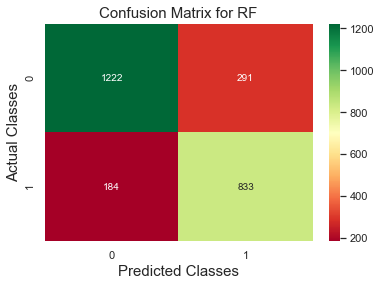

In [104]:
# visualizing confusion matrix
cm= confusion_matrix(Y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF', fontsize = 15);

- Conclusion:
  The best performing model when we consider 3 or 2 unique groups appears to be Random forest based on test accuracy

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build simple feed-forward Neural Nets and benchmark against the base ML models.</span></p>
    </h4>

In [1]:
# imports

import os
import math
import random
import warnings
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

C:\Users\surya\anaconda3\envs\full\lib\site-packages\tqdm\std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_excel('./data/cleaned_data.xlsx')
dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
1867,set abc code erp 81807016 under me in crm.,set abc code erp 81807016 under me in crm. in ...,srhoeyza rkhuldgq,GRP_40,56,13,43,9,set abc code erp,set abc code erp,35,7,set abc code erp 81807016 crm erp ok,set abc code erp 81807016 crm,36,8,29,6
3587,vip 1: please add me to the allowed sender lis...,please add me to the allowed sender list for t...,hkrecpfv kgwpbexv,GRP_26,66,13,73,15,usx team members,usx team members,19,8,add allow sender list usx team member,vip 1 add allow sender list usx team member,37,7,43,9
6957,business_client SID_1 search_server not working,"hi, i can find documents in engineering tool S...",aqourvgz mkehgcdu,GRP_14,238,39,47,5,documents in engineering tool SID,client SID,6,25,find document engineer tool sid 1 business cli...,business client sid 1 search server work,154,24,40,7
4623,no response from other side.,no response from other side.,efbwiadp dicafxhv,GRP_0,28,5,28,5,response from other side,response from other side,0,2,response side,response side,13,2,13,2
5862,wireless outage again-taiwan 0830,\n\nreceived from: ticqvhal.vgokzesi@gmail.com...,ticqvhal vgokzesi,GRP_4,110,10,33,4,outage of taiwan,wireless outage again-taiwan,34,14,wireless companysecure outage taiwan help,wireless outage taiwan 0830,41,5,27,4
3595,computer crashed after a reboot,computer crashed after a reboot,zstkagwu jlyrhdcf,GRP_0,31,5,31,5,computer crashed after a reboot,computer crashed after a reboot,0,3,computer crash reboot,computer crash reboot,21,3,21,3
2439,summary:when i run wip list and try to do my r...,summary:when i run wip list and try to do my r...,gdpxqyhj iapghvke,GRP_0,111,22,111,22,table field name not valid,table field name not valid,0,13,summary run wip list try report get run time e...,summary run wip list try report get run time e...,84,16,84,16
3892,user unable tologin to vpn.,name:lizhwdoe mjudivse\nlanguage:\nbrowser:mic...,lizhwdoe mjudivse,GRP_0,160,15,28,5,microsoft internet explorer email,user unable tologin to vpn,0,17,ca t login vpn,user unable tologin vpn,14,4,23,4
676,account unlock,account unlock,eboutzmn umzvbkfh,GRP_0,14,2,14,2,account unlock,account unlock,0,0,account unlock,account unlock,14,2,14,2
2096,need access to folder,\n\nreceived from: umdyvbxo.qwzstijr@gmail.com...,umdyvbxo qwzstijr,GRP_12,113,15,22,4,drive of usa,access to folder,4,14,need access quality folder lan d2 drive usa,need access folder,43,8,18,3


In [4]:
dataset.isna().sum()

short_description              0
description                    0
caller                         0
group                          0
char_length                    0
word_length                    0
short_char_length              0
short_word_length              0
description_keywords           7
short_description_keywords    38
group_code                     0
char_length_bins               0
cleaned_description            0
cleaned_short_description      0
cleaned_char_length            0
cleaned_word_length            0
cleaned_short_char_length      0
cleaned_short_word_length      0
dtype: int64

In [5]:
dataset[dataset.isna().any(axis=1)].to_csv('./data/missing_keywords.csv')
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
483,: k-bngell-cgdaytshqsd <k-bngell-cgdaytshqsd@c...,\n\nreceived from: lvxakohq.tsfnhowj@gmail.com...,lvxakohq tsfnhowj,GRP_19,210,33,69,3,rao left company. with kind,NaN,11,22,pl add name ts team also need administrative c...,k bngell cgdaytshqsd,107,19,20,3
708,id 04637,id 04637 printer have paper stuck up issue.,ongumpdz pjkrfmbc,GRP_19,43,8,8,2,printer have paper stuck,NaN,11,5,04637 printer paper stick issue,04637,31,5,5,1
755,pc name,\n\nreceived from: koahsriq.wdugqatr@gmail.com...,koahsriq wdugqatr,GRP_28,323,37,7,2,service tag,NaN,21,33,need new pc name service tag pc fy80nkssc2 u04...,pc name,220,36,7,2
1114,id : 1064870825,id : 2175981936\n\nperson on other side discon...,efbwiadp dicafxhv,GRP_0,51,8,15,3,person on other side disconnected,NaN,0,6,2175981936 person side disconnect,1064870825,33,4,10,1
1294,"dn 9169508476,t/o 642392",\n\nreceived from: gjtyswkb.dpvaymxr@gmail.com...,gjtyswkb dpvaymxr,GRP_6,129,19,24,3,received,NaN,56,15,dear chk dn 9169508476 help check urgent,dn 9169508476 642392,40,7,20,3
1331,"apac, company: multiple switches went down at ...",company-ap-chn-apac-company-fpsf-2960s-access-...,mnlazfsr mtqrkhnx,GRP_8,150,3,68,12,NaN,apac,72,17,company ap chn apac company fpsf 2960s access ...,apac company multiple switch go 07 36 pm et,150,27,43,9
1641,need help,\n\nreceived from: axcbfuqo.yiagubvh@gmail.com...,axcbfuqo yiagubvh,GRP_0,376,65,9,2,good morning,NaN,0,35,trouble password change password possibility c...,need help,188,26,9,2
1823,bgflmyar.xgufkidq@gmail.com wanted to check if...,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,83,13,tool on his phone,NaN,0,10,want check login hr tool phone,want check login hr tool phone,30,6,30,6
2396,need your help!!,\n\nreceived from: ezwcpqrh.bnwqaglk@gmail.com...,ezwcpqrh bnwqaglk,GRP_0,571,93,17,3,emal thru the web mail,NaN,0,44,desk send ts emal thru web mail open ms office...,need help,304,49,9,2
2436,changes in ad,"hi, there,\nmy reporting line in the outlook o...",ywbnzxud qzwrynux,GRP_2,246,44,13,3,outlook organization system is wrong,NaN,12,25,report line outlook organization system wrong ...,change ad,139,20,9,2


In [6]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8432 entries, 0 to 8431
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   short_description           8432 non-null   object
 1   description                 8432 non-null   object
 2   caller                      8432 non-null   object
 3   group                       8432 non-null   object
 4   char_length                 8432 non-null   int64 
 5   word_length                 8432 non-null   int64 
 6   short_char_length           8432 non-null   int64 
 7   short_word_length           8432 non-null   int64 
 8   description_keywords        8425 non-null   object
 9   short_description_keywords  8394 non-null   object
 10  group_code                  8432 non-null   int32 
 11  char_length_bins            8432 non-null   int64 
 12  cleaned_description         8432 non-null   object
 13  cleaned_short_description   8432 non-null   obje

In [7]:
le.classes_

array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
       'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
       'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
       'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
       'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
       'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
       'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
       'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
       'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
      dtype=object)

In [8]:
def merge_descriptions(row):
    merged_descr = np.nan
    if (row.cleaned_short_description == row.cleaned_description or 
        str(row.description).startswith(str(row.cleaned_short_description))):
        merged_descr = str(row.cleaned_description)
    else:
        merged_descr = str(row.cleaned_short_description) + " " + str(row.cleaned_description)
    row['merged_description'] = str(merged_descr)
    return row

dataset = dataset.progress_apply(merge_descriptions, axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 8432/8432 [00:08<00:00, 975.45it/s]


In [9]:
dataset[['cleaned_short_description', 'cleaned_description', 'merged_description']].sample(10)

,cleaned_short_description,cleaned_description,merged_description
2192,kein datenabgleich zwischen eu tool und erp ge...,kein datenabgleich zwischen eu tool und erp ge...,kein datenabgleich zwischen eu tool und erp ge...
3095,business client work,unable access business client open business cl...,business client work unable access business cl...
458,job job 593 fail job scheduler 05 07 00,job job 593 fail job scheduler 05 07 00,job job 593 fail job scheduler 05 07 00
693,hostname 1325 drive flasng yellow message disp...,check hostname 1325 shop floor app server driv...,hostname 1325 drive flasng yellow message disp...
5953,login help hub,login help hub,login help hub
2405,prognose crm forecast plan dashbankrd work res...,dear one user affect get sale rep indicate ca ...,prognose crm forecast plan dashbankrd work res...
4868,job job 2555 fail job scheduler 22 00 00,job job 2555 fail job scheduler 22 00 00,job job 2555 fail job scheduler 22 00 00
745,reinstall hardcopy und eu tool lndypaqg,reinstall hardcopy und eu tool lndypaqg,reinstall hardcopy und eu tool lndypaqg
488,login issue,login issue verify user detail name check user...,login issue verify user detail name check user...
6663,probleme mit vpn client,hallo meine herren ich kann unsere vpn nicht b...,probleme mit vpn client hallo meine herren ich...


In [10]:
X = np.array(dataset.merged_description)
y = np.array(dataset.group_code)
X.shape, y.shape

((8432,), (8432,))

In [11]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0,
 array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [12]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.2, random_state=seed)  # splits are stratified by y

In [13]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6745,), (1687,), (6745, 74), (1687, 74))

In [14]:
X_train[0], y_train[0]  # check sample

('additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket',
 array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [15]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [16]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [17]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([184,
  2093,
  93,
  606,
  1609,
  10,
  148,
  45,
  116,
  169,
  146,
  375,
  15,
  93,
  6817,
  148,
  1609,
  45,
  116,
  1513,
  116,
  23,
  1729,
  674,
  45,
  1513,
  116,
  804,
  6818,
  30,
  75,
  148,
  75,
  2370,
  45,
  1513,
  116,
  23,
  4267,
  90,
  146,
  3354,
  45,
  116,
  1513,
  73,
  10,
  188,
  148,
  6819,
  23,
  1195,
  174,
  148,
  804,
  146,
  117,
  88,
  17],
 [93, 2095, 280, 1029, 783, 355, 9, 2095, 1029, 1360, 2095, 211, 280])

In [18]:
y_train[0], y_test[0]

(array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], dtype=float32))

In [19]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (6745, 100)
X test:   (1687, 100)


In [20]:
pprint(X_train_padded[0], compact=True)

array([ 184, 2093,   93,  606, 1609,   10,  148,   45,  116,  169,  146,
        375,   15,   93, 6817,  148, 1609,   45,  116, 1513,  116,   23,
       1729,  674,   45, 1513,  116,  804, 6818,   30,   75,  148,   75,
       2370,   45, 1513,  116,   23, 4267,   90,  146, 3354,   45,  116,
       1513,   73,   10,  188,  148, 6819,   23, 1195,  174,  148,  804,
        146,  117,   88,   17,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0])


In [21]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['job', 'yes', 'na', 'password', 'erp', 'tool', 'user', 'ts', 'issue',
 'company', 'sid', 'reset', 'access', 'scheduler', '1', '00', 'ticket',
 'unable', 'work', 'error', 'fail', 'account', 'need', 'email', 'site', 'help',
 'system', 'hostname', 'get', '2', 'login', 'circuit', 'power', 'outlook',
 'network', 'use', 'vendor', 'change', '34', 'update', 'name', 'message',
 'backup', 'see', 'phone', 'telecom', 'server', 'try', '10', 'able', 'outage',
 'log', 'check', 'new', 'problem', 'start', 'crm', 'engineering', 'request',
 'connect', 'call', 'usa', 'type', 'time', 'printer', 'order', 'report', 'vpn',
 'team', 'open', 'contact', 'skype', '3', 'lock', 'plant', 'et', 't', 'send',
 'create', '4', '5', 'window', 'file', 'pc', 'since', 'print', 'schedule',
 'attach', 'device', 'show', '8', 'maintenance', 'sale', '11', '12', 'receive',
 'abende', 'notify', '23', 'management']


In [22]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13790

In [23]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'1 22 team response complaint synchronize <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [24]:
EMBEDDING_DIM

300

In [25]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [26]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [27]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [28]:
NUM_CLASSES = len(le.classes_)
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13790, 100, 300, 74)

In [29]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [30]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [31]:
X_train[0]

'additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket'

In [32]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((6745,), (6745, 74), (1687,), (1687, 74))

In [33]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.85944 >|> 
 ~| Epoch: 2 | Validation Loss: 1.74150 >|> 
 ~| Epoch: 3 | Validation Loss: 1.72742 >|> 
 ~| Epoch: 4 | Validation Loss: 2.12246 >|> 
 ~| Epoch: 5 | Validation Loss: 2.14895 >|> 
 ~| Epoch: 6 | Validation Loss: 2.37142 >|> 
 ~| Epoch: 7 | Validation Loss: 2.50962 >|> 

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 8 | Validation Loss: 2.61027 >|> 
 ~| Epoch: 9 | Validation Loss: 2.71168 >|> 
 ~| Epoch: 10 | Validation Loss: 2.77748 >|> 

Training Done.


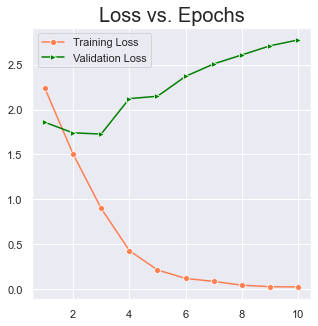

In [34]:
plot_learning_curve(h1)

In [35]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 8ms/step - loss: 1.8063 - accuracy: 0.6040
Testing Loss:  180.633807182312
Testing Accuracy:  60.40308475494385


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

In [36]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [37]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.59394 >|> 
 ~| Epoch: 2 | Validation Loss: 1.94380 >|> 
 ~| Epoch: 3 | Validation Loss: 1.84034 >|> 
 ~| Epoch: 4 | Validation Loss: 1.80988 >|> 
 ~| Epoch: 5 | Validation Loss: 1.82323 >|> 
 ~| Epoch: 6 | Validation Loss: 1.83685 >|> 
 ~| Epoch: 7 | Validation Loss: 1.91414 >|> 
 ~| Epoch: 8 | Validation Loss: 2.04519 >|> 

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 9 | Validation Loss: 1.89107 >|> 
 ~| Epoch: 10 | Validation Loss: 1.95908 >|> 
 ~| Epoch: 11 | Validation Loss: 1.95138 >|> 

Training Done.


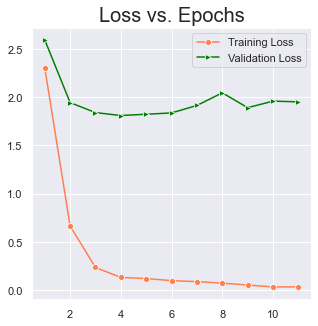

In [38]:
plot_learning_curve(h2)

In [39]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 5ms/step - loss: 1.8225 - accuracy: 0.6343
Testing Loss:  182.25327730178833
Testing Accuracy:  63.42620253562927


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Add Dropout Layer</span></strong></li>
</ul></h4>

In [40]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [41]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.05753 >|> 
 ~| Epoch: 2 | Validation Loss: 1.84023 >|> 
 ~| Epoch: 3 | Validation Loss: 1.74239 >|> 
 ~| Epoch: 4 | Validation Loss: 1.70713 >|> 
 ~| Epoch: 5 | Validation Loss: 1.64135 >|> 
 ~| Epoch: 6 | Validation Loss: 1.68905 >|> 
 ~| Epoch: 7 | Validation Loss: 1.67758 >|> 
 ~| Epoch: 8 | Validation Loss: 1.76820 >|> 
 ~| Epoch: 9 | Validation Loss: 1.92260 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 1.89466 >|> 
 ~| Epoch: 11 | Validation Loss: 1.96651 >|> 
 ~| Epoch: 12 | Validation Loss: 1.99445 >|> 

Training Done.


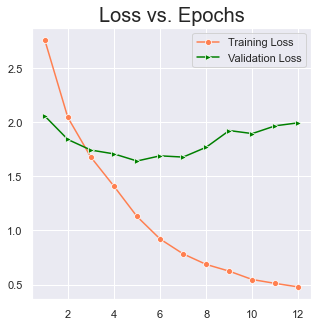

In [42]:
plot_learning_curve(h3)

In [43]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.6926 - accuracy: 0.6473
Testing Accuracy:  64.73029255867004


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [44]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [45]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.84620 >|> 
 ~| Epoch: 2 | Validation Loss: 1.72238 >|> 
 ~| Epoch: 3 | Validation Loss: 1.64293 >|> 
 ~| Epoch: 4 | Validation Loss: 1.67915 >|> 
 ~| Epoch: 5 | Validation Loss: 1.67839 >|> 
 ~| Epoch: 6 | Validation Loss: 1.78722 >|> 
 ~| Epoch: 7 | Validation Loss: 1.82795 >|> 

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 8 | Validation Loss: 1.88995 >|> 
 ~| Epoch: 9 | Validation Loss: 1.95935 >|> 
 ~| Epoch: 10 | Validation Loss: 2.01581 >|> 

Training Done.


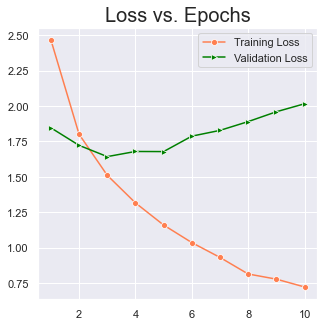

In [46]:
plot_learning_curve(h3)

In [47]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.7662 - accuracy: 0.6153
Testing Accuracy:  61.52934432029724


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [48]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [49]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.50286 >|> 
 ~| Epoch: 2 | Validation Loss: 2.47478 >|> 
 ~| Epoch: 3 | Validation Loss: 2.46620 >|> 
 ~| Epoch: 4 | Validation Loss: 2.46253 >|> 
 ~| Epoch: 5 | Validation Loss: 2.45951 >|> 
 ~| Epoch: 6 | Validation Loss: 2.46105 >|> 
 ~| Epoch: 7 | Validation Loss: 2.45835 >|> 
 ~| Epoch: 8 | Validation Loss: 2.38237 >|> 
 ~| Epoch: 9 | Validation Loss: 2.36089 >|> 
 ~| Epoch: 10 | Validation Loss: 2.30717 >|> 
 ~| Epoch: 11 | Validation Loss: 2.26101 >|> 
 ~| Epoch: 12 | Validation Loss: 2.27733 >|> 
 ~| Epoch: 13 | Validation Loss: 2.23432 >|> 
 ~| Epoch: 14 | Validation Loss: 2.23029 >|> 
 ~| Epoch: 15 | Validation Loss: 2.23706 >|> 
 ~| Epoch: 16 | Validation Loss: 2.23212 >|> 
 ~| Epoch: 17 | Validation Loss: 2.24156 >|> 
 ~| Epoch: 18 | Validation Loss: 2.25283 >|> 

Epoch 00018: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 19 | Validation Loss: 2.22072 >|> 
 ~| Epoch: 20 | Validation Loss: 2.24

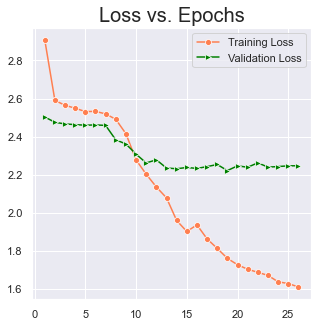

In [50]:
plot_learning_curve(h4)

In [51]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 9ms/step - loss: 2.2392 - accuracy: 0.4991
Testing Accuracy:  49.91108477115631


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [52]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [53]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.98917 >|> 
 ~| Epoch: 2 | Validation Loss: 1.84032 >|> 
 ~| Epoch: 3 | Validation Loss: 1.71317 >|> 
 ~| Epoch: 4 | Validation Loss: 1.69194 >|> 
 ~| Epoch: 5 | Validation Loss: 1.62231 >|> 
 ~| Epoch: 6 | Validation Loss: 1.60189 >|> 
 ~| Epoch: 7 | Validation Loss: 1.61941 >|> 
 ~| Epoch: 8 | Validation Loss: 1.63725 >|> 
 ~| Epoch: 9 | Validation Loss: 1.66948 >|> 
 ~| Epoch: 10 | Validation Loss: 1.57714 >|> 
 ~| Epoch: 11 | Validation Loss: 1.57898 >|> 
 ~| Epoch: 12 | Validation Loss: 1.66979 >|> 
 ~| Epoch: 13 | Validation Loss: 1.63858 >|> 
 ~| Epoch: 14 | Validation Loss: 1.65452 >|> 

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 15 | Validation Loss: 1.66364 >|> 
 ~| Epoch: 16 | Validation Loss: 1.66259 >|> 
 ~| Epoch: 17 | Validation Loss: 1.68847 >|> 

Training Done.


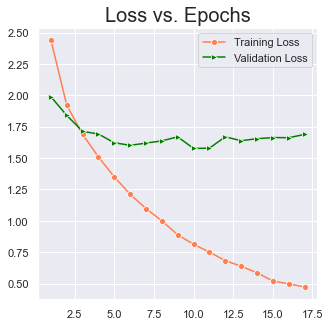

In [54]:
plot_learning_curve(h4)

In [55]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 16ms/step - loss: 1.5843 - accuracy: 0.6586
Testing Accuracy:  65.85655212402344


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [56]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [57]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.15953 >|> 
 ~| Epoch: 2 | Validation Loss: 2.03527 >|> 
 ~| Epoch: 3 | Validation Loss: 1.97933 >|> 
 ~| Epoch: 4 | Validation Loss: 1.97626 >|> 
 ~| Epoch: 5 | Validation Loss: 1.95289 >|> 
 ~| Epoch: 6 | Validation Loss: 1.97950 >|> 
 ~| Epoch: 7 | Validation Loss: 2.01043 >|> 
 ~| Epoch: 8 | Validation Loss: 2.00164 >|> 
 ~| Epoch: 9 | Validation Loss: 2.03195 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 2.04752 >|> 
 ~| Epoch: 11 | Validation Loss: 2.07280 >|> 
 ~| Epoch: 12 | Validation Loss: 2.14650 >|> 

Training Done.


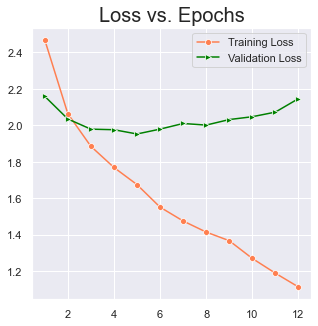

In [58]:
plot_learning_curve(h5)

In [59]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 14ms/step - loss: 1.9861 - accuracy: 0.5471
Testing Accuracy:  54.712510108947754


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [60]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [61]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 1.92552 >|> 
 ~| Epoch: 2 | Validation Loss: 1.82282 >|> 
 ~| Epoch: 3 | Validation Loss: 1.76291 >|> 
 ~| Epoch: 4 | Validation Loss: 1.73482 >|> 
 ~| Epoch: 5 | Validation Loss: 1.71375 >|> 
 ~| Epoch: 6 | Validation Loss: 1.75450 >|> 
 ~| Epoch: 7 | Validation Loss: 1.78363 >|> 
 ~| Epoch: 8 | Validation Loss: 1.79060 >|> 
 ~| Epoch: 9 | Validation Loss: 1.88543 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 1.88504 >|> 
 ~| Epoch: 11 | Validation Loss: 1.90626 >|> 
 ~| Epoch: 12 | Validation Loss: 1.91783 >|> 

Training Done.


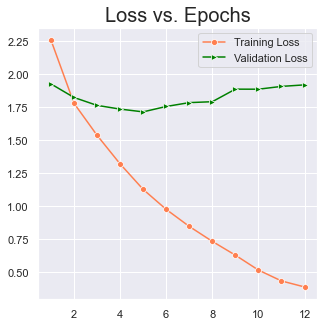

In [62]:
plot_learning_curve(h5)

In [63]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 4s 80ms/step - loss: 1.7774 - accuracy: 0.5987
Testing Accuracy:  59.869593381881714


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [72]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train, X_test, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.2, random_state=seed)
print(f"Train dataset shape: {X_train.shape}, \nTest dataset shape: {X_test.shape}")

Train dataset shape: (6745,), 
Test dataset shape: (1687,)


In [73]:
NGRAM_RANGE = (1, 2)
TOP_K = 20000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 17085), 
Test dataset shape: (1687, 17085)


In [74]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 17085), 
Test dataset shape: (1687, 17085)


In [79]:
model6 = Sequential([   
    Dense(64, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.2),
    Dense(16, activation='relu'),
    Dropout(0.2),
    Dense(NUM_CLASSES, activation='softmax')
])

model6.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [80]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 2.20277 >|> 
 ~| Epoch: 2 | Validation Loss: 1.91673 >|> 
 ~| Epoch: 3 | Validation Loss: 1.77355 >|> 
 ~| Epoch: 4 | Validation Loss: 1.67736 >|> 
 ~| Epoch: 5 | Validation Loss: 1.62489 >|> 
 ~| Epoch: 6 | Validation Loss: 1.59852 >|> 
 ~| Epoch: 7 | Validation Loss: 1.58639 >|> 
 ~| Epoch: 8 | Validation Loss: 1.60385 >|> 
 ~| Epoch: 9 | Validation Loss: 1.61785 >|> 
 ~| Epoch: 10 | Validation Loss: 1.62052 >|> 
 ~| Epoch: 11 | Validation Loss: 1.64508 >|> 
 ~| Epoch: 12 | Validation Loss: 1.70458 >|> 
 ~| Epoch: 13 | Validation Loss: 1.73147 >|> 
 ~| Epoch: 14 | Validation Loss: 1.77386 >|> 

Training Done.


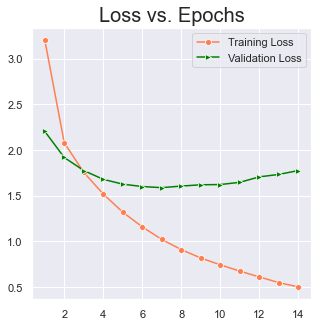

In [81]:
plot_learning_curve(h6)

In [82]:
loss, acc = model6.evaluate(X_test_vec, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 7ms/step - loss: 1.5654 - accuracy: 0.6680
Testing Accuracy:  66.80498123168945


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Resultant Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Nerual Net</td>
    <td>60.40</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>63.43</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>64.73</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Pre-trained GLoVe embeddings</td>
    <td>61.53</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>49.91</td>
  </tr>
    <tr>
    <td>Bi-Directional LSTM</td>
    <td>65.87</td>

<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>54.71</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>59.87</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>66.80</td>
  </tr>
</table>

<h4>
<ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">OBJECTIVE:</span></strong></li>
</ul>
<p><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use the text data to build simple feed-forward Neural Nets and benchmark against the base ML models.</span></p>
    </h4>

In [1]:
# imports

import os
import math
import random
import warnings
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud, STOPWORDS
import tensorflow

tqdm.pandas()
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

C:\Users\surya\anaconda3\envs\full\lib\site-packages\tqdm\std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import the clean data.</span></strong></li>
</ul></h3>

In [3]:
dataset = pd.read_excel('./data/cleaned_data.xlsx')
dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
2600,job Job_534 failed in job_scheduler at: 10/01/...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8,105,11,61,8,job Job,job Job,72,12,job job 534 fail job scheduler 01 04 00,job job 534 fail job scheduler 01 04 00,39,9,39,9
2113,4908206193/00001 dn required by 2 oclock est,\n\nreceived from: kaguhxwo.uoyipxqg@gmail.com...,kaguhxwo uoyipxqg,GRP_6,135,17,44,7,warehouse today before they cut,oclock est,56,16,create dn 5019317204 00001 warehouse today cut...,4908206193 00001 dn require 2 clock e,51,8,37,7
5215,unable to connect to company wi-fi,unable to connect to company wi-fi,ntuhoafg bzwefjvk,GRP_0,35,6,35,6,unable to connect to company,unable to connect to company,0,4,unable connect company wi fi,unable connect company wi fi,28,5,28,5
5068,netweaver -,\n\nreceived from: bcxpeuko.utorqehx@gmail.com...,bcxpeuko utorqehx,GRP_0,176,21,12,2,update the netweaver,netweaver,0,20,help update netweaver receive message,netweaver,37,5,9,1
4093,HostName_170- swap space on:HostName_170 is 75...,HostName_170- swap space on:HostName_170 is 75...,spxqmiry zpwgoqju,GRP_47,55,8,55,8,HostName,HostName,42,6,hostname 170 swap space hostname 170 75 less,hostname 170 swap space hostname 170 75 less,44,8,44,8
6155,it help for engineering_tool and engineering_...,"dear sir,\n\nplease help to download software ...",vxhyftae tbkyfdli,GRP_0,248,41,50,6,dear sir,engineering,0,26,dear help download software engineering tool e...,help engineer tool engineering tool,172,23,35,5
5578,i need access to the deleted folder on collabo...,i can't find a mti certificate tracking form o...,hdfcwmag plxstkad,GRP_16,111,18,62,9,certificate tracking form on collaboration,deleted folder on collaboration,8,13,ca t find mti certificate tracking form collab...,need access delete folder collaboration platform,86,14,48,6
4198,"milano,italy: duplex mismatch gi2/0/1 on 1811...",duplex mismatch: duplex mode on interface giga...,mnlazfsr mtqrkhnx,GRP_4,531,66,112,17,duplex mode matches,duplex mismatch,34,42,duplex mismatch duplex mode interface gigabite...,milano italy duplex mismatch gi2 0 1 1811 rout...,330,50,89,17
1556,grir issues plant_322 for ice alt. routes from...,email from maryhtutina bauuyternfeyt to athynd...,cbligfne wmoxktnj,GRP_53,443,63,50,9,maryhtutina bauuyternfeyt to athyndy eartyp,grir issues plant,49,38,email maryhtutina bauuyternfeyt athyndy eartyp...,grir issue plant 322 ice alt route usa,324,44,38,8
852,pc rqxw8515267 setup for remote company use ca...,pc rqxw8515267 setup for remote company use ca...,xweclugf qmhbjsyi,GRP_3,111,19,111,19,setup for remote company,setup for remote company,23,13,pc rqxw8515267 setup remote company use log ap...,pc rqxw8515267 setup remote company use log ap...,72,11,72,11


In [4]:
dataset.isna().sum()

short_description              0
description                    0
caller                         0
group                          0
char_length                    0
word_length                    0
short_char_length              0
short_word_length              0
description_keywords           7
short_description_keywords    38
group_code                     0
char_length_bins               0
cleaned_description            0
cleaned_short_description      0
cleaned_char_length            0
cleaned_word_length            0
cleaned_short_char_length      0
cleaned_short_word_length      0
dtype: int64

In [5]:
dataset.loc[dataset["group"] != 'GRP_0', 'group'] = 'Other'
dataset.loc[dataset["group"] == 'GRP_0', "group"] = 'Group 0'

In [6]:
dataset.group.value_counts()

Other      4473
Group 0    3959
Name: group, dtype: int64

In [7]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8432 entries, 0 to 8431
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   short_description           8432 non-null   object
 1   description                 8432 non-null   object
 2   caller                      8432 non-null   object
 3   group                       8432 non-null   object
 4   char_length                 8432 non-null   int64 
 5   word_length                 8432 non-null   int64 
 6   short_char_length           8432 non-null   int64 
 7   short_word_length           8432 non-null   int64 
 8   description_keywords        8425 non-null   object
 9   short_description_keywords  8394 non-null   object
 10  group_code                  8432 non-null   int32 
 11  char_length_bins            8432 non-null   int64 
 12  cleaned_description         8432 non-null   object
 13  cleaned_short_description   8432 non-null   obje

In [8]:
le.classes_

array(['Group 0', 'Other'], dtype=object)

In [9]:
def merge_descriptions(row):
    merged_descr = np.nan
    if (row.cleaned_short_description == row.cleaned_description or 
        str(row.description).startswith(str(row.cleaned_short_description))):
        merged_descr = str(row.cleaned_description)
    else:
        merged_descr = str(row.cleaned_short_description) + " " + str(row.cleaned_description)
    row['merged_description'] = str(merged_descr)
    return row

dataset = dataset.progress_apply(merge_descriptions, axis=1)

100%|██████████████████████████████████████████████████████████████████████████| 8432/8432 [00:10<00:00, 823.10it/s]


In [10]:
dataset[['cleaned_short_description', 'cleaned_description', 'merged_description']].sample(10)

,cleaned_short_description,cleaned_description,merged_description
6628,vpn connection issue,vpn connection issue connect user system use t...,vpn connection issue connect user system use t...
753,job bk biaprod fail job scheduler 05 12 00,job bk biaprod fail job scheduler 05 12 00,job bk biaprod fail job scheduler 05 12 00
5807,window printing issue need driver instal every...,window printing issue need driver instal every...,window printing issue need driver instal every...
7788,abende job job scheduler job 1148,abende job job scheduler job 1148 01 15 24,abende job job scheduler job 1148 abende job j...
2974,unable login ess protel,unable login ess portal,unable login ess protel unable login ess portal
6821,user unable login erp,user unable login erp,user unable login erp
2530,bex analyzer bex designer work,bex analyzer bex designer work,bex analyzer bex designer work
7194,setup new ws gonzale,setup new ws gonzale,setup new ws gonzale
6523,open pptx file attach email give repair error,open pptx file attach email give repair error,open pptx file attach email give repair error
7671,abende job job scheduler sid 38hotf,abende job job scheduler sid 38hotf 23 06 26,abende job job scheduler sid 38hotf abende job...


In [11]:
X = np.array(dataset.merged_description)
y = np.array(dataset.group_code)
X.shape, y.shape

((8432,), (8432,))

In [12]:
from tensorflow.keras.utils import to_categorical
y_dummy_coded = to_categorical(y)
y[0], y_dummy_coded[0]

(0, array([1., 0.], dtype=float32))

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_dummy_coded, test_size=.2, random_state=seed)  # splits are stratified by y

In [14]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6745,), (1687,), (6745, 2), (1687, 2))

In [15]:
X_train[0], y_train[0]  # check sample

('additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket',
 array([0., 1.], dtype=float32))

In [16]:
# TODO: Check the distributions of groups in training and testing sets, i.e, if they vary too much
# stratify by y if required during splits
# or data augmentation to upsample minority classes to balance the group distributions

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Tokenize and pad sequences</span></strong></li>
</ul></h3>

In [17]:
# define params
NUM_WORDS = 20000
EMBEDDING_DIM = 300
MAX_LEN = 100 # dataset['word_length'].max()
MAX_LEN

100

In [18]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tokenizer = Tokenizer(num_words=NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train_tokens = tokenizer.texts_to_sequences(X_train)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
X_train_tokens[0], X_test_tokens[0]

([184,
  2093,
  93,
  606,
  1609,
  10,
  148,
  45,
  116,
  169,
  146,
  375,
  15,
  93,
  6817,
  148,
  1609,
  45,
  116,
  1513,
  116,
  23,
  1729,
  674,
  45,
  1513,
  116,
  804,
  6818,
  30,
  75,
  148,
  75,
  2370,
  45,
  1513,
  116,
  23,
  4267,
  90,
  146,
  3354,
  45,
  116,
  1513,
  73,
  10,
  188,
  148,
  6819,
  23,
  1195,
  174,
  148,
  804,
  146,
  117,
  88,
  17],
 [93, 2095, 280, 1029, 783, 355, 9, 2095, 1029, 1360, 2095, 211, 280])

In [19]:
y_train[0], y_test[0]

(array([0., 1.], dtype=float32), array([0., 1.], dtype=float32))

In [20]:
# pad sequences to cut longer texts to a uniform length and pad the sentences that are shorter than that with <PAD> token

# using just 20 words from each headline will severely limit the information that is 
# available to the model and affect performance although the training will be faster
X_train_padded = pad_sequences(X_train_tokens,
                               padding='post',
                               truncating='post',
                               maxlen=MAX_LEN)
X_test_padded = pad_sequences(X_test_tokens,
                              padding='post',
                              truncating='post',
                              maxlen=MAX_LEN)


print(f'X train:  {X_train_padded.shape}\nX test:   {X_test_padded.shape}')

X train:  (6745, 100)
X test:   (1687, 100)


In [21]:
pprint(X_train_padded[0], compact=True)

array([ 184, 2093,   93,  606, 1609,   10,  148,   45,  116,  169,  146,
        375,   15,   93, 6817,  148, 1609,   45,  116, 1513,  116,   23,
       1729,  674,   45, 1513,  116,  804, 6818,   30,   75,  148,   75,
       2370,   45, 1513,  116,   23, 4267,   90,  146, 3354,   45,  116,
       1513,   73,   10,  188,  148, 6819,   23, 1195,  174,  148,  804,
        146,  117,   88,   17,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0])


In [22]:
WORD_TO_INDEX = tokenizer.word_index
# pprint(WORD_TO_INDEX, compact=True)
pprint(list(WORD_TO_INDEX.keys())[:100], compact=True)

['job', 'yes', 'na', 'password', 'erp', 'tool', 'user', 'ts', 'issue',
 'company', 'sid', 'reset', 'access', 'scheduler', '1', '00', 'ticket',
 'unable', 'work', 'error', 'fail', 'account', 'need', 'email', 'site', 'help',
 'system', 'hostname', 'get', '2', 'login', 'circuit', 'power', 'outlook',
 'network', 'use', 'vendor', 'change', '34', 'update', 'name', 'message',
 'backup', 'see', 'phone', 'telecom', 'server', 'try', '10', 'able', 'outage',
 'log', 'check', 'new', 'problem', 'start', 'crm', 'engineering', 'request',
 'connect', 'call', 'usa', 'type', 'time', 'printer', 'order', 'report', 'vpn',
 'team', 'open', 'contact', 'skype', '3', 'lock', 'plant', 'et', 't', 'send',
 'create', '4', '5', 'window', 'file', 'pc', 'since', 'print', 'schedule',
 'attach', 'device', 'show', '8', 'maintenance', 'sale', '11', '12', 'receive',
 'abende', 'notify', '23', 'management']


In [23]:
VOCAB_SIZE = len(WORD_TO_INDEX) + 1
VOCAB_SIZE

13790

In [24]:
# https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/sequence/pad_sequences
def retrieve_description_feat(x, mapping=WORD_TO_INDEX) -> str:
    # increment 3 
    mapping = {k:(v + 3) for k, v in mapping.items()}
    mapping['<PAD>'] = 0
    mapping['<START>'] = 1
    mapping['<UNK>'] = 2
    inv_mapping = {v: k for k, v in mapping.items()}
    return str(" ".join(inv_mapping.get(i, '<NA>') for i in x))

retrieve_description_feat(X_test_padded[7])

'1 22 team response complaint synchronize <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">GloVe Embeddings</span></strong></li>
</ul></h3>

In [25]:
EMBEDDING_DIM

300

In [26]:
def get_embedding_matrix(embedding_dim=EMBEDDING_DIM):
    embeddings = defaultdict()
    if embedding_dim == 200:
        file_path = f'./data/glove.6B.{embedding_dim}d.txt'
    elif embedding_dim == 300:
        file_path = f'./data/glove.840B.{embedding_dim}d.txt'
    for l in open(file_path, encoding='utf-8'):
        word = l.split(" ")[0]
        embeddings[word] = np.asarray(l.split(" ")[1:], dtype='float32')

    embeddings = dict(embeddings)

    # create a weight matrix for words in training docs
    embedding_matrix = np.zeros((NUM_WORDS, embedding_dim))

    for word, idx in WORD_TO_INDEX.items():
        embedding_vector = embeddings.get(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector

    return embedding_matrix

In [27]:
# use pre-trained glove embedding matrix to initialize weights in our model
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(20000, 300)

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net</span></strong></li>
</ul></h4>

In [54]:
# !pip install livelossplot
from tensorflow.python.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.regularizers import l2
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.python.keras.callbacks import LambdaCallback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Flatten, Dense, Activation, BatchNormalization, Dropout, Embedding, LSTM, MaxPooling1D, Conv1D, Bidirectional

In [29]:
NUM_CLASSES = len(le.classes_)
VOCAB_SIZE, MAX_LEN, EMBEDDING_DIM, NUM_CLASSES

(13790, 100, 300, 2)

In [30]:
# define model

model1 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(1024, activation = 'relu'),
    Dense(1024, activation = 'relu'),
    Dense(128, activation = 'relu'),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model1.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [31]:
# Define Callbacks and a few helper functions

# simplify the training log
simple_log = LambdaCallback(
    on_epoch_end = lambda e, l: print(f" ~| Epoch: {e+1} | Validation Loss: {l['val_loss']:.5f}", end =" >|> \n" ))

# early stopping
early_stop = EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=7,
                              verbose=0, 
                              restore_best_weights=True)

# learning rate reduction
lr_reduce_on_plateau = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.4,
                                            min_lr=0.00001)

def plot_learning_curve(hist):
    sns.set()
    plt.figure(figsize=(5,5))
    train = hist.history['loss']
    val = hist.history['val_loss']
    epochs_run = range(1,len(train) + 1)
    sns.lineplot(epochs_run, train, marker = 'o', color = 'coral', label = 'Training Loss')
    sns.lineplot(epochs_run, val,  marker = '>', color = 'green', label = 'Validation Loss')
    plt.title("Loss vs. Epochs", fontsize = 20)
    plt.legend()
    plt.show()

In [32]:
X_train[0]

'additional correction sale org 1278 company address phone number require germany move 1 sale organisation address 1278 phone number fax number need reverse original phone fax number furth 0911 2 plant address plant 124 phone fax number need adjusted show germany central phone number fax 3 company code address 5278 need revert back address furth germany detail attach ticket'

In [33]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((6745,), (6745, 2), (1687,), (1687, 2))

In [34]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("\nTraining on CPU:")
    h1 = model1.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.33744 >|> 
 ~| Epoch: 2 | Validation Loss: 0.43625 >|> 
 ~| Epoch: 3 | Validation Loss: 0.56031 >|> 
 ~| Epoch: 4 | Validation Loss: 0.71875 >|> 
 ~| Epoch: 5 | Validation Loss: 0.80328 >|> 

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 6 | Validation Loss: 0.94813 >|> 
 ~| Epoch: 7 | Validation Loss: 1.10798 >|> 
 ~| Epoch: 8 | Validation Loss: 1.20928 >|> 

Training Done.


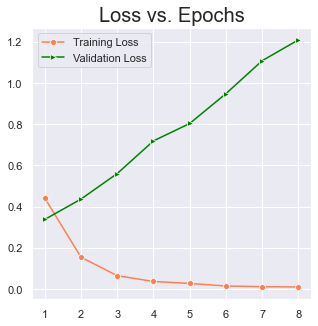

In [35]:
plot_learning_curve(h1)

In [36]:
loss, acc = model1.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 6ms/step - loss: 0.3273 - accuracy: 0.8625
Testing Loss:  32.73244500160217
Testing Accuracy:  86.24777793884277


<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>This model is clearly overfitting, we will add regularization to the next iteration
 </span></ul></h4>

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Batch Normalization</span></strong></li>
</ul></h4>

In [37]:
# define model

model2 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    BatchNormalization(),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model2.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [38]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h2 = model2.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.66638 >|> 
 ~| Epoch: 2 | Validation Loss: 0.72617 >|> 
 ~| Epoch: 3 | Validation Loss: 0.44306 >|> 
 ~| Epoch: 4 | Validation Loss: 0.56813 >|> 
 ~| Epoch: 5 | Validation Loss: 0.42626 >|> 
 ~| Epoch: 6 | Validation Loss: 0.52981 >|> 
 ~| Epoch: 7 | Validation Loss: 0.62305 >|> 
 ~| Epoch: 8 | Validation Loss: 0.55789 >|> 
 ~| Epoch: 9 | Validation Loss: 0.90662 >|> 

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 10 | Validation Loss: 0.51133 >|> 
 ~| Epoch: 11 | Validation Loss: 0.78763 >|> 
 ~| Epoch: 12 | Validation Loss: 0.77035 >|> 

Training Done.


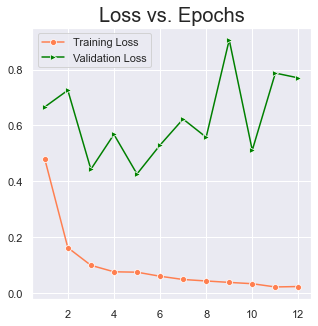

In [39]:
plot_learning_curve(h2)

In [40]:
loss, acc = model2.evaluate(X_test_padded, y_test)
print("Testing Loss: ", loss*100)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 9ms/step - loss: 0.4056 - accuracy: 0.8376
Testing Loss:  40.56009352207184
Testing Accuracy:  83.75815153121948


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Simple Feed-Forward Neural Net + Dropout</span></strong></li>
</ul></h4>

In [41]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Flatten(),
    Dense(20, activation = 'relu'),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [42]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.38415 >|> 
 ~| Epoch: 2 | Validation Loss: 0.33411 >|> 
 ~| Epoch: 3 | Validation Loss: 0.38989 >|> 
 ~| Epoch: 4 | Validation Loss: 0.49732 >|> 
 ~| Epoch: 5 | Validation Loss: 0.52464 >|> 
 ~| Epoch: 6 | Validation Loss: 0.54575 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.64775 >|> 
 ~| Epoch: 8 | Validation Loss: 0.67945 >|> 
 ~| Epoch: 9 | Validation Loss: 0.69136 >|> 

Training Done.


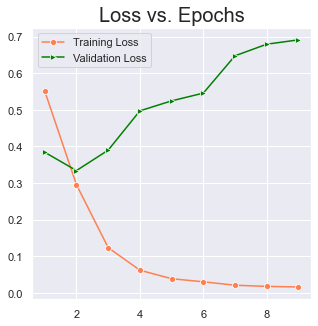

In [43]:
plot_learning_curve(h3)

In [44]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 4ms/step - loss: 0.3274 - accuracy: 0.8583
Testing Accuracy:  85.83284020423889


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use pre-trained embeddings</span></strong></li>
</ul></h4>

In [45]:
# define model

model3 = Sequential([ 
    Embedding(input_dim=NUM_WORDS, output_dim=EMBEDDING_DIM, input_length=MAX_LEN, weights=[embedding_matrix], trainable=True),
    Flatten(),
    Dense(30, activation = 'relu'),
    Dropout(0.5),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model3.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [46]:
EPOCHS = 200
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h3 = model3.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.38540 >|> 
 ~| Epoch: 2 | Validation Loss: 0.41342 >|> 
 ~| Epoch: 3 | Validation Loss: 0.39803 >|> 
 ~| Epoch: 4 | Validation Loss: 0.45770 >|> 
 ~| Epoch: 5 | Validation Loss: 0.50492 >|> 

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 6 | Validation Loss: 0.56770 >|> 
 ~| Epoch: 7 | Validation Loss: 0.61330 >|> 
 ~| Epoch: 8 | Validation Loss: 0.69508 >|> 

Training Done.


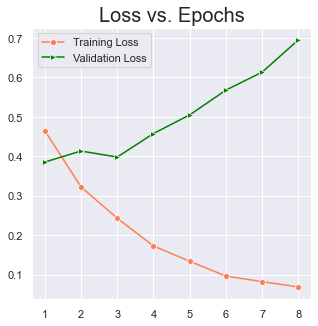

In [47]:
plot_learning_curve(h3)

In [48]:
loss, acc = model3.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 6ms/step - loss: 0.3927 - accuracy: 0.8275
Testing Accuracy:  82.75044560432434


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">LSTM</span></strong></li>
</ul></h4>

In [49]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    LSTM(32),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [50]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.68090 >|> 
 ~| Epoch: 2 | Validation Loss: 0.67834 >|> 
 ~| Epoch: 3 | Validation Loss: 0.65052 >|> 
 ~| Epoch: 4 | Validation Loss: 0.67962 >|> 
 ~| Epoch: 5 | Validation Loss: 0.68195 >|> 
 ~| Epoch: 6 | Validation Loss: 0.66145 >|> 
 ~| Epoch: 7 | Validation Loss: 0.67785 >|> 

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 8 | Validation Loss: 0.55761 >|> 
 ~| Epoch: 9 | Validation Loss: 0.56050 >|> 
 ~| Epoch: 10 | Validation Loss: 0.58099 >|> 
 ~| Epoch: 11 | Validation Loss: 0.61384 >|> 
 ~| Epoch: 12 | Validation Loss: 0.53396 >|> 
 ~| Epoch: 13 | Validation Loss: 0.53542 >|> 
 ~| Epoch: 14 | Validation Loss: 0.52415 >|> 
 ~| Epoch: 15 | Validation Loss: 0.53307 >|> 
 ~| Epoch: 16 | Validation Loss: 0.52474 >|> 
 ~| Epoch: 17 | Validation Loss: 0.53513 >|> 
 ~| Epoch: 18 | Validation Loss: 0.57956 >|> 

Epoch 00018: ReduceLROnPlateau reducing learning rate to 0.00016000000759959222.
 

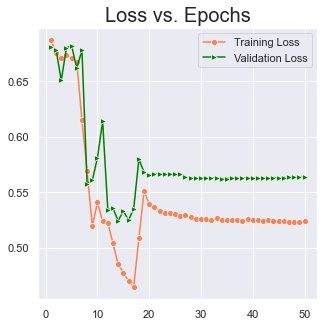

In [51]:
plot_learning_curve(h4)

In [52]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 10ms/step - loss: 0.5702 - accuracy: 0.6544
Testing Accuracy:  65.44161438941956


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [55]:
# define model

model4 = Sequential([ 
    Embedding(input_dim=VOCAB_SIZE, output_dim=EMBEDDING_DIM, input_length=MAX_LEN),
    Bidirectional(LSTM(32)),
    Dropout(0.4),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model4.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [56]:
EPOCHS = 50
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h4 = model4.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.34246 >|> 
 ~| Epoch: 2 | Validation Loss: 0.34657 >|> 
 ~| Epoch: 3 | Validation Loss: 0.35232 >|> 
 ~| Epoch: 4 | Validation Loss: 0.37244 >|> 
 ~| Epoch: 5 | Validation Loss: 0.41386 >|> 

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 6 | Validation Loss: 0.46064 >|> 
 ~| Epoch: 7 | Validation Loss: 0.49689 >|> 
 ~| Epoch: 8 | Validation Loss: 0.52922 >|> 

Training Done.


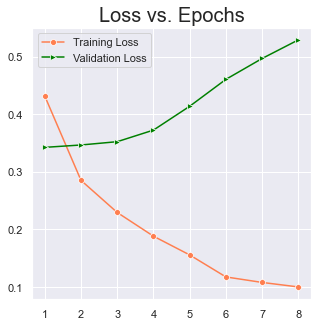

In [57]:
plot_learning_curve(h4)

In [58]:
loss, acc = model4.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 12ms/step - loss: 0.3354 - accuracy: 0.8524
Testing Accuracy:  85.24007201194763


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + LSTM</span></strong></li>
</ul></h4>

In [59]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    LSTM(75),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [60]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.42078 >|> 
 ~| Epoch: 2 | Validation Loss: 0.41046 >|> 
 ~| Epoch: 3 | Validation Loss: 0.57248 >|> 
 ~| Epoch: 4 | Validation Loss: 0.47355 >|> 
 ~| Epoch: 5 | Validation Loss: 0.73653 >|> 
 ~| Epoch: 6 | Validation Loss: 0.52240 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.73506 >|> 
 ~| Epoch: 8 | Validation Loss: 0.78235 >|> 
 ~| Epoch: 9 | Validation Loss: 0.80333 >|> 

Training Done.


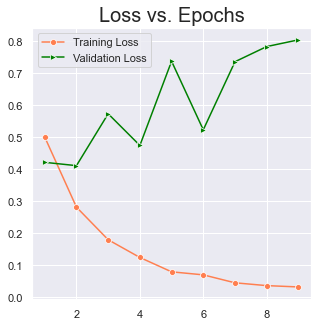

In [61]:
plot_learning_curve(h5)

In [62]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 1s 12ms/step - loss: 0.3900 - accuracy: 0.8447
Testing Accuracy:  84.469473361969


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">CNN (Dimensionality Reduction) + Bi-Directional LSTM</span></strong></li>
</ul></h4>

In [63]:
model5 = Sequential([
    Embedding(input_dim=VOCAB_SIZE, output_dim=256, input_length=MAX_LEN),
    Dropout(0.25),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    Conv1D(256, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Conv1D(64, 5, padding = 'same', activation = 'relu', strides = 1),
    MaxPooling1D(pool_size = 2),
    Bidirectional(LSTM(75, recurrent_dropout=0.5)),
    Dense(NUM_CLASSES, activation = 'softmax')
])

model5.compile(
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [64]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)
except Exception as e:
    print(e)
    print("Training on CPU:")
    h5 = model5.fit(
            X_train_padded, y_train,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop, lr_reduce_on_plateau],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.34703 >|> 
 ~| Epoch: 2 | Validation Loss: 0.34499 >|> 
 ~| Epoch: 3 | Validation Loss: 0.49440 >|> 
 ~| Epoch: 4 | Validation Loss: 0.50982 >|> 
 ~| Epoch: 5 | Validation Loss: 0.63177 >|> 
 ~| Epoch: 6 | Validation Loss: 0.65818 >|> 

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
 ~| Epoch: 7 | Validation Loss: 0.77149 >|> 
 ~| Epoch: 8 | Validation Loss: 0.77925 >|> 
 ~| Epoch: 9 | Validation Loss: 0.82289 >|> 

Training Done.


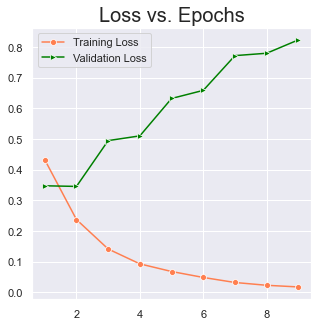

In [65]:
plot_learning_curve(h5)

In [66]:
loss, acc = model5.evaluate(X_test_padded, y_test)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 4s 77ms/step - loss: 0.3487 - accuracy: 0.8500
Testing Accuracy:  85.00296473503113


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection</span></strong></li>
</ul></h4>

In [67]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# using 75-25 split instead of 50-50 split as we need more data to train neural nets
X_train_vec, X_test_vec, y_train_vec, y_test_vec = train_test_split(X, y, test_size=0.2, random_state=seed)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745,), 
Test dataset shape: (1687,)


In [68]:
NGRAM_RANGE = (1, 2)
TOP_K = 10000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2


kwargs = {
    'ngram_range' : NGRAM_RANGE,
    'dtype' : 'int32',
    'strip_accents' : 'unicode',
    'decode_error' : 'replace',
    'analyzer' : TOKEN_MODE,
    'min_df' : MIN_DOC_FREQ
}
vectorizer = TfidfVectorizer(**kwargs)
X_train_vec = vectorizer.fit_transform(X_train_vec)
X_test_vec = vectorizer.transform(X_test_vec)
print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 17085), 
Test dataset shape: (1687, 17085)


In [69]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select best k features, with feature importance measured by f_classif
# Set k as 20000 or (if number of ngrams is less) number of ngrams   
selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
selector.fit(X_train_vec, y_train_vec)
X_train_vec = selector.transform(X_train_vec).astype('float32')
X_test_vec = selector.transform(X_test_vec).astype('float32')
X_train_vec = X_train_vec.toarray()
X_test_vec = X_test_vec.toarray()

print(f"Train dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")

Train dataset shape: (6745, 10000), 
Test dataset shape: (1687, 10000)


In [70]:
model6 = Sequential([
    Dense(20, activation='relu', input_shape=X_train_vec.shape[1:]),
    Dropout(0.5),
    Dense(20, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model6.compile(
    loss = 'binary_crossentropy',
    optimizer = 'rmsprop',
    metrics = ['accuracy']
)

In [71]:
EPOCHS = 20
try:
    print("Training on GPU:")
    with tensorflow.device("gpu:0"):  # train on gpu
        h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)
except Exception:
    print("Training on CPU:")
    h6 = model6.fit(
            X_train_vec, y_train_vec,
            validation_split = 0.2,  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [simple_log, early_stop],
            verbose = False)

print("\nTraining Done.")

Training on GPU:
 ~| Epoch: 1 | Validation Loss: 0.55280 >|> 
 ~| Epoch: 2 | Validation Loss: 0.38299 >|> 
 ~| Epoch: 3 | Validation Loss: 0.32426 >|> 
 ~| Epoch: 4 | Validation Loss: 0.30529 >|> 
 ~| Epoch: 5 | Validation Loss: 0.30012 >|> 
 ~| Epoch: 6 | Validation Loss: 0.29826 >|> 
 ~| Epoch: 7 | Validation Loss: 0.29672 >|> 
 ~| Epoch: 8 | Validation Loss: 0.29396 >|> 
 ~| Epoch: 9 | Validation Loss: 0.29277 >|> 
 ~| Epoch: 10 | Validation Loss: 0.29358 >|> 
 ~| Epoch: 11 | Validation Loss: 0.29257 >|> 
 ~| Epoch: 12 | Validation Loss: 0.29779 >|> 
 ~| Epoch: 13 | Validation Loss: 0.29718 >|> 
 ~| Epoch: 14 | Validation Loss: 0.30539 >|> 
 ~| Epoch: 15 | Validation Loss: 0.29990 >|> 
 ~| Epoch: 16 | Validation Loss: 0.30262 >|> 
 ~| Epoch: 17 | Validation Loss: 0.30239 >|> 
 ~| Epoch: 18 | Validation Loss: 0.30721 >|> 

Training Done.


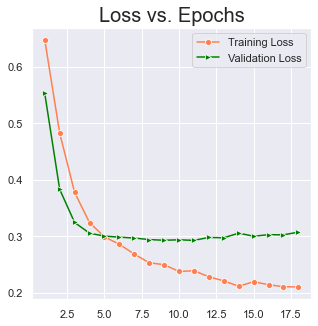

In [72]:
plot_learning_curve(h6)

In [73]:
loss, acc = model6.evaluate(X_test_vec, y_test_vec)
print("Testing Accuracy: ", acc*100)

53/53 [==============================] - 0s 3ms/step - loss: 0.3555 - accuracy: 0.8577
Testing Accuracy:  85.77356338500977


<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Use TfIdf vectors instead of Embedding Layer + Feature Selection + Stratified KFold Training</span></strong></li>
</ul></h4>


Train dataset shape: (7026, 17394), 
Test dataset shape: (1406, 17394)

Features Train dataset shape: (7026, 10000), 
FeaturesTest dataset shape: (1406, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.85064, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00002: val_accuracy improved from 0.85064 to 0.85989, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00003: val_accuracy did not improve from 0.85989

Epoch 00004: val_accuracy improved from 0.85989 to 0.86060, saving model to models\binary_classfiier\dl\merged_descr\model_1.h5

Epoch 00005: val_accuracy did not improve from 0.86060

Epoch 00006: val_accuracy did not improve from 0.86060

Epoch 00007: val_accuracy did not improve from 0.86060

Epoch 00008: val_accuracy did not improve from 0.86060

Epoch 00009: val_accuracy did not improve from 0.86060


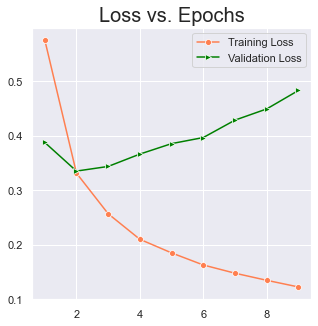

44/44 [==============================] - 0s 7ms/step - loss: 0.3662 - accuracy: 0.8606
Testing Accuracy:  86.05974316596985

Train dataset shape: (7026, 16511), 
Test dataset shape: (1406, 16511)

Features Train dataset shape: (7026, 10000), 
FeaturesTest dataset shape: (1406, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.84068, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00002: val_accuracy improved from 0.84068 to 0.86060, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00003: val_accuracy improved from 0.86060 to 0.86415, saving model to models\binary_classfiier\dl\merged_descr\model_2.h5

Epoch 00004: val_accuracy did not improve from 0.86415

Epoch 00005: val_accuracy did not improve from 0.86415

Epoch 00006: val_accuracy did not improve from 0.86415

Epoch 00007: val_accuracy did not improve from 0.86415

Epoch 00008: val_accuracy did not improve from 0.86415

Epoch 00009: val_accuracy did not improve from 0.8

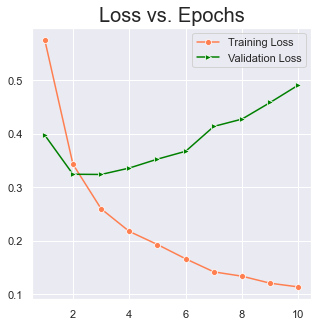

44/44 [==============================] - 0s 6ms/step - loss: 0.3239 - accuracy: 0.8642
Testing Accuracy:  86.41536235809326

Train dataset shape: (7027, 17654), 
Test dataset shape: (1405, 17654)

Features Train dataset shape: (7027, 10000), 
FeaturesTest dataset shape: (1405, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.84413, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00002: val_accuracy improved from 0.84413 to 0.85765, saving model to models\binary_classfiier\dl\merged_descr\model_3.h5

Epoch 00003: val_accuracy did not improve from 0.85765

Epoch 00004: val_accuracy did not improve from 0.85765

Epoch 00005: val_accuracy did not improve from 0.85765

Epoch 00006: val_accuracy did not improve from 0.85765

Epoch 00007: val_accuracy did not improve from 0.85765

Epoch 00008: val_accuracy did not improve from 0.85765

Epoch 00009: val_accuracy did not improve from 0.85765


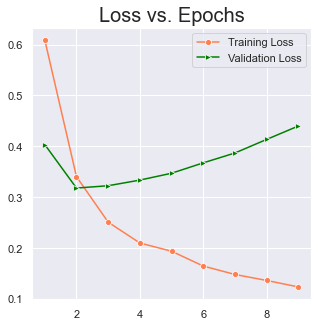

44/44 [==============================] - 0s 3ms/step - loss: 0.3175 - accuracy: 0.8577
Testing Accuracy:  85.76512336730957

Train dataset shape: (7027, 16823), 
Test dataset shape: (1405, 16823)

Features Train dataset shape: (7027, 10000), 
FeaturesTest dataset shape: (1405, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.84342, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00002: val_accuracy improved from 0.84342 to 0.84840, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00003: val_accuracy improved from 0.84840 to 0.85480, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00004: val_accuracy improved from 0.85480 to 0.85907, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00005: val_accuracy improved from 0.85907 to 0.85979, saving model to models\binary_classfiier\dl\merged_descr\model_4.h5

Epoch 00006: val_accuracy did not improve from 0.85979

Epoch 00007: val

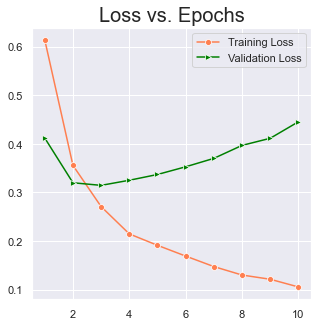

44/44 [==============================] - 0s 3ms/step - loss: 0.3369 - accuracy: 0.8598
Testing Accuracy:  85.97864508628845

Train dataset shape: (7027, 17284), 
Test dataset shape: (1405, 17284)

Features Train dataset shape: (7027, 10000), 
FeaturesTest dataset shape: (1405, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.85979, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00002: val_accuracy improved from 0.85979 to 0.86121, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00003: val_accuracy did not improve from 0.86121

Epoch 00004: val_accuracy improved from 0.86121 to 0.86335, saving model to models\binary_classfiier\dl\merged_descr\model_5.h5

Epoch 00005: val_accuracy did not improve from 0.86335

Epoch 00006: val_accuracy did not improve from 0.86335

Epoch 00007: val_accuracy did not improve from 0.86335

Epoch 00008: val_accuracy did not improve from 0.86335

Epoch 00009: val_accuracy did not improve from 0.8

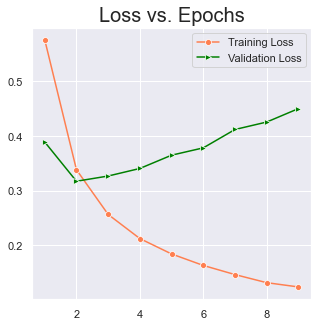

44/44 [==============================] - 0s 8ms/step - loss: 0.3407 - accuracy: 0.8633
Testing Accuracy:  86.3345205783844

Train dataset shape: (7027, 17779), 
Test dataset shape: (1405, 17779)

Features Train dataset shape: (7027, 10000), 
FeaturesTest dataset shape: (1405, 10000)

Epoch 00001: val_accuracy improved from -inf to 0.85552, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00002: val_accuracy improved from 0.85552 to 0.87117, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00003: val_accuracy improved from 0.87117 to 0.87829, saving model to models\binary_classfiier\dl\merged_descr\model_6.h5

Epoch 00004: val_accuracy did not improve from 0.87829

Epoch 00005: val_accuracy did not improve from 0.87829

Epoch 00006: val_accuracy did not improve from 0.87829

Epoch 00007: val_accuracy did not improve from 0.87829

Epoch 00008: val_accuracy did not improve from 0.87829

Epoch 00009: val_accuracy did not improve from 0.87

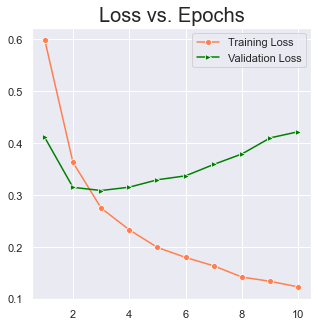

44/44 [==============================] - 0s 7ms/step - loss: 0.3085 - accuracy: 0.8783
Testing Accuracy:  87.82917857170105


In [74]:
from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_extraction.text import TfidfVectorizer


def get_model_name(k):
    return f'model_{k}.h5'

NUM_SPLITS = 6
EPOCHS = 20
save_dir = Path('./models/binary_classfiier/dl/merged_descr')
fold_var = 1
NGRAM_RANGE = (1, 2)
TOP_K = 10000
TOKEN_MODE = 'word'
MIN_DOC_FREQ = 2
NUM_CLASSES = 2

kwargs = {
        'ngram_range' : NGRAM_RANGE,
        'dtype' : 'int32',
        'strip_accents' : 'unicode',
        'decode_error' : 'replace',
        'analyzer' : TOKEN_MODE,
        'min_df' : MIN_DOC_FREQ
    }

val_accs = []
skf = StratifiedKFold(n_splits=NUM_SPLITS, shuffle=True, random_state=0)

for train_indices, test_indices in skf.split(X, y):
    X_train_split, X_test_split = X[train_indices], X[test_indices]
    y_train_split, y_test_split = y[train_indices], y[test_indices]
    vectorizer = TfidfVectorizer(**kwargs)
    X_train_vec = vectorizer.fit_transform(X_train_split)
    X_test_vec = vectorizer.transform(X_test_split)
    print(f"\nTrain dataset shape: {X_train_vec.shape}, \nTest dataset shape: {X_test_vec.shape}")
	
    selector = SelectKBest(f_classif, k=min(TOP_K, X_train_vec.shape[1]))
    selector.fit(X_train_vec, y_train_split)
    X_train_vec = selector.transform(X_train_vec).astype('float32')
    X_test_vec = selector.transform(X_test_vec).astype('float32')
    X_train_vec = X_train_vec.toarray()
    X_test_vec = X_test_vec.toarray()

    print(f"\nFeatures Train dataset shape: {X_train_vec.shape}, \nFeaturesTest dataset shape: {X_test_vec.shape}")
    model_ = None
    model_ = Sequential([   
        Dense(20, activation='relu', input_shape=X_train_vec.shape[1:]),
        Dropout(0.5),
        Dense(20, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model_.compile(
        loss = 'binary_crossentropy',
        optimizer = 'adam',
        metrics = ['accuracy']
    )
    
    checkpoint = tensorflow.keras.callbacks.ModelCheckpoint(save_dir / get_model_name(fold_var),
                                                            monitor='val_accuracy',
                                                            verbose=1,
                                                            save_best_only=True,
                                                            mode='max')

    h_ = model_.fit(
            X_train_vec, y_train_split,
            validation_data = (X_test_vec, y_test_split),  # do not use the test data for validation to prevent data leakage, we only use to test at the model in the end
            epochs = EPOCHS,
            callbacks = [checkpoint, early_stop],
            verbose = False)
    
    model_.load_weights(save_dir / get_model_name(fold_var))
    plot_learning_curve(h_)
    loss, acc = model_.evaluate(X_test_vec, y_test_split)
    print("Testing Accuracy: ", acc*100)
    val_accs.append(acc)
    tensorflow.keras.backend.clear_session()
    fold_var += 1

In [75]:
print("Testing Accuracy: ", np.mean(val_accs)*100)   # average k fold accuracy

Testing Accuracy:  86.3970955212911


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Metrics: </span></strong></li>
</ul></h3>

<table style="width:100%">
  <tr>
    <th>Model</th>
    <th>Test Accuracy</th>
  </tr>
  <tr>
    <td>Simple Feed-Forward Net using Embedding Layer</td>
    <td>86.25%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Batch Norm</td>
    <td>83.76%</td>
  </tr>
<tr>
    <td>Feed-Forward NN + Dropout</td>
    <td>85.83%</td>
  </tr>
    <tr>
    <td>Feed-Forward NN + Pre-trained GloVe embeddings</td>
    <td>82.75%</td>
  </tr>
  <tr>
    <td>LSTM</td>
    <td>65.44%</td>
  </tr>
    
  <tr>
    <td>Bi-Directional LSTM</td>
    <td>85.24%</td>
  </tr>
<tr>
    <td>Convolution Blocks (Dimensionality Reduction) + LSTM</td>
    <td>84.47%</td>
  </tr>
    <tr>
    <td>Convolution Blocks (Dimensionality Reduction) + Bi-LSTM</td>
    <td>85.00%</td>
  </tr>
<tr>
    <td>TfIdf Vectors + Feature Selection + Feed-forward Neural Net</td>
    <td>85.77%</td>
  </tr>
<tr>
    <td>Stratified KFold Validation + TfIdf Vectors + Feature Selection + +Feed-forward Neural Net</td>
    <td>86.40%</td>
  </tr>
</table>